# Turtle Games project: using predictive modelling to uncover insights

## About the project

Turtle Games is a fictional game manufacturer and retailer with a global customer base. They sell and manufacture their own products as well as sourcing and selling products manufactured by other companies. They sell products such as books, board games, video games, and toys.

Their ***overall business objective*** is to ***improve overall sales performance.*** To do this, they want to find out:

1. How do customers engage with and accumulate loyalty points? (Are loyalty points an important metric?)
2. How can customers be segmented into groups, and which groups can be targeted by the marketing department?
3. How can text data from the customer reviews be used to inform marketing campaigns and make improvements to the business?
4. Can we use descriptive statistics to provide insights into the suitability of the loyalty points data to create predictive models?


To answer these questions, I will first conduct exploratory analysis of the data before moving on to using predictive modelling. 

***Important assumption***

I have made an assumption that there can be multiple rows for each customer as each customer can write multiple reviews. Before importing the data into Python, I loaded the CSV into Excel. When filtering the columns for example by age and gender, I noticed that there were lots of examples where mutiple rows have the same gender, age, remuneration (income), spending score, loyalty points, and education, but different product number and reviews. As there are only 2000 rows, it is very unlikely that each row is a different person, espeically as the remuneration (income) values are very precise. Later on in this notebook, I create a "customer_id" column so I can properly treat these people as distinct.
If I had been able to speak to the stakeholders, I would have clarified this assumption with them.
Here is an example of the duplicated parts of rows from Excel:
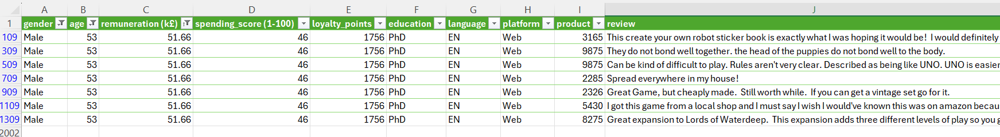

## Prepare the data

### 1. Import libraries.

In [8]:
# Import libraries.
!pip install WordCloud
!pip install contractions
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn import metrics
import statsmodels.api as sm 
from sklearn.linear_model import LinearRegression
from statsmodels.formula.api import ols
import statsmodels.stats.api as sms
from statsmodels.graphics.gofplots import qqplot
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import make_scorer, mean_absolute_error, mean_squared_error, r2_score, silhouette_score
import scipy.stats as stats
import imblearn
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier, plot_tree
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, RandomForestClassifier
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import KMeans
import contractions
import re
import nltk
from nltk import word_tokenize, pos_tag
from collections import defaultdict
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.corpus import wordnet as wn
from nltk.stem import WordNetLemmatizer, PorterStemmer
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
from wordcloud import WordCloud
from nltk.probability import FreqDist
from nltk.tag import pos_tag_sents
from collections import Counter
from IPython.display import display
import itertools

# Download necessary NLTK data files
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger_eng')

# Ignore warnings.
import warnings
warnings.filterwarnings('ignore')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\jmrob\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\jmrob\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\jmrob\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     C:\Users\jmrob\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger_eng is already up-to-
[nltk_data]       date!


### 2. Create functions.

In [10]:
# Validate the data function.
def validate_data(df):
    # Check the data types.
    data_types = df.dtypes
    print("Data types:")
    print(data_types)

    # Check the data shape.
    data_shape = df.shape
    print("Data shape:")
    print(data_shape)
    
    # Check for unique values
    unique_counts = df.nunique()
    print("Unique values per column:")
    print(unique_counts)
    
    # Check for duplicates
    duplicate_count = df.duplicated().sum()
    print("\nNumber of duplicate rows:")
    print(duplicate_count)
    
    # Summary statistics
    summary_stats = df.describe()
    print("\nSummary statistics:")
    print(summary_stats)
    
    return data_types, data_shape, unique_counts, duplicate_count, summary_stats

In [11]:
# Function to create a count plot.
def count_plot(df, column, title="Count Plot", xlabel=None, ylabel="Count", order=None, palette="colorblind", legend_title=None, **kwargs):

    # Sort the count of the categories in descending order.
    if order is None:
        order = df[column].value_counts().index

    # Create the count plot
    plt.figure(figsize=(10, 6))
    sns.countplot(data=df, x=column, palette=palette, order=order, **kwargs)

    # Get the axes so that the legend part of this function works.
    ax = plt.gca()
    
    # Set labels and title
    plt.title(title, fontsize=14)
    plt.xlabel(xlabel if xlabel else column.title(), fontsize=12) 
    plt.ylabel(ylabel, fontsize=12)
    plt.xticks(rotation=45)
    
    # Add a legend if there are handles.
    handles, labels = ax.get_legend_handles_labels()
    if handles:
        plt.legend(handles, labels, title=legend_title, loc="upper left", bbox_to_anchor=(1, 1))

    # Save the figure using the title of the plot and show the plot
    plt.tight_layout()
    
    clean_title = re.sub(r'[^\w\s-]', '', title.replace("\n", " ")).strip().replace(' ', '_').lower()
    filename = f"{clean_title}.png"
    
    plt.savefig(filename, dpi=500, bbox_inches="tight")
    
    plt.show()

In [12]:
# Function to create a vertical bar plot.
def bar_plot(df, x_column, y_column, title="Bar Plot", xlabel=None, ylabel=None, order=None, palette="colorblind", legend_title=None, **kwargs):

    # Sort the count of the categories into descending order.
    if order is None:
        order = df[x_column].value_counts().index

    # Create the bar plot
    plt.figure(figsize=(10, 6))
    sns.barplot(data=df, x=x_column, y=y_column, palette=palette, **kwargs)

    # Get the axes so that the legend part of this function works.
    ax = plt.gca()

    # Set labels and title
    plt.title(title, fontsize=14)
    plt.xlabel(xlabel if xlabel else x_column.title(), fontsize=12)
    plt.ylabel(ylabel, fontsize=12)
    plt.xticks(rotation=45)
    

    # Add a legend if there are handles.
    handles, labels = ax.get_legend_handles_labels()
    if handles:
        plt.legend(handles, labels, title=legend_title, loc="upper left", bbox_to_anchor=(1, 1))

    # Save the figure using the title of the plot and show the plot
    plt.tight_layout()
    
    clean_title = re.sub(r'[^\w\s-]', '', title.replace("\n", " ")).strip().replace(' ', '_').lower()
    filename = f"{clean_title}.png"
    
    plt.savefig(filename, dpi=500, bbox_inches="tight")
    
    plt.show()

In [13]:
# Function to create a horizontal bar plot
def horizontal_bar_plot(df, x_column, y_column, title="Bar Plot", xlabel=None, ylabel=None, legend_title=None, 
                        order=None, palette="colorblind", **kwargs):

    # Sort the count of the categories into descending order.
    if order is None:
        order = df[x_column].sort_values(ascending=False).index

    # Create the bar plot
    plt.figure(figsize=(10, 6))
    sns.barplot(data=df, x=y_column, y=x_column, palette=palette, **kwargs)

    # Get the axes so that the legend part of this function works.
    ax = plt.gca()

    # Set labels and title
    plt.title(title, fontsize=14)
    plt.xlabel(xlabel if xlabel else x_column.replace("_", " ").title(), fontsize=12)
    plt.ylabel(ylabel if ylabel else y_column.replace("_", " ").title(), fontsize=12)
    plt.xticks(rotation=45)

    # Add a legend if there are handles.
    handles, labels = ax.get_legend_handles_labels()
    if handles:
        plt.legend(handles, labels, title=legend_title, loc="upper left", bbox_to_anchor=(1, 1))
    
    # Save the figure using the title of the plot and show the plot
    plt.tight_layout()
    
    clean_title = re.sub(r'[^\w\s-]', '', title.replace("\n", " ")).strip().replace(' ', '_').lower()
    filename = f"{clean_title}.png"
    
    plt.savefig(filename, dpi=500, bbox_inches="tight")
    
    plt.show()

In [14]:
# Function to create a grouped count plot.
def grouped_count_plot(df, x_column, hue_column, title="Grouped Count Plot", xlabel=None, ylabel="Count", order=None, palette="colorblind",
                       legend_title=None, **kwargs):

    if order is None:
        order = df[x_column].value_counts().index

    # Create the grouped count plot.
    plt.figure(figsize=(10, 6))
    sns.countplot(data=df, x=x_column, hue=hue_column, order=order, palette=palette, **kwargs)

    # Get the axes so that the legend part of this function works.
    ax = plt.gca()
        
    # Set labels and title
    plt.title(title, fontsize=14)
    plt.xlabel(xlabel if xlabel else x_column.title(), fontsize=12)
    plt.ylabel(ylabel, fontsize=12)
    plt.xticks(rotation=45)
    

    # Add a legend if there are handles.
    handles, labels = ax.get_legend_handles_labels()
    if handles:
        plt.legend(handles, labels, title=legend_title, loc="upper left", bbox_to_anchor=(1, 1))

    # Save the figure using the title of the plot and show the plot
    plt.tight_layout()
    
    clean_title = re.sub(r'[^\w\s-]', '', title.replace("\n", " ")).strip().replace(' ', '_').lower()
    filename = f"{clean_title}.png"
    
    plt.savefig(filename, dpi=500, bbox_inches="tight")
    
    plt.show()

In [15]:
# Function to create a grouped bar plot.
def grouped_bar_plot(df, x_column, y_column, hue_column, title="Grouped Bar Plot", xlabel=None, ylabel="Count", order=None, palette="colorblind", 
                     legend_title=None, **kwargs):

    # If no custom order is provided, use default order
    if order is None:
        order = df[x_column].value_counts().index

    # Created the grouped bar plot
    plt.figure(figsize=(10, 6))
    sns.barplot(data=df, x=x_column, y=y_column, hue=hue_column, order=order, palette=palette, **kwargs)

    # Get the axes so that the legend part of this function works.
    ax = plt.gca()

    # Set labels and title.
    plt.title(title, fontsize=14)
    plt.xlabel(xlabel if xlabel else x_column.title(), fontsize=12)
    plt.ylabel(ylabel, fontsize=12)
    plt.xticks(rotation=45)

    # Add a legend if there are handles.
    handles, labels = ax.get_legend_handles_labels()
    if handles:
        plt.legend(handles, labels, title=legend_title, loc="upper left", bbox_to_anchor=(1, 1))

    # Save the figure using the title of the plot and show the plot
    plt.tight_layout()
    
    clean_title = re.sub(r'[^\w\s-]', '', title.replace("\n", " ")).strip().replace(' ', '_').lower()
    filename = f"{clean_title}.png"
    
    plt.savefig(filename, dpi=500, bbox_inches="tight")
    
    plt.show()

In [16]:
# Function to create a scatter plot.
def scatter_plot(df, x_column, y_column, title="Scatter Plot", xlabel=None, ylabel=None, palette="colorblind", legend_title=None, **kwargs):

    # Create the scatter plot
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=df, x=x_column, y=y_column, palette=palette, **kwargs)

    # Get the axes so that the legend part of this function works.
    ax = plt.gca()

    # Set labels and title
    plt.title(title, fontsize=14)
    plt.xlabel(xlabel if xlabel else x_column.replace("_", " ").title(), fontsize=12)
    plt.ylabel(ylabel if ylabel else y_column.replace("_", " ").title(), fontsize=12)

    # Add a legend if there are handles.
    handles, labels = ax.get_legend_handles_labels()
    if handles:
        plt.legend(handles, labels, title=legend_title, loc="upper left", bbox_to_anchor=(1, 1))

    # Save the figure using the title of the plot and show the plot
    plt.tight_layout()
    
    clean_title = re.sub(r'[^\w\s-]', '', title.replace("\n", " ")).strip().replace(' ', '_').lower()
    filename = f"{clean_title}.png"
    
    plt.savefig(filename, dpi=500, bbox_inches="tight")
    
    plt.show()

In [17]:
# Function to create a box plot.
def box_plot(df, x_column, y_column, title="Box Plot", xlabel=None, ylabel=None, palette="colorblind", legend_title=None, **kwargs):
    plt.figure(figsize=(10, 6))

    # Create the boxplot without sorting categories
    sns.boxplot(data=df, x=x_column, y=y_column, palette=palette, **kwargs)

    # Get the axes so that the legend part of this function works.
    ax = plt.gca()

    # Set the labels and title
    plt.title(title, fontsize=14)
    plt.xlabel(xlabel if xlabel else x_column.replace("_", " ").title(), fontsize=12)
    plt.ylabel(ylabel if ylabel else y_column.replace("_", " ").title(), fontsize=12)

    # Add a legend if there are handles.
    handles, labels = ax.get_legend_handles_labels()
    if handles:
        plt.legend(handles, labels, title=legend_title, loc="upper left", bbox_to_anchor=(1, 1))
        
    # Save the figure using the title of the plot and show the plot
    plt.tight_layout()
    
    clean_title = re.sub(r'[^\w\s-]', '', title.replace("\n", " ")).strip().replace(' ', '_').lower()
    filename = f"{clean_title}.png"
    
    plt.savefig(filename, dpi=500, bbox_inches="tight")
    
    plt.show()

In [18]:
# Function to create a histogram.
counter = itertools.count(1)

def hist_plot(df, column, title="Histogram", xlabel=None, ylabel="Frequency", bins=10, palette="colorblind", **kwargs):

    # Create the histogram.
    plt.figure(figsize=(10, 6))
    sns.histplot(df[column], bins=bins, kde=True, palette=palette, **kwargs)

    # Get the axes so that the legend part of this function works.
    ax = plt.gca()

    # Set the labels and title.
    plt.title(title, fontsize=14)
    plt.xlabel(xlabel if xlabel else column.title(), fontsize=12)
    plt.ylabel(ylabel, fontsize=12)

    # Save the figure using the title of the plot and show the plot
    plt.tight_layout()
    
    clean_title = re.sub(r'[^\w\s-]', '', title.replace("\n", " ")).strip().replace(' ', '_').lower()
    count = next(counter)
    filename = f"{clean_title}_{count}.png"
    
    plt.savefig(filename, dpi=500, bbox_inches="tight")
    
    plt.show()

In [19]:

# Function to check for homoscedasticity.
counter = itertools.count(1)

def homoscedasticity_check(y_test, y_pred, model_name, title="Residual Plot"):
    
    # Calculate residuals.
    residuals = y_test - y_pred

    # Residual plot (should look randomly scattered).
    plt.scatter(y_pred, residuals)
    plt.axhline(y=0, color='red', linestyle='--')
    plt.xlabel("Predicted Values")
    plt.ylabel("Residuals")
    plt.title("Residual Plot")

    # Save the figure using the title of the plot and show the plot
    plt.tight_layout()

    clean_title = re.sub(r'[^\w\s-]', '', title.replace("\n", " ")).strip().replace(' ', '_').lower()
    count = next(counter)
    filename = f"{clean_title}_{count}.png"
    
    plt.savefig(filename, dpi=500, bbox_inches="tight")
    
    plt.show()

    # Run the Breusch-Pagan test function on the model residuals and X-variables.
    test = sms.het_breuschpagan(model_name.resid, model_name.model.exog)

    # Print the results of the Breusch-Pagan test.
    terms = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']
    print(dict(zip(terms, test)))

In [20]:
# Function to create a Q-Q plot.
counter = itertools.count(1)

def create_qqplot(y_test, y_pred, title="Q-Q plot"):
    
    # Calculate residuals.
    residuals = y_test - y_pred

    # Create the Q-Q plot.
    sm.qqplot(residuals, fit=True, line='45')
    plt.ylabel("Residual Quartiles")
    plt.xlabel("Normal Quartiles")
    plt.title("Q-Q plot")
    
    # Save the figure using the title of the plot and show the plot
    plt.tight_layout()

    clean_title = re.sub(r'[^\w\s-]', '', title.replace("\n", " ")).strip().replace(' ', '_').lower()
    count = next(counter)
    filename = f"{clean_title}_{count}.png"
    
    plt.savefig(filename, dpi=500, bbox_inches="tight")
    
    plt.show()

In [21]:
# Histogram of residuals.
counter = itertools.count(1)

def hist_residuals(y_test, y_pred, title="Residuals Distribution"):
    
    # Calculate residuals.
    residuals = y_test - y_pred

    # Create the histogram.
    sns.histplot(residuals, kde=True)
    plt.xlabel("Residuals")
    plt.title("Residuals Distribution")
    
    # Save the figure using the title of the plot and show the plot
    plt.tight_layout()

    clean_title = re.sub(r'[^\w\s-]', '', title.replace("\n", " ")).strip().replace(' ', '_').lower()
    count = next(counter)
    filename = f"{clean_title}_{count}.png"
    
    plt.savefig(filename, dpi=500, bbox_inches="tight")
    
    plt.show()

### 3. Load the data

In [23]:
# Load the CSV file(s) as reviews.
reviews = pd.read_csv('turtle_reviews.csv')

# View the DataFrame.
reviews.head()

,gender,age,remuneration (k£),spending_score (1-100),loyalty_points,education,language,platform,product,review,summary
0,Male,18,12.30,39,210,graduate,EN,Web,453,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,Male,23,12.30,81,524,graduate,EN,Web,466,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,Female,22,13.12,6,40,graduate,EN,Web,254,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Female,25,13.12,77,562,graduate,EN,Web,263,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,Female,33,13.94,40,366,graduate,EN,Web,291,As my review of GF9's previous screens these w...,Money trap


In [24]:
# View the bottom of the DataFrame to check that there isn't a footer.
reviews.tail()

,gender,age,remuneration (k£),spending_score (1-100),loyalty_points,education,language,platform,product,review,summary
1995,Female,37,84.46,69,4031,PhD,EN,Web,977,The perfect word game for mixed ages (with Mom...,The perfect word game for mixed ages (with Mom
1996,Female,43,92.66,8,539,PhD,EN,Web,979,Great game. Did not think I would like it whe...,Super fun
1997,Male,34,92.66,91,5614,graduate,EN,Web,1012,Great game for all.........\nKeeps the mind ni...,Great Game
1998,Male,34,98.40,16,1048,PhD,EN,Web,1031,fun game!,Four Stars
1999,Male,32,92.66,8,479,PhD,EN,Web,453,This game is fun. A lot like scrabble without ...,Love this game


### 4. Data cleaning and wrangling.

In [26]:
# Use the validate_data function to get some summary information about the DataFrame.
validate_data(reviews)

Data types:
gender                     object
age                         int64
remuneration (k£)         float64
spending_score (1-100)      int64
loyalty_points              int64
education                  object
language                   object
platform                   object
product                     int64
review                     object
summary                    object
dtype: object
Data shape:
(2000, 11)
Unique values per column:
gender                       2
age                         45
remuneration (k£)           64
spending_score (1-100)      84
loyalty_points             627
education                    5
language                     1
platform                     1
product                    200
review                    1980
summary                   1432
dtype: int64

Number of duplicate rows:
0

Summary statistics:
               age  remuneration (k£)  spending_score (1-100)  loyalty_points  \
count  2000.000000        2000.000000             2000.000000     

(gender                     object
 age                         int64
 remuneration (k£)         float64
 spending_score (1-100)      int64
 loyalty_points              int64
 education                  object
 language                   object
 platform                   object
 product                     int64
 review                     object
 summary                    object
 dtype: object,
 (2000, 11),
 gender                       2
 age                         45
 remuneration (k£)           64
 spending_score (1-100)      84
 loyalty_points             627
 education                    5
 language                     1
 platform                     1
 product                    200
 review                    1980
 summary                   1432
 dtype: int64,
 0,
                age  remuneration (k£)  spending_score (1-100)  loyalty_points  \
 count  2000.000000        2000.000000             2000.000000     2000.000000   
 mean     39.495000          48.079060             

- Data types are all fine.
- 11 columns and 2000 rows (small data set)
- "language" and "platform" columns only have one unique value so they are not useful to the analysis. These columns will be dropped.
- There are no rows that are completely duplicated.
- All the min and max values in the summary statistics are as expected so there aren't any outliers that are immediately obvious. However, I might discover outliers when creating scatterplots later in my analysis.

In [28]:
# Check for missing values.
reviews.isna().sum()

gender                    0
age                       0
remuneration (k£)         0
spending_score (1-100)    0
loyalty_points            0
education                 0
language                  0
platform                  0
product                   0
review                    0
summary                   0
dtype: int64

There are no missing values.

In [30]:
# Drop unnecessary columns.
reviews.drop(["language", "platform"], axis=1, inplace=True)

# View column names.
reviews.columns

Index(['gender', 'age', 'remuneration (k£)', 'spending_score (1-100)',
       'loyalty_points', 'education', 'product', 'review', 'summary'],
      dtype='object')

In [31]:
# Rename the column headers.
reviews.rename(columns={"remuneration (k£)": "income_k", "spending_score (1-100)":"spending_score"}, inplace=True)

# View column names.
reviews.columns

Index(['gender', 'age', 'income_k', 'spending_score', 'loyalty_points',
       'education', 'product', 'review', 'summary'],
      dtype='object')

I don't need to check unique values in each columns for the number columns as I've already checked the min and max values for these columns.

In [33]:
# Check unique "gender" values.
reviews["gender"].unique()

array(['Male', 'Female'], dtype=object)

In [34]:
# Check unique "education" values
reviews["education"].unique()

array(['graduate', 'PhD', 'diploma', 'postgraduate', 'Basic'],
      dtype=object)

There isn't an explanation of "Basic" in the metadata file, but I'm assuming that it means they haven't completed school.
There isn't consistent capitalisation and it's unclear what "Basic" and "diploma" mean.

In [36]:
# Rename values in the "education" column.
reviews["education"].replace({"Basic":"Not completed school", "diploma":"Completed school",
                             "graduate":"Graduate", "postgraduate":"Postgraduate"}, inplace=True)
# Check unique "education" values
reviews["education"].unique()

array(['Graduate', 'PhD', 'Completed school', 'Postgraduate',
       'Not completed school'], dtype=object)

In [37]:
# View column names again.
reviews.columns

Index(['gender', 'age', 'income_k', 'spending_score', 'loyalty_points',
       'education', 'product', 'review', 'summary'],
      dtype='object')

In [38]:
# Create a customer_id column. This means that analysis can be done on the individual customer. If this wasn't done, there would be duplicates
# of ages, income, spending scores etc. because one customer can write multiple reviews.
reviews["customer_id"] = reviews.groupby(
    ["gender", "age", "income_k", "spending_score", "loyalty_points", "education"]).ngroup() + 1

# View the DataFrame.
reviews.head()

,gender,age,income_k,spending_score,loyalty_points,education,product,review,summary,customer_id
0,Male,18,12.30,39,210,Graduate,453,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...,444
1,Male,23,12.30,81,524,Graduate,466,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...,485
2,Female,22,13.12,6,40,Graduate,254,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless",14
3,Female,25,13.12,77,562,Graduate,263,Amazing buy! Bought it as a gift for our new d...,Five Stars,45
4,Female,33,13.94,40,366,Graduate,291,As my review of GF9's previous screens these w...,Money trap,135


From this, it's unclear whether this has been successful. I'm going to move "customer_id" to the front of the DataFrame so it's easier to view, then check the values. I will also check it after I've exported it as a CSV in Excel to double check.

In [40]:
# Move "customer_id" to the front of the DataFrame.
col = reviews.pop("customer_id")
reviews.insert(0, "customer_id", col)  
reviews.head()

,customer_id,gender,age,income_k,spending_score,loyalty_points,education,product,review,summary
0,444,Male,18,12.30,39,210,Graduate,453,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,485,Male,23,12.30,81,524,Graduate,466,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,14,Female,22,13.12,6,40,Graduate,254,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,45,Female,25,13.12,77,562,Graduate,263,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,135,Female,33,13.94,40,366,Graduate,291,As my review of GF9's previous screens these w...,Money trap


In [41]:
# Sort the values in the "customer_id" column to clearly see whether the customer_id column has been created properly.
reviews.sort_values("customer_id", inplace=True)

# View all the unique values as a list in the "customer_id" column.
print(list(reviews["customer_id"].unique()))

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 22

782 customers makes sense as there are 2000 rows in total. Therefore, on average, each customer has bought between 2 and 3 items which makes sense.

### 5. Save the DataFrame as a CSV file

In [44]:
# Create a CSV file as output.
reviews.to_csv("reviews_cleaned", index=False)

In [45]:
# Import new CSV file with Pandas as reviews_c (reviews cleaned).
reviews_c = pd.read_csv("reviews_cleaned")

# View DataFrame.
reviews_c.head()

,customer_id,gender,age,income_k,spending_score,loyalty_points,education,product,review,summary
0,1,Female,17,13.94,40,233,Postgraduate,7573,My son (8) and daughter (11) were and still ar...,Five Stars
1,2,Female,17,35.26,54,797,Postgraduate,4491,super for playing quiddler!,Five Stars
2,3,Female,17,53.30,48,1071,Postgraduate,2404,These are great quality and super cute! They a...,Love these!
3,3,Female,17,53.30,48,1071,Postgraduate,5493,This is a very good game. We enjoy playing it ...,"Good game, not durable version"
4,3,Female,17,53.30,48,1071,Postgraduate,2326,These are cute and the instructions are relati...,Cute but creators will be older kids and adult...


Lots of the rows don't make sense e.g. 17 year olds that are earning over 50k, have postgraduate degrees, and have children and a spouse (from the reviews). I can't remove these however because, looking through the data on Excel (using the filters), there are lots of rows that have this issues to I would be removing far too much of the data. If I could speak to the company, I would ask them why this has happened and how they would like me to move forward as it appears to be faulty data collection.

## Exploratory analysis (without modelling)

#### 1. How many customers are there?

In [49]:
# Count the number of unique customer_id's
reviews_c["customer_id"].nunique()

782

#### 2. How many males and females are there?

In [51]:
# Create a new DataFrame where the customer_id's are grouped so that we're looking at each individual customer.
# Drop "product", "review", and "summary".
reviews_customer = reviews_c.drop(columns=["product", "review", "summary"])

# Groupby customer_id.
reviews_customer = reviews_customer.groupby("customer_id", as_index=False).first()

# Print the number of rows to check that it has been grouped properly. 
# It should be equal to 782 which was the number of unique customer_id values above.
print(reviews_customer.count())
reviews_customer.head()

customer_id       782
gender            782
age               782
income_k          782
spending_score    782
loyalty_points    782
education         782
dtype: int64


,customer_id,gender,age,income_k,spending_score,loyalty_points,education
0,1,Female,17,13.94,40,233,Postgraduate
1,2,Female,17,35.26,54,797,Postgraduate
2,3,Female,17,53.30,48,1071,Postgraduate
3,4,Female,17,69.70,26,759,Postgraduate
4,5,Female,18,12.30,81,436,Graduate


In [52]:
# How many of each gender is there?
gender_count = reviews_customer["gender"].value_counts()
gender_count

gender
Female    435
Male      347
Name: count, dtype: int64

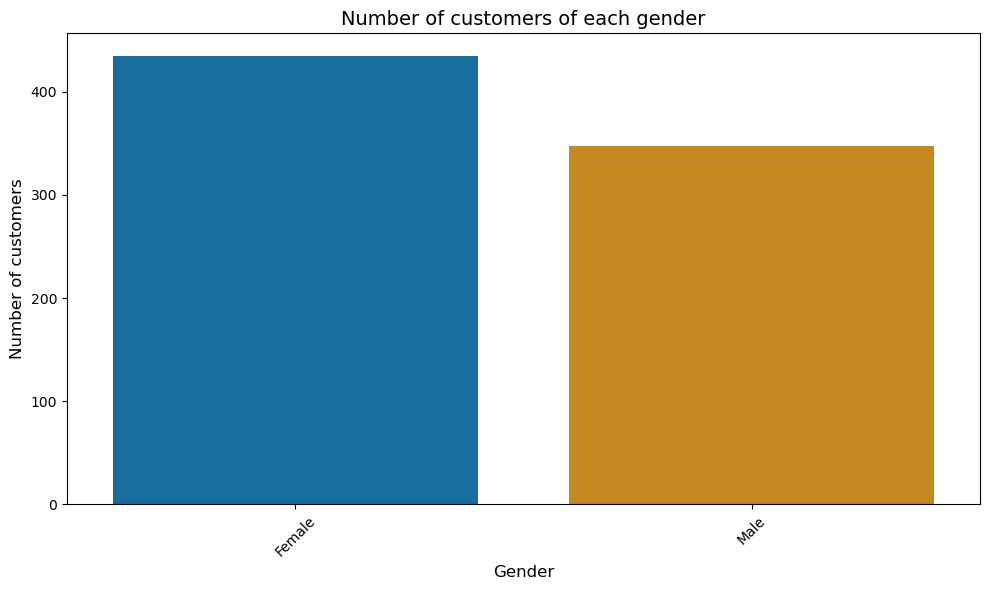

In [53]:
# Create a count plot to visualise this.
count_plot(reviews_customer, "gender", title="Number of customers of each gender", xlabel=None, ylabel="Number of customers")

***Interpretation of the plot***: More females than males by a small amount.

#### 3. How many customers achieved each level of education?

In [56]:
# Count number of customers in each education category.
education_count = reviews_customer["education"].value_counts()
education_count

education
Graduate                347
PhD                     182
Postgraduate            158
Completed school         75
Not completed school     20
Name: count, dtype: int64

Most are graduates. Lots of PhD which is more than you would perhaps expect from the general population.

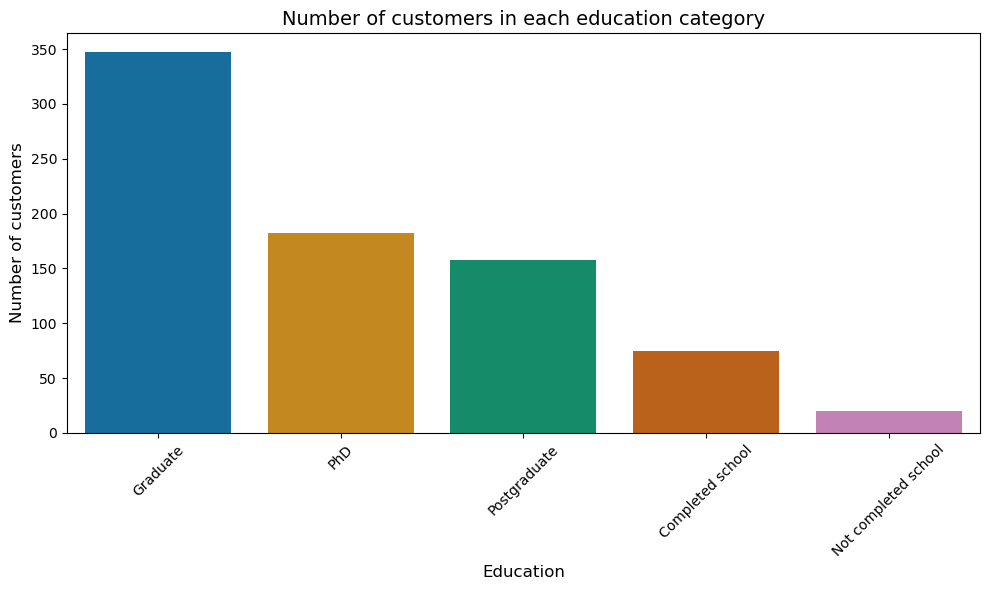

In [58]:
# Create a count plot to visualise this.
count_plot(reviews_customer, "education", title="Number of customers in each education category", xlabel=None, ylabel="Number of customers")

***Interpretation of the plot***: A most common education level is "Graduate" with the lest common being "No completed school". A lot of reviews completed by those with a PhD (perhaps a little suprising given that not many of the population has PhD's).

#### 4. What is the distribution of ages of customers?

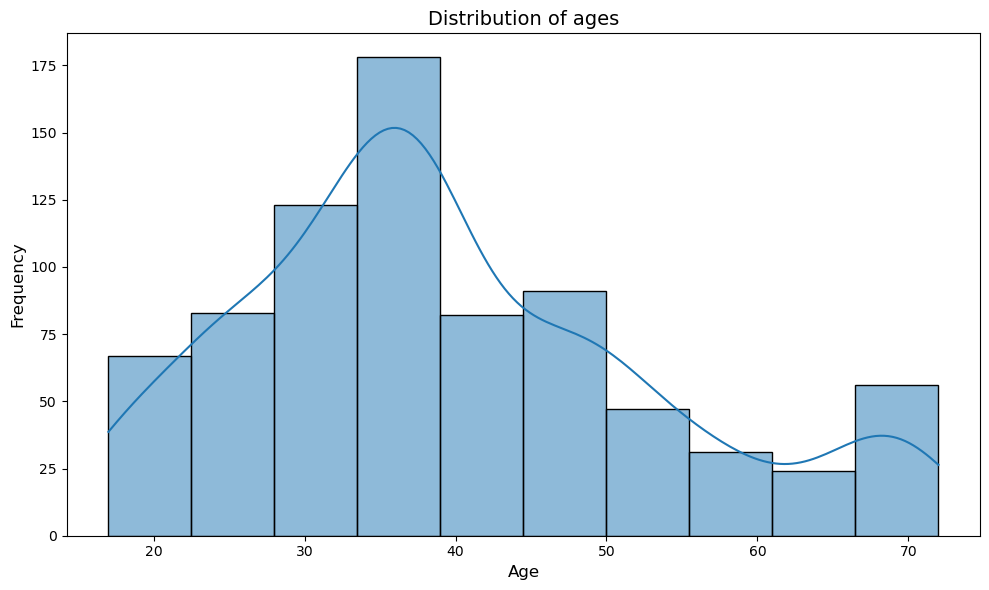

In [61]:
# Create a histogram.
hist_plot(reviews_customer, "age", title="Distribution of ages", xlabel=None, ylabel="Frequency", bins=10)

***Interpretation of the plot***: About ages 30 - 40 is the most common age group. Is this because are perhaps more likely to have small children to buy the games for?

#### 5. What is the distribution of customer incomes?

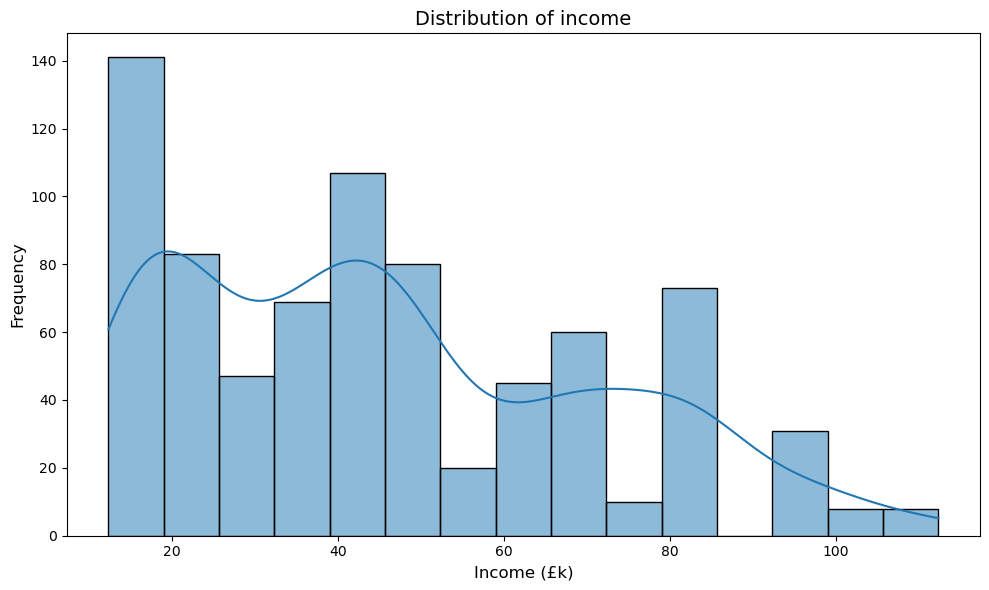

In [64]:
# Create a histogram.
hist_plot(reviews_customer, "income_k", title="Distribution of income", xlabel="Income (£k)", ylabel="Frequency", bins=15)

***Interpretation of the plot***: Few customers with very high incomes. Lots with an income below £25k. 

 #### 6. What is the distribution of spending scores?

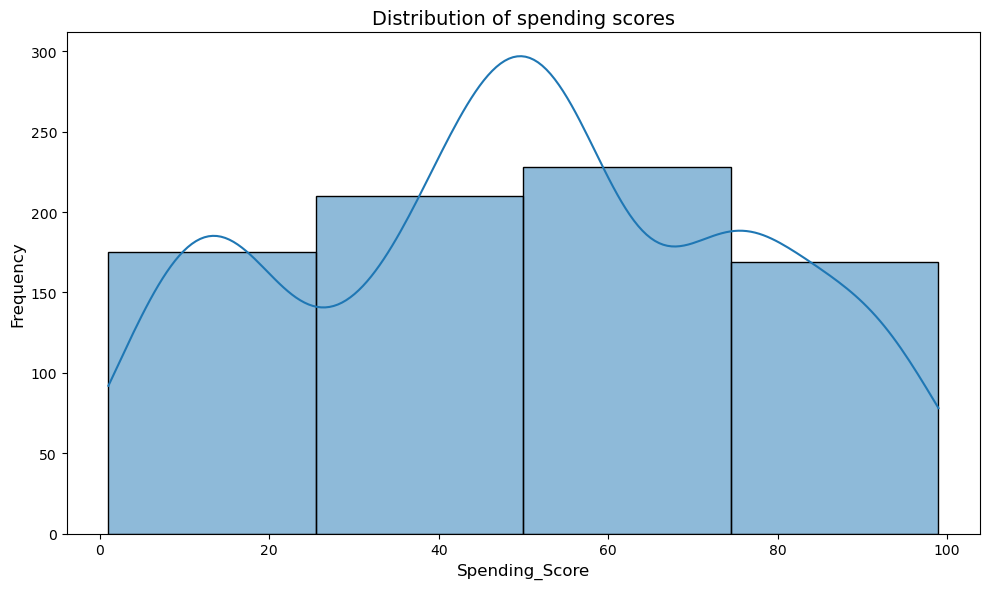

In [67]:
# Create a histogram with few bins to see the big picture.
hist_plot(reviews_customer, "spending_score", title="Distribution of spending scores", xlabel=None, ylabel="Frequency", bins=4)

***Interpretation of the plot***: Customers have the tendency to have a middle amount of spending scores, but there isn't much difference in the number of low , medium, and high spending scores.

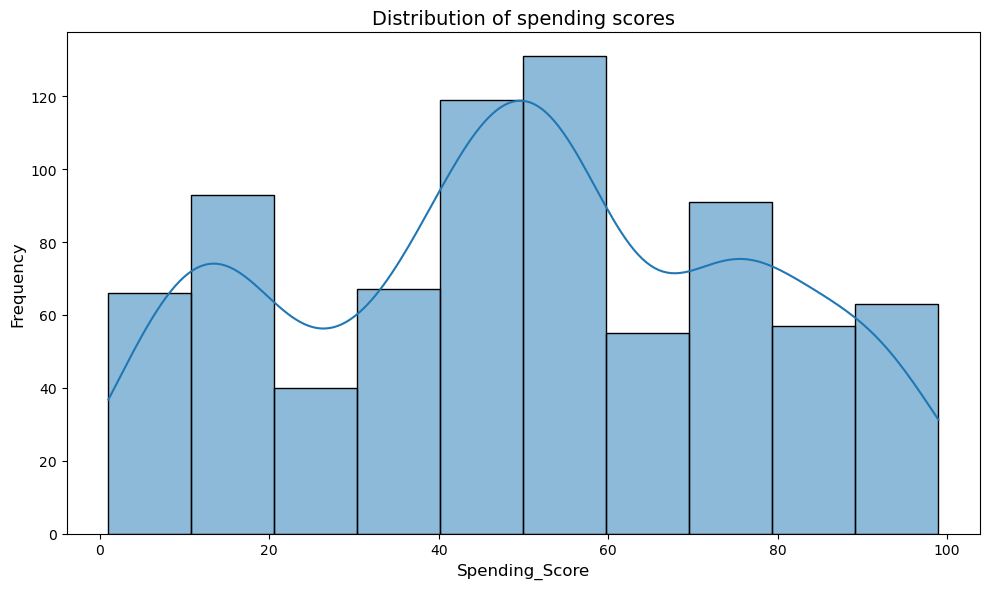

In [69]:
# Create a histogram with more bins to reveal more detail.
hist_plot(reviews_customer, "spending_score", title="Distribution of spending scores", xlabel=None, ylabel="Frequency", bins=10)

***Interpretation of the plot***: The most common spending score is between 40 and 60 but there are also lots of customers in the lower and higher number of spending scores.

#### 7. What is the distribution of loyalty points? Are there outliers?

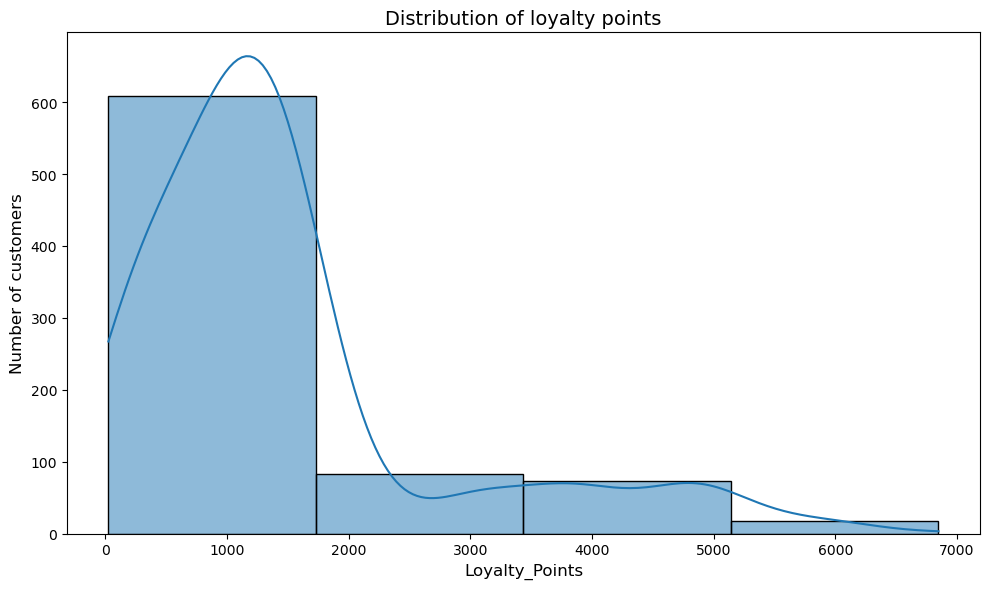

In [72]:
# Create a histogram with few bins to see the big picture.
hist_plot(reviews_customer, "loyalty_points", title="Distribution of loyalty points", xlabel=None, ylabel="Number of customers", bins=4)

***Interpretation of the plot***: Most customers have fewer than about 1800 loyalty points. Heavy right skew.

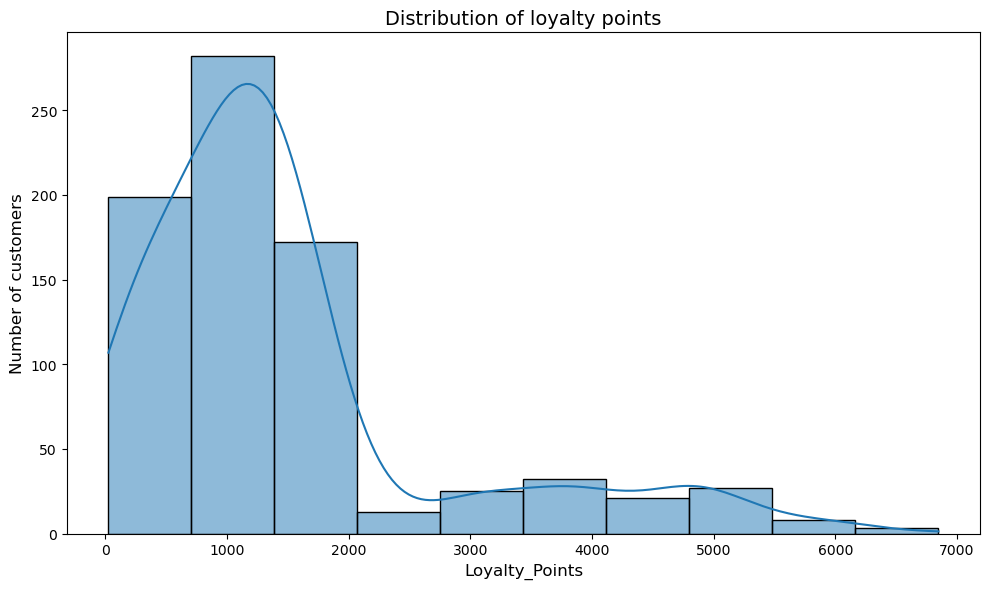

In [74]:
# Create a histogram with more bins to see more detail.
hist_plot(reviews_customer, "loyalty_points", title="Distribution of loyalty points", xlabel=None, ylabel="Number of customers", bins=10)

***Interpretation of the plot***: Similar insight to above. Lots of customers have about 700 - 1300 loyalty points.\
There's a significant positive skew. I'm going to look at the info about the columns so I can see the mean and the quartiles

In [76]:
# View info about the "loyalty_points" column.
reviews_customer["loyalty_points"].describe()

count     782.000000
mean     1497.404092
std      1313.241715
min        25.000000
25%       701.000000
50%      1187.000000
75%      1658.000000
max      6847.000000
Name: loyalty_points, dtype: float64

In [77]:
# Check for outliers.
# Calculate Q1 (25th percentile) and Q3 (75th percentile)
Q1 = reviews_customer["loyalty_points"].quantile(0.25)
Q3 = reviews_customer["loyalty_points"].quantile(0.75)

# Calculate IQR
IQR = Q3 - Q1

# Define outlier threshold
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

print(lower_bound)
print(upper_bound)

-734.5
3093.5


In [78]:
# Number of customers with more than 6000 loyalty points.
reviews_customer[reviews_customer["loyalty_points"] > 3093.5].shape[0]

101

In [79]:
# Number of total customers.
reviews_customer.shape

(782, 7)

So (101/782)*100 = 12.92%  of customers are categorised as outliers. This is a large percentage of customers so I'm not going to remove the outliers. The majority of customers are within a small IQR (957) but this could be due to them just buying fewer products, not spending as much money, and how long they have been buying products for. The customers with a high amount of loyalty points may have also taken advantage of offers like "buy this product and get twice as many loyalty points." Looking at the histogram, there are no gaps with no one in that loyalty points category suggesting that the high number of loyalty points aren't a weird result.

In [81]:
# Number of customers with more than 6000 loyalty points.
reviews_customer[reviews_customer["loyalty_points"] > 6000].shape[0]

6

In [82]:
# View the data frame.
reviews_customer

,customer_id,gender,age,income_k,spending_score,loyalty_points,education
0,1,Female,17,13.94,40,233,Postgraduate
1,2,Female,17,35.26,54,797,Postgraduate
2,3,Female,17,53.30,48,1071,Postgraduate
3,4,Female,17,69.70,26,759,Postgraduate
4,5,Female,18,12.30,81,436,Graduate
...,...,...,...,...,...,...,...
777,778,Male,72,37.72,56,1264,Postgraduate
778,779,Male,72,39.36,47,1107,PhD
779,780,Male,72,40.18,55,1322,PhD
780,781,Male,72,66.42,93,3695,PhD


#### 8. How many customers are there in each loyalty points category?

In [84]:
# Calculate how many customers in each loyalty points category.
bins = [0, 1000, 2000, 3000, 4000, 5000, 6000, float("inf")]
labels = ["0-999", "1000-1999", "2000-2999", "3000-3999", "4000-4999", "5000-5999", "6000+"] 

reviews_customer["loyalty_category"] = pd.cut(reviews_customer["loyalty_points"], bins=bins, labels=labels, right=False)

customer_counts = reviews_customer["loyalty_category"].value_counts().sort_index()

print(customer_counts)

loyalty_category
0-999        304
1000-1999    346
2000-2999     25
3000-3999     41
4000-4999     42
5000-5999     18
6000+          6
Name: count, dtype: int64


In [85]:
# Convert customer_counts to a DataFrame and name the column
customer_counts_df = customer_counts.reset_index()
customer_counts_df

,loyalty_category,count
0,0-999,304
1,1000-1999,346
2,2000-2999,25
3,3000-3999,41
4,4000-4999,42
5,5000-5999,18
6,6000+,6


In [86]:
# Create a percentage column.
customer_counts_df["percentage"] = (customer_counts_df["count"]/customer_counts_df["count"].sum())*100
customer_counts_df

,loyalty_category,count,percentage
0,0-999,304,38.874680
1,1000-1999,346,44.245524
2,2000-2999,25,3.196931
3,3000-3999,41,5.242967
4,4000-4999,42,5.370844
5,5000-5999,18,2.301790
6,6000+,6,0.767263


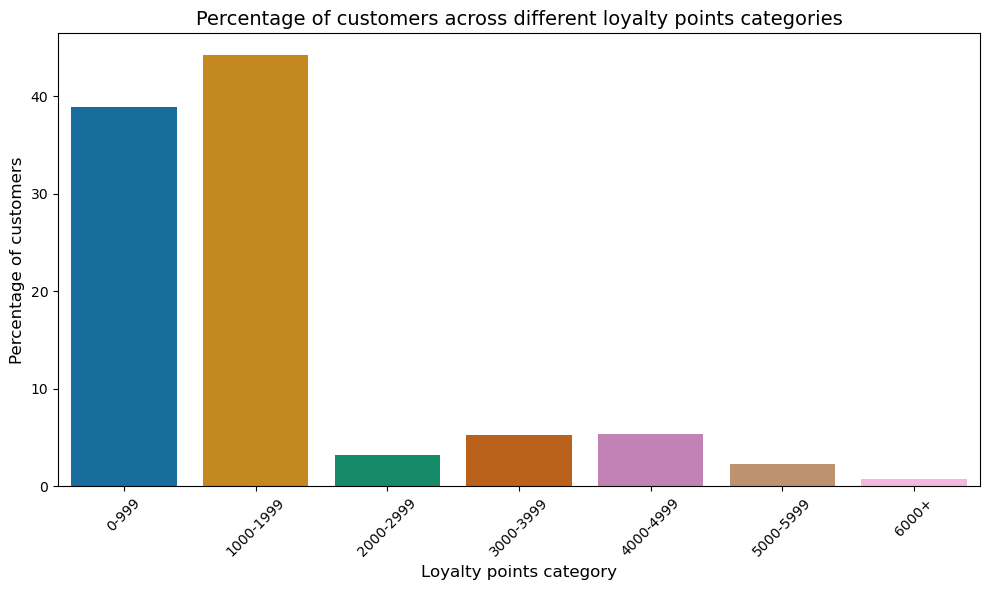

In [87]:
# Create a bar plot showing the percentage of customers in each loyalty point category.
bar_plot(customer_counts_df, "loyalty_category", "percentage", title="Percentage of customers across different loyalty points categories",
         xlabel="Loyalty points category", ylabel="Percentage of customers")

***Interpretation of the plot***: Most customers have fewer than 2000 loyalty points.

In [89]:
# Create a data frame where loyalty points are split into up to 2000 points and above 2000 points.
# Create the categories
up_to_2000 = customer_counts_df.loc[customer_counts_df["loyalty_category"].isin(["0-999", "1000-1999"]), ["count", "percentage"]].sum()
over_2000 = customer_counts_df.loc[~customer_counts_df["loyalty_category"].isin(["0-999", "1000-1999"]), ["count", "percentage"]].sum()

# Create a new DataFrame with the grouped values
grouped_df = pd.DataFrame({"loyalty_category": ["Up to 2000", "Over 2000"],
    "count": [up_to_2000["count"], over_2000["count"]],
    "percentage": [up_to_2000["percentage"], over_2000["percentage"]]})

print(grouped_df)

  loyalty_category  count  percentage
0       Up to 2000  650.0   83.120205
1        Over 2000  132.0   16.879795


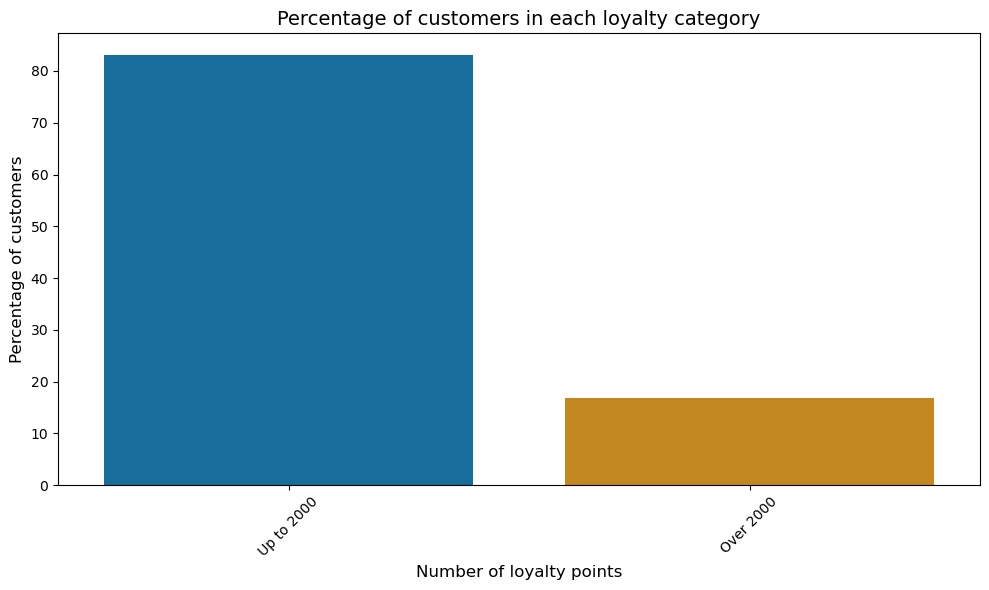

In [90]:
# Create a bar plot.
bar_plot(grouped_df, "loyalty_category", "percentage", title="Percentage of customers in each loyalty category",
        xlabel="Number of loyalty points", ylabel="Percentage of customers")

***Interpretation of the plot***: Most customers who reviewed products, have fewer than 2000 loyalty points.

#### 9. How many reviews are there per customer?

In [93]:
# View the DataFrame.
reviews_c.head()

,customer_id,gender,age,income_k,spending_score,loyalty_points,education,product,review,summary
0,1,Female,17,13.94,40,233,Postgraduate,7573,My son (8) and daughter (11) were and still ar...,Five Stars
1,2,Female,17,35.26,54,797,Postgraduate,4491,super for playing quiddler!,Five Stars
2,3,Female,17,53.30,48,1071,Postgraduate,2404,These are great quality and super cute! They a...,Love these!
3,3,Female,17,53.30,48,1071,Postgraduate,5493,This is a very good game. We enjoy playing it ...,"Good game, not durable version"
4,3,Female,17,53.30,48,1071,Postgraduate,2326,These are cute and the instructions are relati...,Cute but creators will be older kids and adult...


In [94]:
# Group by customer_id and count the number of reviews. Take the first instance of the other columns.
reviews_nreviews = reviews_c.groupby("customer_id", as_index=False).agg({
    "product": "count",  
    "gender": "first",   
    "age": "first",
    "income_k": "first",
    "spending_score":"first",
    "loyalty_points":"first",
    "education":"first"})

# Change the name of "product" column to "n_reviews".
reviews_nreviews.rename(columns={"product":"n_reviews"}, inplace=True)

reviews_nreviews

,customer_id,n_reviews,gender,age,income_k,spending_score,loyalty_points,education
0,1,1,Female,17,13.94,40,233,Postgraduate
1,2,1,Female,17,35.26,54,797,Postgraduate
2,3,7,Female,17,53.30,48,1071,Postgraduate
3,4,1,Female,17,69.70,26,759,Postgraduate
4,5,1,Female,18,12.30,81,436,Graduate
...,...,...,...,...,...,...,...,...
777,778,7,Male,72,37.72,56,1264,Postgraduate
778,779,1,Male,72,39.36,47,1107,PhD
779,780,7,Male,72,40.18,55,1322,PhD
780,781,1,Male,72,66.42,93,3695,PhD


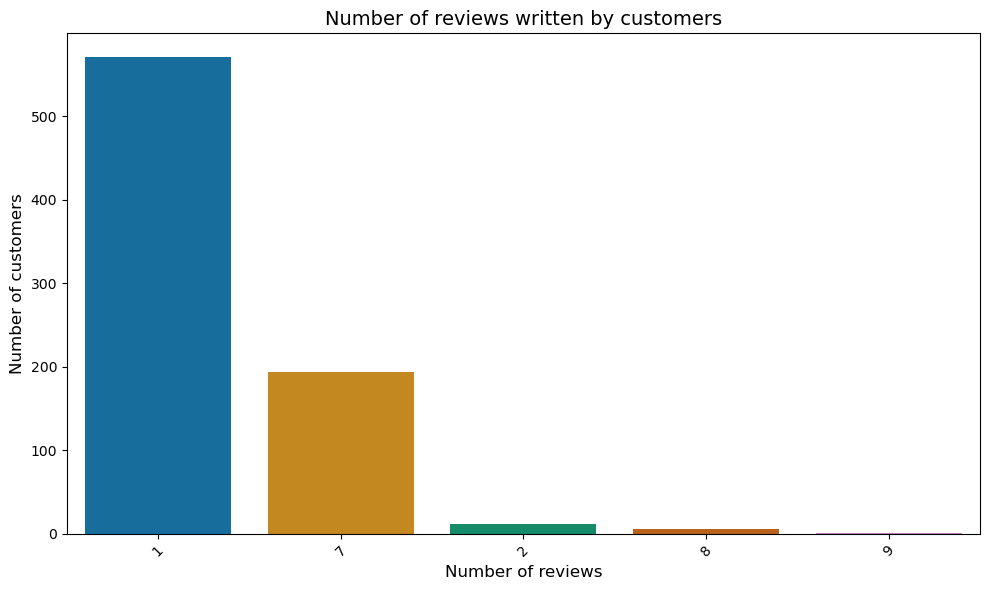

In [95]:
# Create a count plot to show the number of reviews customers wrote.
count_plot(reviews_nreviews, "n_reviews", title="Number of reviews written by customers", 
           xlabel="Number of reviews", ylabel="Number of customers")

***Interpretation of the plot***: Most customers are either review one product, or review lots of products (often 7 reviews). Interestingly, there are no customers who wrote 3, 4, 5, or 6 reviews.

#### 10. Which are the top reviewed products?
Note: There are no names of products, just product codes.

In [98]:
# View reviews_c
reviews_c.head()

,customer_id,gender,age,income_k,spending_score,loyalty_points,education,product,review,summary
0,1,Female,17,13.94,40,233,Postgraduate,7573,My son (8) and daughter (11) were and still ar...,Five Stars
1,2,Female,17,35.26,54,797,Postgraduate,4491,super for playing quiddler!,Five Stars
2,3,Female,17,53.30,48,1071,Postgraduate,2404,These are great quality and super cute! They a...,Love these!
3,3,Female,17,53.30,48,1071,Postgraduate,5493,This is a very good game. We enjoy playing it ...,"Good game, not durable version"
4,3,Female,17,53.30,48,1071,Postgraduate,2326,These are cute and the instructions are relati...,Cute but creators will be older kids and adult...


In [99]:
# Group by product code and count the product codes.
product_counts = reviews_c["product"].value_counts().reset_index()
product_counts.columns = ["product", "count"]
product_counts.sort_values(by="count", ascending=False, inplace=True)

product_counts

,product,count
0,1012,13
1,1031,13
2,979,12
3,977,11
125,4477,10
...,...,...
195,1459,9
196,1463,9
197,453,8
198,466,8


In [100]:
# Create a data frame with the top 10 counts.

product_counts_top10 = product_counts.head(10)
product_counts_top10

,product,count
0,1012,13
1,1031,13
2,979,12
3,977,11
125,4477,10
126,10241,10
127,10196,10
128,2404,10
129,5493,10
130,2326,10


In [101]:
# Convert "product" into a string.
product_counts_top10["product"] = product_counts_top10["product"].astype(str)

In [102]:
# Create order.
product_order = ["1012", "1031", "979", "977", "4477", "10241", "10196", "2404", "5493", "2326"]

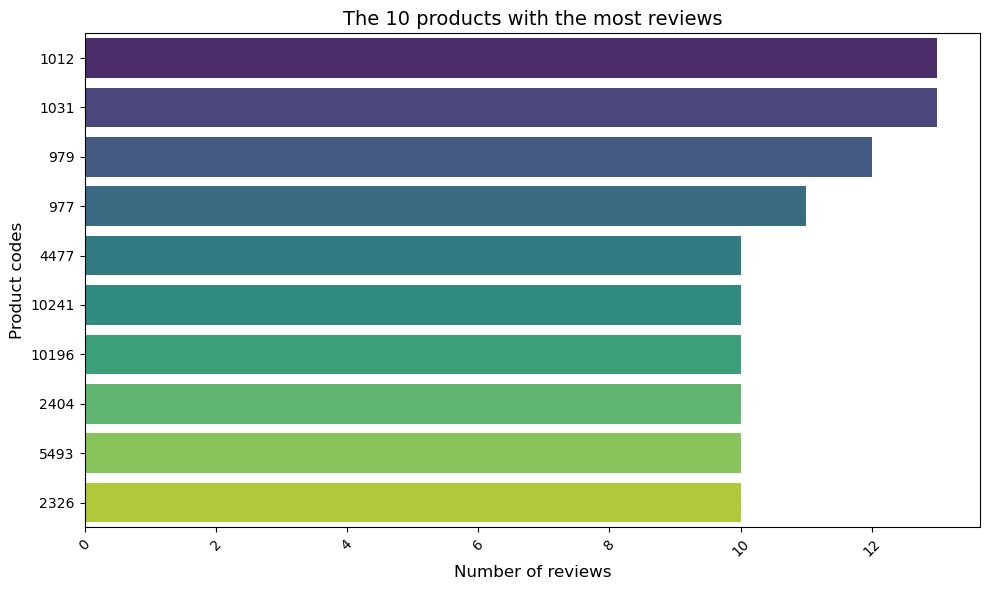

In [103]:
# Create a bar plot.
bar_plot(product_counts_top10, x_column="count", y_column="product", 
         xlabel="Number of reviews", ylabel="Product codes",  title="The 10 products with the most reviews", 
         order=product_order, palette="viridis")

***Interpretation of the plot***: This could be useful for the stakeholder as they will know which product codes are for which items. However, as I don't have this information, I can't gain much insight from this.

## Analysis using modelling

I will answer each of the business questions, using a variety of models for each question and comparing the usefulness/accuracy of each model. I will answer the business questions in the following order:

***1. How do customers engage with and accumulate loyalty points?*** - as the company will already know how the customers gain their loyalty points, this question can be rephrased as, ***Are loyalty points an important metric that can be leveraged in future marketing activities?*** - this includes analysing whether there are any important trends between loyalty points, spending scores, and demographics, how strong any trends are, and whether these trends can be used to predict future outcomes.

***2. How can customers be segmented into groups, and which groups can be targeted by the marketing department?*** - this includes which customer groups there are, and which groups have higher/lower spending scores and higher/lower loyalty points.

***3. How can customer reviews be used to inform marketing campaigns and make improvements to the business?*** - this includes whether the customer reviews are useful, the amount of positive, netrual, and negative sentiment in customer reviews, and links between certain demographics and good/bad reviews.

The business question: ***Can we use descriptive statistics to analyse the distribution of loyalty points and determine their suitability for predictive modeling? If so, how can these models inform marketing campaigns?*** will be analysed throughout as I gather information on the descriptive statistics of the loyalty points data. There's also analysis of this in my R script.

### Business question 1: Are loyalty points an important metric that can be leveraged in future marketing activities?

#### Explore correlations in the data

In [109]:
# View the DataFrame with n_products and grouped by customer_id.
reviews_nreviews.head()

,customer_id,n_reviews,gender,age,income_k,spending_score,loyalty_points,education
0,1,1,Female,17,13.94,40,233,Postgraduate
1,2,1,Female,17,35.26,54,797,Postgraduate
2,3,7,Female,17,53.30,48,1071,Postgraduate
3,4,1,Female,17,69.70,26,759,Postgraduate
4,5,1,Female,18,12.30,81,436,Graduate


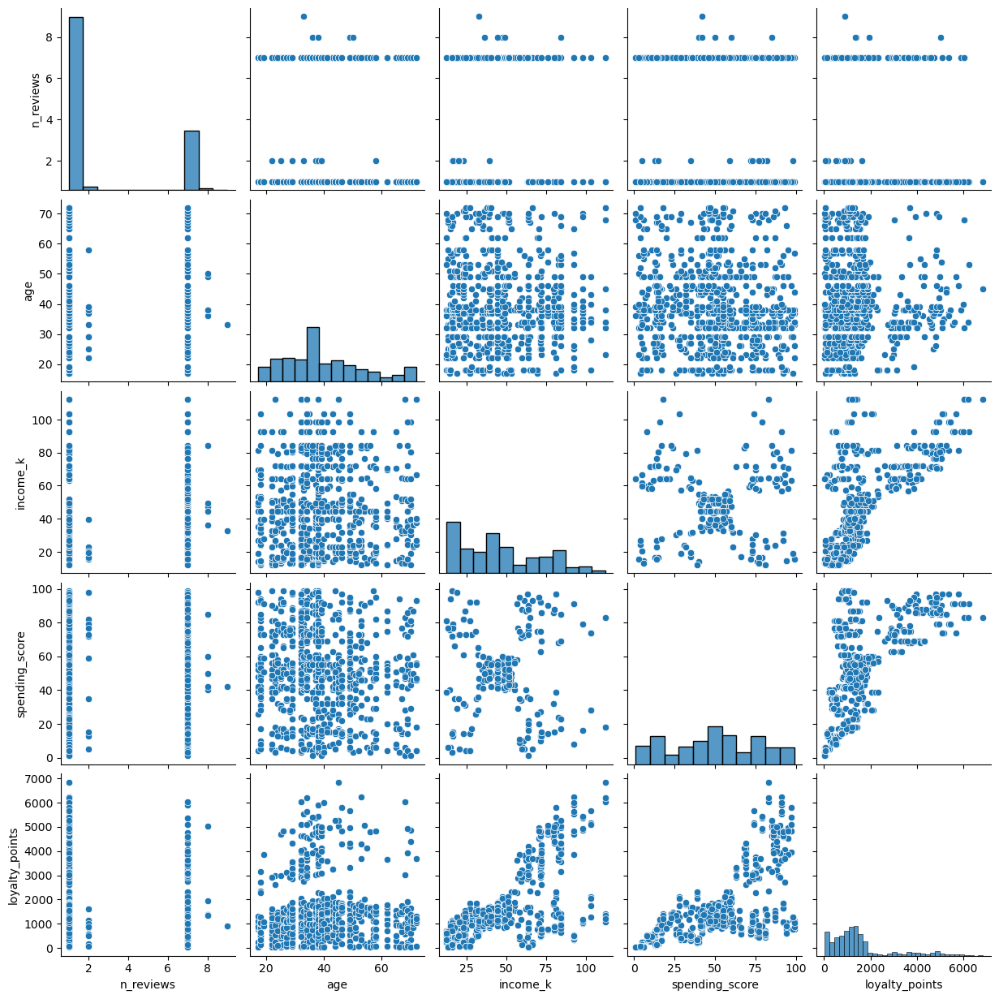

In [110]:
# Drop the customer_id column as this will not provide any meaningful information.
reviews_nreviews2 = reviews_nreviews.drop(columns=["customer_id"])

# Later on I change reviews_nreviews2 to have dummy variables and delete columns.
# I'm creating a copy of this dataframe here so that I can use it in my clustering analysis.
reviews_nreviews3 = reviews_nreviews2.copy()

# Create a pairplot.
pairplot = sns.pairplot(reviews_nreviews2)

***Interpretation of the plot***: Most of these scatterplots show no correlation, but these is some positive correlation between income and loyalty points, spending score and loyalty points, and loyalty points and spending score.
I'm going to view the correlations as a table to check these correlations.

In [112]:
# Print correlations for the numerical columns.
reviews_nreviews2.select_dtypes(include=["number"]).corr()

,n_reviews,age,income_k,spending_score,loyalty_points
n_reviews,1.000000,-0.004272,0.077887,0.014461,0.059754
age,-0.004272,1.000000,0.006024,-0.124630,0.028904
income_k,0.077887,0.006024,1.000000,-0.001645,0.630901
spending_score,0.014461,-0.124630,-0.001645,1.000000,0.632116
loyalty_points,0.059754,0.028904,0.630901,0.632116,1.000000


This can be more clearly seen with a correlation matrix.

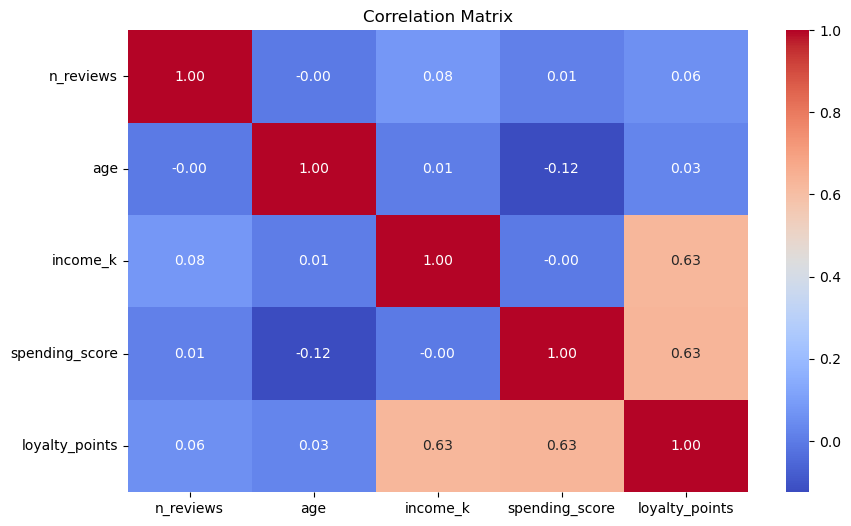

In [114]:
# Or could plot the correlation matrix e.g.
plt.figure(figsize=(10,6))
sns.heatmap(reviews_nreviews2.select_dtypes(include=["number"]).corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.savefig("correlation_matrix.png", dpi=500, bbox_inches="tight")
plt.show()

***Summary of correlation analysis***:

As we saw in the scatterplots, most of these variables aren't correlated as they are close to 0. There is a good correlation between these 4 pairs of variables: income and loyalty points, loyalty points and income, spending score and loyalty points, and loyalty points and spending scores as the correlation coefficient is 0.63.

However, as all of these have the same correlation coefficient, this could mean that there is multicollinearity. I have to be aware of this when performing multiple linear regression using these variables and will have to calculate the VIF. It might also suggest that these variables are being influenced by another factor that not in the data set. If this was the case and I had access to more of the companies data, I could see whether there is any other factor that could be influencing all of these variables. For example, this factor could be the ***total amount spent, the number of products bought, or how often customers purchase items***. These factors aren't in this data set but Turtle Games might already have this information or could find it out. Note that this data does not show the number of products bought but just the number of reviews the customer wrote.

As loyalty points cannot influence someones income, I will now use regression to analyse 3 of the variable pairs:
          1. How loyalty points influence spending scores.
          2. How spending scores influence loyalty points gained.
          3. How the customers income influence loyalty points gained.

Firstly, I will use simple linear regression as it's best to start with a simple model and only create a more complex model if needed as more complex models can be more difficult to interpret, potentially overfit, and can be less computationally efficient.  If a linear regression doesn't fit well and/or there is heteroscedasticity, I will first try using a log transformation which may reduce heteroscedasticity and make the data more linear. If this doesn't work well, I will try using Support Vector Regression to see whether this will improve  results.

I will also use Decision Tree Regression which may work better if the data does not work well with a linear model. Decision Tree Regression can tend to overfit so I will make sure to prune the tree if needed as well as using ensemble methods like Random Forests and Gradient Boosting which could reduce overfitting.

I will use multiple linear regression in my R script.

#### 1. Can we use loyalty points to predict spending activity (spending scores)? How strong is this trend?
Business question this helps to answer: Are loyalty points an important metric that can be leveraged in future marketing activities?

##### Model used: Simple linear regression (no transformations)

In [118]:
# View the ranges.
# Calculate the range for each column
range_values = reviews_nreviews[["age", "income_k", "spending_score", "loyalty_points"]].max() 
- reviews_nreviews[["age", "income_k", "spending_score", "loyalty_points"]].min()

# Display the range values for each column
print(range_values)

age                 72.00
income_k           112.34
spending_score      99.00
loyalty_points    6847.00
dtype: float64


In [119]:
# Define the dependent variable.
y = reviews_nreviews["spending_score"] 

# Define the independent variable.
X = reviews_nreviews["loyalty_points"]

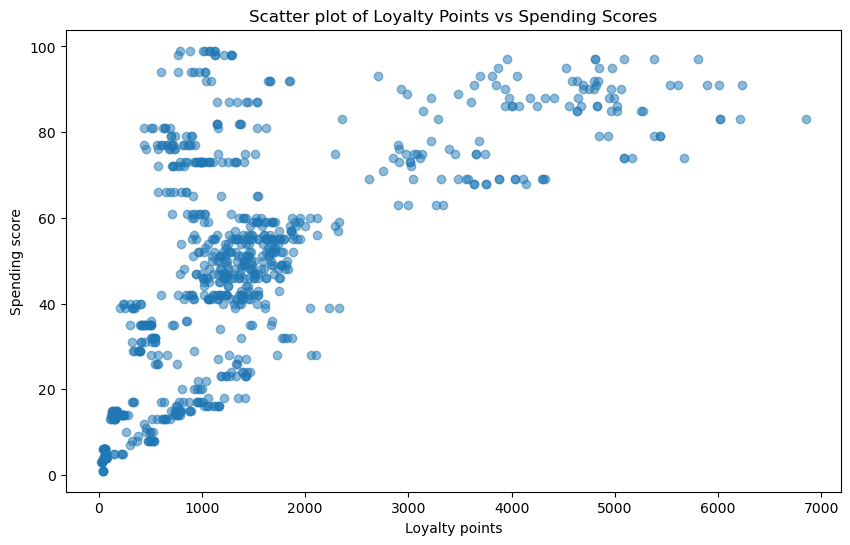

In [120]:
# Create scatterplot.
plt.figure(figsize=(10, 6))
plt.scatter(reviews_nreviews["loyalty_points"], reviews_nreviews["spending_score"], alpha=0.5)
plt.xlabel("Loyalty points")
plt.ylabel("Spending score")
plt.title("Scatter plot of Loyalty Points vs Spending Scores")

# Get the title from the plot
plot_title = plt.gca().get_title()

# Clean the title to create a filename
clean_title = re.sub(r'[^\w\s-]', '', plot_title.replace("\n", " ")).strip().replace(' ', '_').lower()
filename = f"{clean_title}.png"

# Save the figure
plt.savefig(filename, dpi=500, bbox_inches="tight")

plt.show()

***Interpretation of the plot***: There does seem to be a linear regression but it is definitely not a clear linear regression. The data points are in a triangle shape which suggests that there is a possibility linear regression might not be the best fit or that there is heteroscedasticity present.

In [122]:
# Change X into a 2D array so that OLS works.
X = X.values.reshape(-1,1)

In [123]:
# Split the data in 'train' (80%) and 'test' (20%) sets.
# Using 20% test data as this is a small data set so having a larger training data set helps the model learn better.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

# Training the model using the 'statsmodel' OLS library.
# Fit the model with the added constant.
lpss_model = sm.OLS(y_train, sm.add_constant(X_train)).fit()

# Set the predicted response vector.
y_pred = lpss_model.predict(sm.add_constant(X_test)) 

# Print the model summary.
print(lpss_model.summary())

                            OLS Regression Results                            
Dep. Variable:         spending_score   R-squared:                       0.401
Model:                            OLS   Adj. R-squared:                  0.400
Method:                 Least Squares   F-statistic:                     417.4
Date:                Fri, 11 Apr 2025   Prob (F-statistic):           2.11e-71
Time:                        21:04:07   Log-Likelihood:                -2783.2
No. Observations:                 625   AIC:                             5570.
Df Residuals:                     623   BIC:                             5579.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         30.3193      1.255     24.154      0.0

***Analysis of the model summary***:
- R-squared: About 40% of the variance in the spending score is explained by the change in the loyalty points. This isn't very bad, but is a there is a ***significant amount of variance which isn't explained***. It suggests that loyalty points do have ***some influence*** over the spending score but also indicates that there are probably other factors that affect the score as well.
- coefficient = 0.0129. This means that for each increase of 1 loyalty point, the spending score increases on average by 0.0129. This at first looks like a very small positive increase. ***However, the ranges of spending scores and loyalty points are very different (see .describe() below). spending_score has a range of 98 whilst loyalty_points has a range of 6822. Therefore, if loyalty points increase by 100 (not very much), spending score will increase on average by about 1.3 (0.0129*100).***
- the p value is 0.000 which is less than 0.05. This shows that ***the effect that loyalty points have on the spending score is statistically significant.***
- We can be 95% confident that the coeffecient is between 0.012 and 0.014. This means that we can be 95% confident that for every 1 loyalty pont gained, the spending score will increase by between 0.012 and 0.014.
- The standard error is small (0.001) (with the coefficient of 0.0129) which ***suggests that the coefficient is precise*** as if repeated samples were taken from the same population, the coefficient wouldn't vary much.
- The kurtosis value is close to 3 (3.029) which ***suggests that the data is normally distributed and has an expected amount of outliers.***

In [125]:
# View the DataFrame info to check range of loyalty points and spending score values.
reviews_nreviews.describe()

,customer_id,n_reviews,age,income_k,spending_score,loyalty_points
count,782.000000,782.000000,782.000000,782.000000,782.000000,782.000000
mean,391.500000,2.557545,39.554987,46.058414,49.604859,1497.404092
std,225.888247,2.631171,13.666746,25.249759,26.593610,1313.241715
min,1.000000,1.000000,17.000000,12.300000,1.000000,25.000000
25%,196.250000,1.000000,29.000000,23.165000,29.000000,701.000000
50%,391.500000,1.000000,38.000000,44.280000,50.000000,1187.000000
75%,586.750000,7.000000,49.000000,63.960000,73.000000,1658.000000
max,782.000000,9.000000,72.000000,112.340000,99.000000,6847.000000


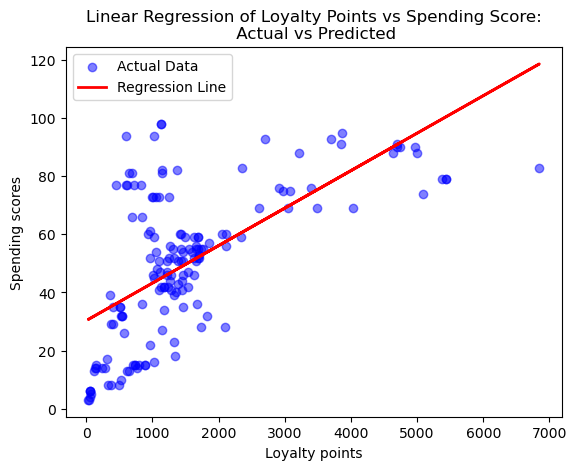

In [126]:
# Scatter plot of actual vs predicted values.
plt.scatter(X_test, y_test, color="blue", label="Actual Data", alpha=0.5)

# Regression line using predictions
plt.plot(X_test, y_pred, color="red", linewidth=2, label="Regression Line")

# Labels and title
plt.xlabel("Loyalty points")
plt.ylabel("Spending scores")
plt.title("Linear Regression of Loyalty Points vs Spending Score:\n Actual vs Predicted")
plt.legend()

# Get the title from the plot
plot_title = plt.gca().get_title()

# Clean the title to create a filename
clean_title = re.sub(r'[^\w\s-]', '', plot_title.replace("\n", " ")).strip().replace(' ', '_').lower()
filename = f"{clean_title}.png"

# Save the figure
plt.savefig(filename, dpi=500, bbox_inches="tight")

plt.show()

***Interpretation of the plot***: There are a number of large residuals. Looking at this, it seems the model isn't good at predicting the high values of spending scores in particular.\
Note that this may not be surprising as I have no reason to believe that, for example, a customer can't have a low amount of loyalty points but a high spending score as it is unclear exactly how spending scores and loyalty points are calculated.

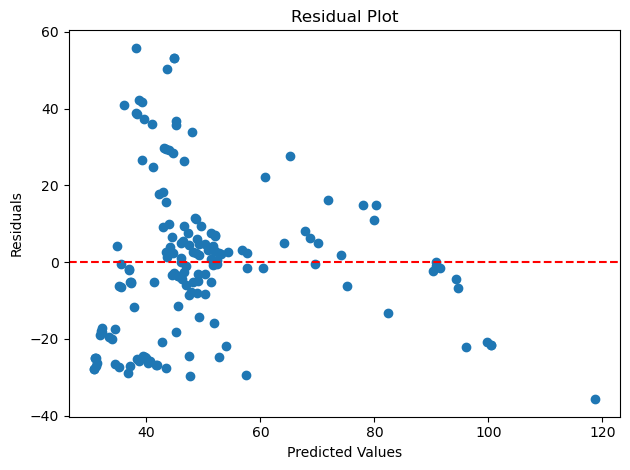

{'LM stat': 38.08080554308063, 'LM Test p-value': 6.787456876751267e-10, 'F-stat': 40.42181969409183, 'F-test p-value': 3.958291190547952e-10}


In [128]:
# Check for homoscedasticity (one of the simple linear regression assumptions).
homoscedasticity_check(y_test, y_pred, lpss_model)

***Interpretation of the plot***: The residuals don't seem to be randomly scattered and have a sort of funnel shape heading downwards.

The p value is much lower than 0.05 which means that the null hypothesis that there is no heteroscedasticity present is strongly rejected. This means that there is ***strong evidence that heteroscedasticity is present*** which means that the variance of the residuals isn't constant. This violates one of the assumptions of linear regression that ***homoscedasicity*** is present.

I now know that I cannot use this model, at least in it's current form so will use a log transformation. I'll also check the normality of residuals so I can compare this with other models.

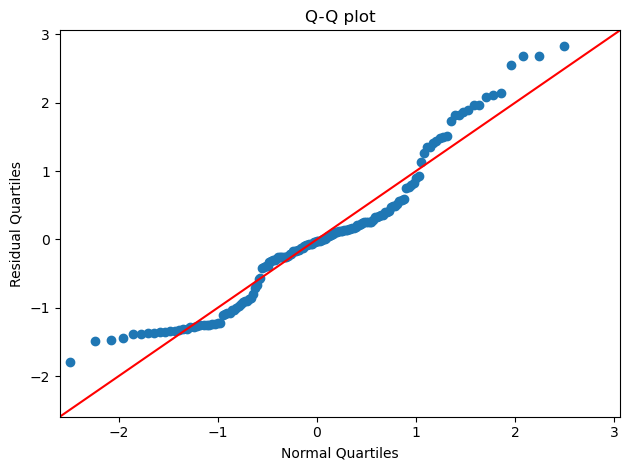

In [130]:
# Create a Q-Q plot to visulise whether the residuals follow a normal distribution (another assumption).
create_qqplot(y_test, y_pred)

***Interpretation of the plot***: No, the residuals don't follow a normal distribution as they are not along the red line. View this with a histogram as well.

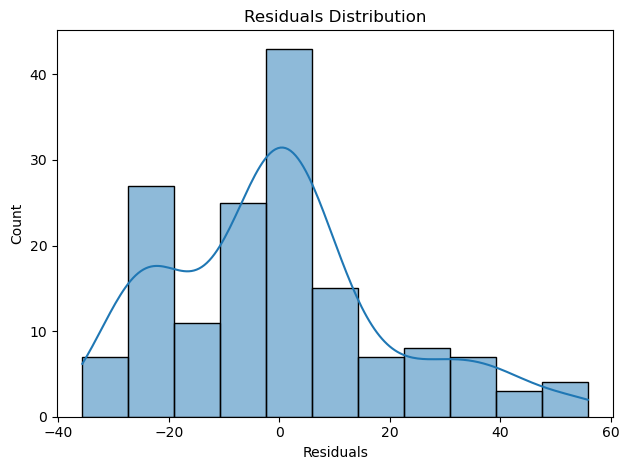

In [132]:
# Histogram of residuals (should be roughly normal)
hist_residuals(y_test, y_pred)

***Interpretation of the plot***: As in the Q-Q plot, the residuals don't follow a normal distribution and are positively skewed. However, it's not very far from a normal distribution.

In [134]:
# Evaluate how well the model performs on the test data.
# Calculate mean absolute error.
mae = metrics.mean_absolute_error(y_test, y_pred)
print('Mean Absolute Error:', mae)

# Calculate mean squared error.
mse = metrics.mean_squared_error(y_test, y_pred)
print('Mean Squared Error:', mse)

# Calculate root mean squared error.
rmse = np.sqrt(mse)
print('Root Mean Squared Error:', rmse)

Mean Absolute Error: 14.876017540085098
Mean Squared Error: 392.85799156353244
Root Mean Squared Error: 19.82064558896941


***Summary of the model***:

- ***What's good about the model?***: We can see a clear positive correlation between the variables and loyalty points have a statistically significant impact on spending scores.
- ***What needs to be improved about the model?***: Assumptions are being violated - homoscedasticity and normality of residuals. Also the error values are poor. The RMSE is nearly 20. As spending scores can only go up to 100, this is a large mean error (being squared first puts more weight on the outliers). The MSE error is very large suggesting large residuals. We saw on the scatterplot that the residuals are particularly high for the higher spending scores which is probably the largest cause of the high RMSE. We need to lower the errors, have homoscedasiticty, and normality of residuals.

##### Model used: Simple linear regression (with log transformed loyalty points)

In [137]:
# Create a log transformed "loyalty points" column.
reviews_nreviews["loyalty_points_log"] = np.log(reviews_nreviews["loyalty_points"])

# View reviews_nreviews
reviews_nreviews.head()

,customer_id,n_reviews,gender,age,income_k,spending_score,loyalty_points,education,loyalty_points_log
0,1,1,Female,17,13.94,40,233,Postgraduate,5.451038
1,2,1,Female,17,35.26,54,797,Postgraduate,6.680855
2,3,7,Female,17,53.30,48,1071,Postgraduate,6.976348
3,4,1,Female,17,69.70,26,759,Postgraduate,6.632002
4,5,1,Female,18,12.30,81,436,Graduate,6.077642


In [138]:
# Define the dependent variable.
y = reviews_nreviews["spending_score"] 

# Define the independent variable.
X = reviews_nreviews["loyalty_points_log"]

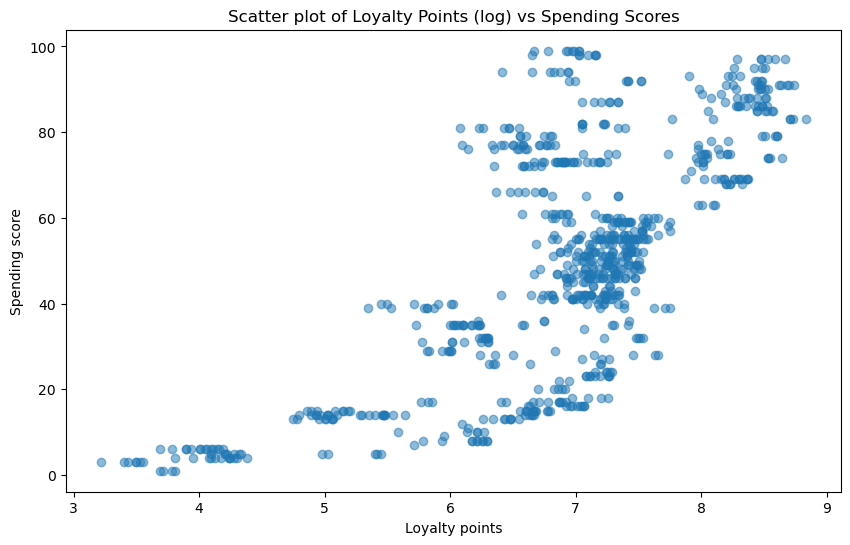

In [139]:
# Create scatterplot using "loyalty_points_log".
plt.figure(figsize=(10, 6))
plt.scatter(reviews_nreviews["loyalty_points_log"], reviews_nreviews["spending_score"], alpha=0.5)
plt.xlabel("Loyalty points")
plt.ylabel("Spending score")
plt.title("Scatter plot of Loyalty Points (log) vs Spending Scores")

# Get the title from the plot
plot_title = plt.gca().get_title()

# Clean the title to create a filename
clean_title = re.sub(r'[^\w\s-]', '', plot_title.replace("\n", " ")).strip().replace(' ', '_').lower()
filename = f"{clean_title}.png"

# Save the figure
plt.savefig(filename, dpi=500, bbox_inches="tight")

plt.show()

***Interpretation of the plot***: Doesn't appear to have improved linearity.

In [141]:
# Change X into a 2D array so that OLS works.
X = X.values.reshape(-1,1)

In [142]:
# Split the data into 'train' (80%) and 'test' (20%) sets.
# Using 20% test data as this is a small data set so having a larger training data set helps the model learn better.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

# Training the model using the 'statsmodel' OLS library.
# Fit the model with the added constant.
lpss_model_log = sm.OLS(y_train, sm.add_constant(X_train)).fit()

# Set the predicted response vector (in log scale).
y_pred_log = lpss_model_log.predict(sm.add_constant(X_test))

# Print the model summary.
print(lpss_model_log.summary())

                            OLS Regression Results                            
Dep. Variable:         spending_score   R-squared:                       0.506
Model:                            OLS   Adj. R-squared:                  0.506
Method:                 Least Squares   F-statistic:                     639.2
Date:                Fri, 11 Apr 2025   Prob (F-statistic):           1.34e-97
Time:                        21:04:14   Log-Likelihood:                -2722.8
No. Observations:                 625   AIC:                             5450.
Df Residuals:                     623   BIC:                             5458.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -72.0955      4.869    -14.808      0.0

***Analysis of model summary:***
- R-squared is 0.506 which means an ok amount of the variance in the dependent variable is explained by the independent variable.
- p-values are less than 0.05 so loyalty points have a statistically significant effect on spending scores.
- Kurtosis is close to 3 so is approximately a normal distribution.

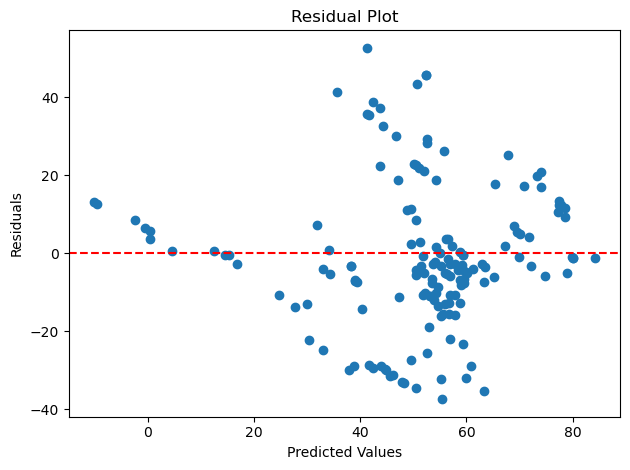

{'LM stat': 0.0132488525438762, 'LM Test p-value': 0.9083629589330371, 'F-stat': 0.013206736174320504, 'F-test p-value': 0.9085451130122614}


In [144]:
# Predict y_train in the log scale.
y_train_pred_logy = lpss_model_log.predict(sm.add_constant(X_train))

# Calculate residuals (on the original scale).
residuals = y_train - y_train_pred_logy

# Homoscedasticity check.
homoscedasticity_check(y_test, y_pred_log, lpss_model_log)

***Interpretation of the plot***: Breusch-Pagan test says that there is homoscedasticity BUT it does look like the residuals aren’t completely random. Lots of residuals in the higher predicted values but very few in lower predicted values.

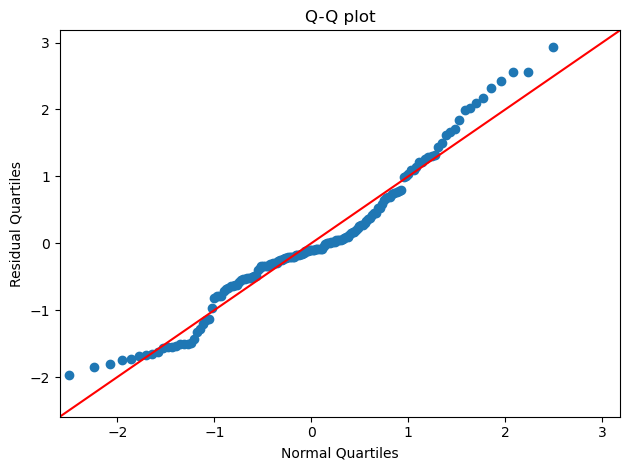

In [146]:
# Create Q-Q plot to check for normality of residuals.
create_qqplot(y_test, y_pred_log, title="Q-Q plot")

***Interpretation of the plot***: Not normally distibuted residuals but not far off.

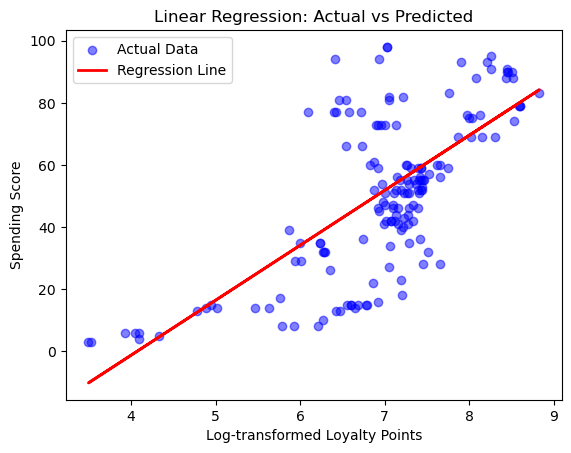

In [148]:
# Scatter plot of actual vs predicted values
plt.scatter(X_test, y_test, color="blue", label="Actual Data", alpha=0.5)

# Regression line using predictions
plt.plot(X_test, y_pred_log, color="red", linewidth=2, label="Regression Line")

# Labels and title
plt.xlabel("Log-transformed Loyalty Points")
plt.ylabel("Spending Score")
plt.title("Linear Regression: Actual vs Predicted")
plt.legend()

# Get the title from the plot
plot_title = plt.gca().get_title()

# Clean the title to create a filename
clean_title = re.sub(r'[^\w\s-]', '', plot_title.replace("\n", " ")).strip().replace(' ', '_').lower()
filename = f"{clean_title}.png"

# Save the figure
plt.savefig(filename, dpi=500, bbox_inches="tight")

plt.show()

***Interpretation of the plot***: Lots of points far from the regression line suggesting that this model is not good at predicting spending scores.

In [150]:
# Evaluate how well the model performs on the test data.
# Calculate mean absolute error.
mae = metrics.mean_absolute_error(y_test, y_pred_log)
print('Mean Absolute Error:', mae)

# Calculate mean squared error.
mse = metrics.mean_squared_error(y_test, y_pred_log)
print('Mean Squared Error:', mse)

# Calculate root mean squared error.
rmse = np.sqrt(mse)
print('Root Mean Squared Error:', rmse)

Mean Absolute Error: 13.839115134743206
Mean Squared Error: 338.26764306116127
Root Mean Squared Error: 18.392053802149483


Large errors meaning that the accuracy of predictions is likely to be low.

***Summary of the model:***
- ***What's good about the model?***: Is has a smaller RMSE and higher R-squared than without the log transformation and has less evidence that there is heteroscedasticity.
- ***What needs to be improved about the model?***: We need more evidence that there is homoscedasticity, normality of residuals and smaller errors in predictions. This model performs better than without the log transformation though.
As both models are not good enough, the next step is to try a different model, Support Vector Regression, to see whether this improves the accuracy of predictions.

##### Model used: Support Vector Regression

The advantages of using Support Vector Regression over simple linear regression include:
- Not as sensitive to heteroscedasticity
- Less sensitive to outliers
- Can capture more complex relationships in the data

However, it's more complex (as simple a model as possible is better) and is less interpretable as it doesn't provide clear coefficients.

I am going to try to use it as I've had problems with both homoscedasticity and large residuals.

I need to first use scaling as SVR's kernel functions calculate the distances between data points so if features have very different scales, larger values will dominate the distance calculations. Standardising the data means that all features contribute equally to the model.

In [156]:
# Feature scaling (standardisation of the features)

# Define the dependent variable.
y = reviews_nreviews["spending_score"] 

# Define the independent variable.
X = reviews_nreviews["loyalty_points"]

X = X.values.reshape(-1,1)

# Split the data in 'train' (80%) and 'test' (20%) sets.
# Using 20% test data as this is a small data set so having a larger training data set helps the model learn better.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

# Convert y_train and y_test to 2D arrays before scaling
y_train = y_train.values.reshape(-1, 1)
y_test = y_test.values.reshape(-1, 1)

# Scale the data
scaler_X = StandardScaler()
scaler_y = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train)
X_test_scaled = scaler_X.transform(X_test)
y_train_scaled = scaler_y.fit_transform(y_train).ravel()
y_test_scaled = scaler_y.transform(y_test).ravel()

I'm tuning the hyperparameters using GridSearchCV to find the best parameters to use in my SVR model. I'm going to try this with two different regression scoring metrics: 1. R squared ('r2')   2. Negative MAE ('neg_mean_absolute_error').  The default is R squared, but just because there is a good R squared score, it doesn't necessarily mean that the model performs well. I'm also using the negative MAE as a scoring metric because it measures the error in the model but treats all errors equally meaning it's less sensitive to outliers than RMSE (which I know from previous analysis I've had some problem with).

In [158]:
# Hyperparameter tuning using GridSearchCV (cross-validation technique)
# This uses the R squared scores as the regression scoring metric.
# Define hyperparameter grid
param_grid = {
    'C': [0.1, 1, 10, 100], 
    'epsilon': [0.01, 0.1, 0.5, 1],
    'kernel': ['linear', 'rbf', 'poly']}
svr = SVR()
grid_search = GridSearchCV(svr, param_grid, cv=5, scoring='r2', n_jobs=-1)
grid_search.fit(X_train_scaled, y_train_scaled)
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

Best Hyperparameters: {'C': 10, 'epsilon': 0.01, 'kernel': 'rbf'}


In [159]:
# Hyperparameter tuning using GridSearchCV (cross-validation technique)
# This uses the negative mean absolute error scores as the regression scoring metric.
# Define hyperparameter grid
param_grid = {
    'C': [0.1, 1, 10, 100], 
    'epsilon': [0.01, 0.1, 0.5, 1],
    'kernel': ['linear', 'rbf', 'poly']}
svr = SVR()
grid_search = GridSearchCV(svr, param_grid, cv=5, scoring='neg_mean_absolute_error', n_jobs=-1)
grid_search.fit(X_train_scaled, y_train_scaled)
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

Best Hyperparameters: {'C': 10, 'epsilon': 0.1, 'kernel': 'rbf'}


***Analysis of hyperparameter tuning:***
Both say to use ***C=10***. This is a higher value of C (but not the highest) so it has less tolerance for error, meaning that the model will try to closely fit the data. It will be lenient on errors but will avoid more extreme overfitting.

Two different epsilon values are provided, ***epsilon=0.01 and epsilon=0.1***. With a smaller epsilon (0.01), the model will try too hard to fit each data point and so may capture too much noise and therefore risk overfitting. However, with a moderate epsilon (0.1-0.5), there is a more reasonable margin of error, reducing the risk of overfitting by ignoring small variations in the data. As a moderate epsilon has less risk of overfitting but is also able to capture important patterns, I'm going to use ***epsilon=0.1*** in the model.

Interestingly, both attempts at tuning the hyperparameters recommended using a RBF kernel rather than a linear kernel, suggesting that the data has non-linear relationships which can be modelled better using RBF. However, RBF is more complex to interpret and slows down performance. Therefore, I'm first going to check whether there is significant difference between using the RBF kernel and the linear kernel.

In [161]:
# Comparing the R squared and MAE scores of the RBF and linear kernels.
#Define custom MAE scorer for GridSearchCV
mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False)

# Linear Kernel
svr_linear = SVR(kernel='linear', C=10)
linear_r2_score = cross_val_score(svr_linear, X_train_scaled, y_train_scaled, cv=5, scoring='r2').mean()
linear_mae_score = cross_val_score(svr_linear, X_train_scaled, y_train_scaled, cv=5, scoring=mae_scorer).mean()

# RBF Kernel
svr_rbf = SVR(kernel='rbf', C=10, gamma='scale')
rbf_r2_score = cross_val_score(svr_rbf, X_train_scaled, y_train_scaled, cv=5, scoring='r2').mean()
rbf_mae_score = cross_val_score(svr_rbf, X_train_scaled, y_train_scaled, cv=5, scoring=mae_scorer).mean()

# Print results
print(f"Linear Kernel R² Score: {linear_r2_score:.2f}")
print(f"Linear Kernel MAE Score: {abs(linear_mae_score):.2f}")

print(f"RBF Kernel R² Score: {rbf_r2_score:.2f}")
print(f"RBF Kernel MAE Score: {abs(rbf_mae_score):.2f}")

Linear Kernel R² Score: 0.39
Linear Kernel MAE Score: 0.59
RBF Kernel R² Score: 0.53
RBF Kernel MAE Score: 0.48


The R squared for RBF is significantly better than for the linear kernel.
I'm not sure whether the MAE scores are statistically significant. I will check by comparing MAE (in it's original scale) to the mean of y_test.

In [163]:
# Convert MAE from scaled units to original units.
mae_linear_original = scaler_y.inverse_transform([[linear_mae_score]])[0][0]
mae_rbf_original = scaler_y.inverse_transform([[rbf_mae_score]])[0][0]

print(f"Linear Kernel MAE (Original Scale): {mae_linear_original:.2f}")
print(f"RBF Kernel MAE (Original Scale): {mae_rbf_original:.2f}")

Linear Kernel MAE (Original Scale): 33.75
RBF Kernel MAE (Original Scale): 36.61


Note that neither of these MAE's are particularly good as spending scores only range from 1-100. 
Both these kernels seem to have similar usefulness. RBF has a better R squared, but linear kernel as a better MAE score. I will therefore try using both kernels.

In [165]:
# Train the model using the linear kernel.
svr_linear = SVR(C=10, epsilon=0.1, kernel='linear')

# Fit the model to the training data
svr_linear.fit(X_train_scaled, y_train_scaled)

SVR(C=10, kernel='linear')

In [166]:
# Make predictions using the test data
y_pred_scaled = svr_linear.predict(X_test_scaled)

In [167]:
# Convert predictions back to the original scale
y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1))

In [168]:
# Evaluate the model
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Linear Kernel SVR - C=10, epsilon=0.1")
print(f"MAE: {mae:.2f}")
print(f"MSE: {mse:.2f}")
print(f"R² Score: {r2:.2f}")

Linear Kernel SVR - C=10, epsilon=0.1
MAE: 14.86
MSE: 395.59
R² Score: 0.39


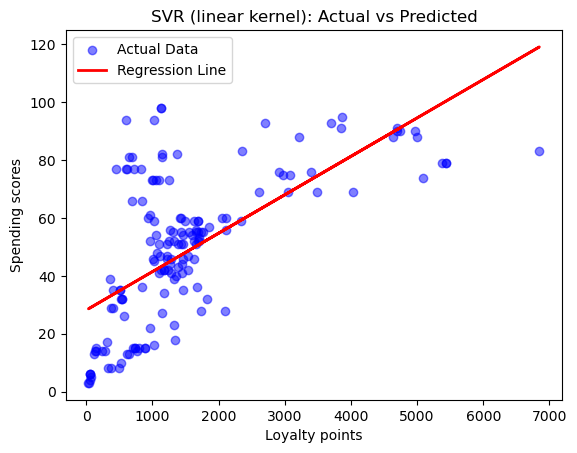

In [169]:
# Plot actual vs. predicted values
plt.scatter(X_test, y_test, color="blue", label="Actual Data", alpha=0.5)

# Regression line using predictions
plt.plot(X_test, y_pred, color="red", linewidth=2, label='Regression Line')

# Labels and title
plt.xlabel("Loyalty points")
plt.ylabel("Spending scores")
plt.title("SVR (linear kernel): Actual vs Predicted")
plt.legend()

# Get the title from the plot
plot_title = plt.gca().get_title()

# Clean the title to create a filename
clean_title = re.sub(r'[^\w\s-]', '', plot_title.replace("\n", " ")).strip().replace(' ', '_').lower()
filename = f"{clean_title}.png"

# Save the figure
plt.savefig(filename, dpi=500, bbox_inches="tight")

plt.show()

***Interpretation of the plot***: Still have a problem with many points far from the regression line so the accuracy of predictions is not as high as we would like.

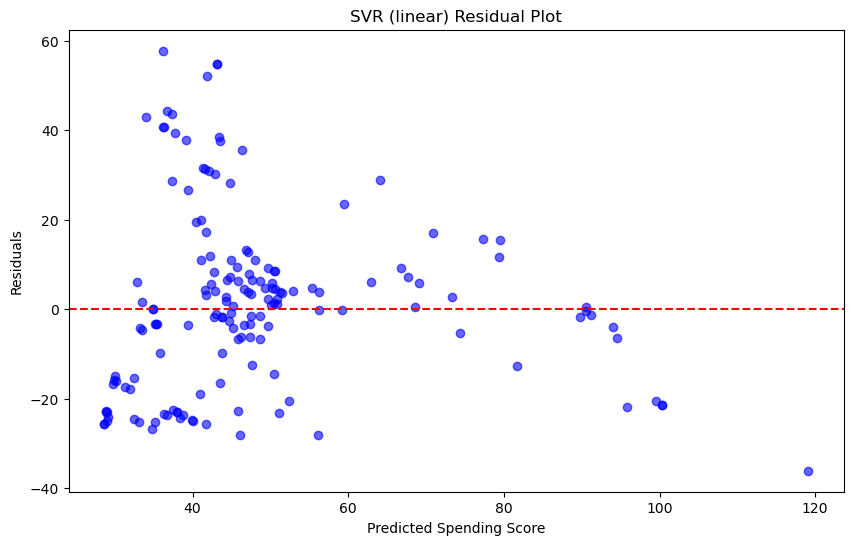

In [171]:
# Plot a residual plot
residuals = y_test - y_pred
plt.figure(figsize=(10, 6))
plt.scatter(y_pred, residuals, color="blue", alpha=0.6)
plt.axhline(y=0, color="red", linestyle='--')
plt.xlabel("Predicted Spending Score")
plt.ylabel("Residuals")
plt.title("SVR (linear) Residual Plot")
plt.show()

***Interpretation of the plot***: Both the simple linear regression and the SVR (linear kernel) models have produced similar(or the same) scatterplots and residual plots.

In [173]:
# Train the model using the rbf kernel.
svr_rbf = SVR(C=10, epsilon=0.1, kernel='rbf')

# Fit the model to the training data
svr_rbf.fit(X_train_scaled, y_train_scaled)

SVR(C=10)

In [174]:
# Make predictions using the test data
y_pred_scaled = svr_rbf.predict(X_test_scaled)

In [175]:
# Convert predictions back to the original scale
y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1))

In [176]:
# Evaluate the model
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Linear Kernel SVR - C=10, epsilon=0.1")
print(f"MAE: {mae:.2f}")
print(f"MSE: {mse:.2f}")
print(f"R² Score: {r2:.2f}")

Linear Kernel SVR - C=10, epsilon=0.1
MAE: 12.37
MSE: 308.43
R² Score: 0.52


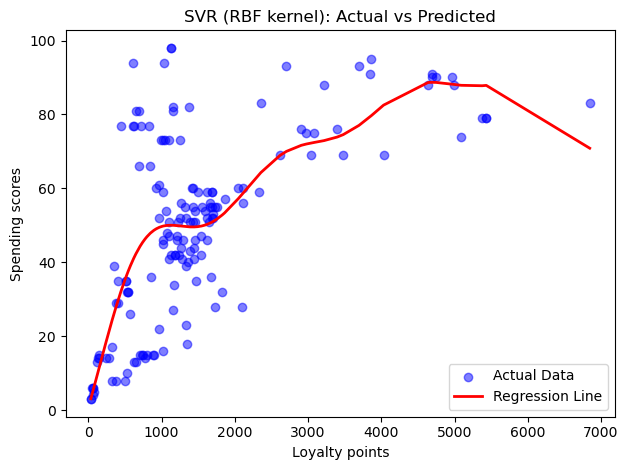

In [177]:
# Sort X_test and corresponding predictions for a smooth curve
sorted_indices = np.argsort(X_test.flatten())
X_test_sorted = X_test[sorted_indices]
y_pred_sorted = y_pred[sorted_indices]

# Plot actual vs. predicted values
plt.scatter(X_test, y_test, color="blue", label="Actual Data", alpha=0.5)

# Regression line using predictions
plt.plot(X_test_sorted, y_pred_sorted, color="red", linewidth=2, label="Regression Line")

# Labels and title
plt.xlabel("Loyalty points")
plt.ylabel("Spending scores")
plt.title("SVR (RBF kernel): Actual vs Predicted")
plt.legend()

# Show plot
plt.tight_layout()
plt.show()

***Interpretation of the plot***: The regression line attempts to fit to the data and does this by not fitting a straight line suggesting that a linear regression model might not be best model to use for predictions. However, the model still has large residuals indicating a poor fit.

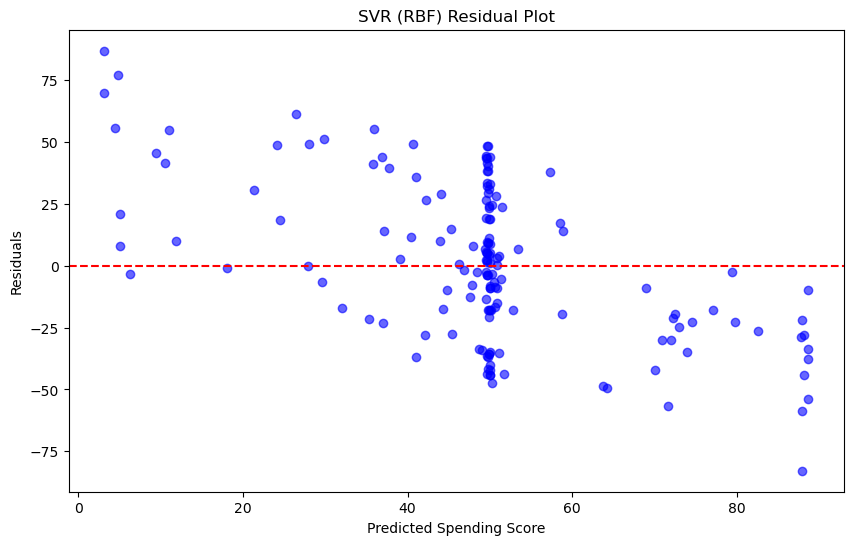

In [179]:
# Plot the residual plot.
residuals = y_test - y_pred_sorted
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_sorted, residuals, color="blue", alpha=0.6)
plt.axhline(y=0, color="red", linestyle='--')
plt.xlabel("Predicted Spending Score")
plt.ylabel("Residuals")
plt.title("SVR (RBF) Residual Plot")
plt.show()

***Interpretation of the plot***: There is a gradually decreasing trend, not a random scatter of residuals around zero. This probably means that  the model isn't correctly capturing the underlying data distribution correctly. There may be underfitting or overfitting. I could decrease the epsilon value (there was a choice between 0.01 and 0.1 after using GridSearch) but this would risk more overfitting.

***Summary of the model:***
- ***What's good about the model?***: R-squared values are ok (0.39 for linear kernel and 0.52 for the rbf kernel).
- ***What needs to be improved about the model?***: Errors still too high so this model is a poor fit as well.

***Overall***: All of these regression models seem to be  poor fit for the data, although they do indicate a positive correlation between the variables. This suggests that the best approach may be to fit a non-linear model such as a decision tree.

#### 2. Can we use spending scores to predict loyalty points? How strong is this trend?
Business question this helps to answer: Are loyalty points an important metric that can be leveraged in future marketing activities?

##### Model used: Simple linear regression (no transformations)

In [184]:
# Define the dependent variable.
y = reviews_nreviews["loyalty_points"] 

# Define the independent variable.
X = reviews_nreviews["spending_score"]

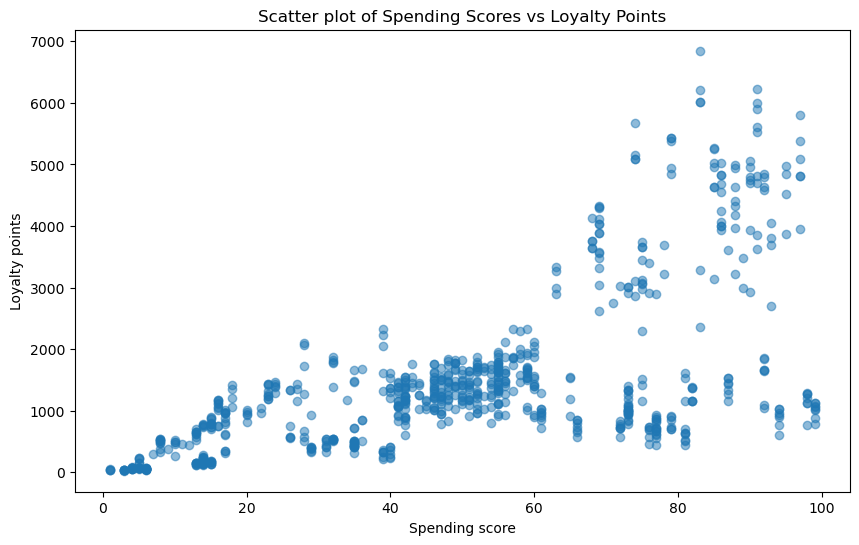

In [185]:
# Create scatterplot.
plt.figure(figsize=(10, 6))
plt.scatter(reviews_nreviews["spending_score"], reviews_nreviews["loyalty_points"], alpha=0.5)
plt.xlabel("Spending score")
plt.ylabel("Loyalty points")
plt.title("Scatter plot of Spending Scores vs Loyalty Points")

# Get the title from the plot
plot_title = plt.gca().get_title()

# Clean the title to create a filename
clean_title = re.sub(r'[^\w\s-]', '', plot_title.replace("\n", " ")).strip().replace(' ', '_').lower()
filename = f"{clean_title}.png"

# Save the figure
plt.savefig(filename, dpi=500, bbox_inches="tight")

plt.show()

***Interpretation of the plot***: Linear correlation, but much better correlation for the lower spending scores than the higher spending scores where it is much harder to predict what the loyalty points are going to be. Linear regression is maybe not the best model to use because of this.

In [187]:
# Change X into a 2D array so that OLS works.
X = X.values.reshape(-1,1)

In [188]:
# Split the data in 'train' (80%) and 'test' (20%) sets.
# Using 20% test data as this is a small data set so having a larger training data set helps the model learn better.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

# Training the model using the 'statsmodel' OLS library.
# Fit the model with the added constant.
sslp_model = sm.OLS(y_train, sm.add_constant(X_train)).fit()

# Set the predicted response vector.
y_pred = sslp_model.predict(sm.add_constant(X_test)) 

# Print the model summary.
print(sslp_model.summary())

                            OLS Regression Results                            
Dep. Variable:         loyalty_points   R-squared:                       0.401
Model:                            OLS   Adj. R-squared:                  0.400
Method:                 Least Squares   F-statistic:                     417.4
Date:                Fri, 11 Apr 2025   Prob (F-statistic):           2.11e-71
Time:                        21:04:48   Log-Likelihood:                -5216.6
No. Observations:                 625   AIC:                         1.044e+04
Df Residuals:                     623   BIC:                         1.045e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -52.1208     85.701     -0.608      0.5

***Analysis of the model summary***:
- R-squared: Same as for the previous regression. About 40% of the variance in the loyalty points is explained by the change in the spending score. This isn't very bad, but is a there is a significant amount of variance which isn't explained. It shows that the spending score does have some influence over loyalty points but also indicates that there are probably other factors that affect loyalty points as well.
- coefficient = 31.0856 This means that for each increase of 1 spending score (1-100), loyalty points increase on average by 31. This at first looks like a very large positive increase. ***However, the ranges of spending scores and loyalty points are very different. Spending_score has a range of 98 whilst loyalty_points has a range of 6822. Therefore, loyalty points changing by 30 isn't very much.***
- the p value is 0.000 which is less than 0.05. This shows that the effect that the spending score has on loyalty points is statistically significant.
- We can be 95% confident that the coeffecient is between 28.098 and 34.074. This means that we can be 95% confident that for every 1 spending score increase, loyalty points will increase by between 28.098 and 34.074.
- The standard error is small (1.522) (with the coefficient of 31.0856) which suggests that the coefficient is precise as if repeated samples were taken from the same population, the coefficient wouldn't vary much.
- The kurtosis value is 4.248 which is greater than 3, so the distribution has a sharper peak and heavier tails than a normal distribution. It suggests that there are more outliers than in a normal distribution.
- A skew of 0.699 suggests moderate right skew suggesting there are some larger values (outliers?) pulling the mean towards the right.

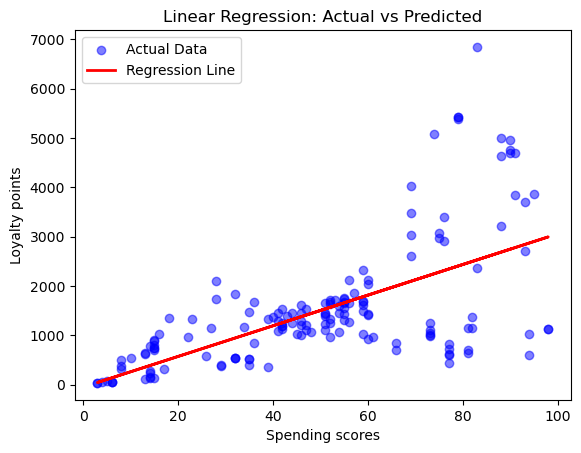

In [190]:
# Scatter plot of actual vs predicted values.
plt.scatter(X_test, y_test, color="blue", label="Actual Data", alpha=0.5)

# Regression line using predictions
plt.plot(X_test, y_pred, color="red", linewidth=2, label="Regression Line")

# Labels and title
plt.xlabel("Spending scores")
plt.ylabel("Loyalty points")
plt.title("Linear Regression: Actual vs Predicted")
plt.legend()

# Get the title from the plot
plot_title = plt.gca().get_title()

# Clean the title to create a filename
clean_title = re.sub(r'[^\w\s-]', '', plot_title.replace("\n", " ")).strip().replace(' ', '_').lower()
filename = f"{clean_title}.png"

# Save the figure
plt.savefig(filename, dpi=500, bbox_inches="tight")

plt.show()

***Interpretation of the plot***: The model seems to work the best on spending scores that are less than 60, but quite poorly above 60. This suggests that there isn't much correlation between high spending scores and loyalty points, although the higher loyalty point values only appear with higher spending scores, suggesting that those with low spending scores are very unlikely to have high loyalty points.

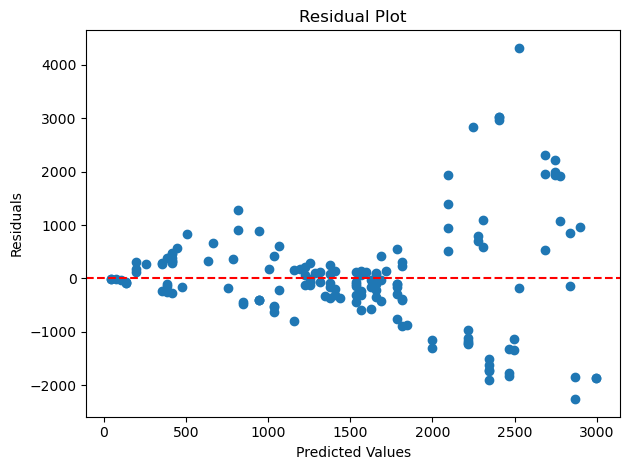

{'LM stat': 226.0177557537347, 'LM Test p-value': 4.4038854345637086e-51, 'F-stat': 352.9206220707522, 'F-test p-value': 1.0106101850766306e-62}


In [192]:
# Check for homoscedasticity (one of the simple linear regression assumptions).
homoscedasticity_check(y_test, y_pred, sslp_model)

***Interpretation of the plot***: The residuals don't seem to be randomly scattered and have a funnel shape suggesting heteroscedasticity.

The p value is much lower than 0.05 which means that the null hypothesis that there is no heteroscedasticity present is strongly rejected. This means that there is ***strong evidence that heteroscedasticity is present*** which means that the variance of the residuals isn't constant. This violates one of the assumptions of linear regression that ***homoscedasicity*** is present.

I now know that I cannot use this model, at least in it's current form without transformations. However, I will do some further analysis of the model so I can compare this model better with other models.

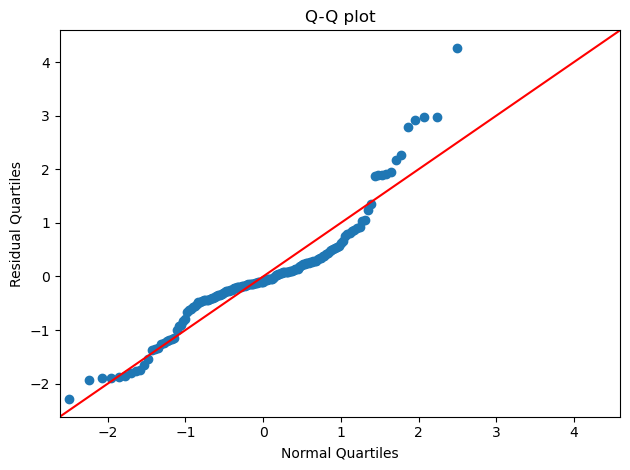

In [194]:
# Create a Q-Q plot to visulise whether the residuals follow a normal distribution (another assumption).
create_qqplot(y_test, y_pred)

***Interpretation of the plot***: This shows similar to above, that in the upper quartiles of the data the data is skewed and there are outliers. The residuals do not follow a normal distribution.

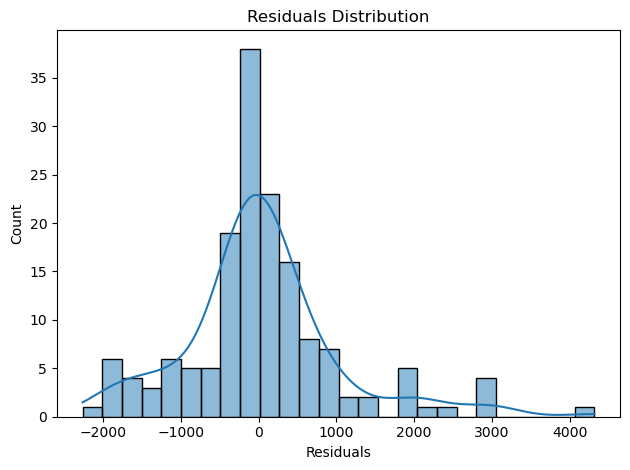

In [196]:
# Histogram of residuals (should be roughly normal)
hist_residuals(y_test, y_pred)

***Interpretation of the plot***: This shows more clearly that there is a right skew to the residuals and there are outliers.

In [198]:
# Evaluate how well the model performs on the test data.
# Calculate mean absolute error.
mae = metrics.mean_absolute_error(y_test, y_pred)
print('Mean Absolute Error:', mae)

# Calculate mean squared error.
mse = metrics.mean_squared_error(y_test, y_pred)
print('Mean Squared Error:', mse)

# Calculate root mean squared error.
rmse = np.sqrt(mse)
print('Root Mean Squared Error:', rmse)

Mean Absolute Error: 664.4513400107764
Mean Squared Error: 1009729.4128670875
Root Mean Squared Error: 1004.8529309640727


The RMSE is approx 1004 will is a huge error as the range of loyalty points is 6822 (see below). We cannot be precise in our predictions.

In [200]:
reviews_nreviews.describe()

,customer_id,n_reviews,age,income_k,spending_score,loyalty_points,loyalty_points_log
count,782.000000,782.000000,782.000000,782.000000,782.000000,782.000000,782.000000
mean,391.500000,2.557545,39.554987,46.058414,49.604859,1497.404092,6.890578
std,225.888247,2.631171,13.666746,25.249759,26.593610,1313.241715,1.065053
min,1.000000,1.000000,17.000000,12.300000,1.000000,25.000000,3.218876
25%,196.250000,1.000000,29.000000,23.165000,29.000000,701.000000,6.552508
50%,391.500000,1.000000,38.000000,44.280000,50.000000,1187.000000,7.079184
75%,586.750000,7.000000,49.000000,63.960000,73.000000,1658.000000,7.413367
max,782.000000,9.000000,72.000000,112.340000,99.000000,6847.000000,8.831566


***Summary of the model:***
- ***What's good about the model?***: Ok R-squared (0.401). Regression line shows a clear positive correlation between spending scores and loyalty points.
- ***What needs to be improved about the model?***: Violates assumptions of homoscedasticity and normality of residuals, and the RMSE is very large. The residual values need to be significantly lower, there needs to be homoscedasticity, and normality of residuals.

##### Model used: Simple linear regression (with log transformation on loyalty points)

In [203]:
# Define the dependent variable.
y = reviews_nreviews["loyalty_points_log"] 

# Define the independent variable.
X = reviews_nreviews["spending_score"]

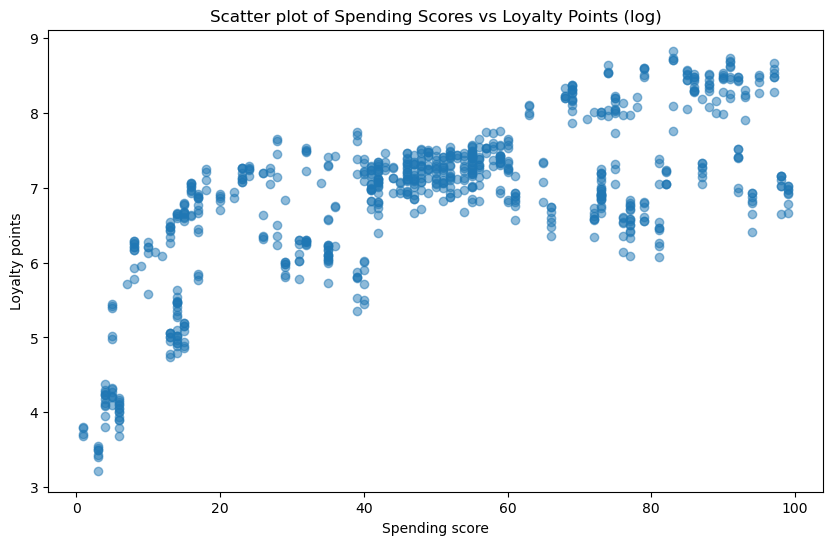

In [204]:
# Create scatterplot using "loyalty_points_log".
plt.figure(figsize=(10, 6))
plt.scatter(reviews_nreviews["spending_score"], reviews_nreviews["loyalty_points_log"], alpha=0.5)
plt.xlabel("Spending score")
plt.ylabel("Loyalty points")
plt.title("Scatter plot of Spending Scores vs Loyalty Points (log)")

# Get the title from the plot
plot_title = plt.gca().get_title()

# Clean the title to create a filename
clean_title = re.sub(r'[^\w\s-]', '', plot_title.replace("\n", " ")).strip().replace(' ', '_').lower()
filename = f"{clean_title}.png"

# Save the figure
plt.savefig(filename, dpi=500, bbox_inches="tight")

plt.show()

***Interpretation of the plot***: Positive correlation but not a strong linear correlation.

In [206]:
# Change X into a 2D array so that OLS works.
X = X.values.reshape(-1,1)

In [207]:
# Split the data into 'train' (80%) and 'test' (20%) sets.
# Using 20% test data as this is a small data set so having a larger training data set helps the model learn better.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

# Training the model using the 'statsmodel' OLS library.
# Fit the model with the added constant.
sslp_model_log = sm.OLS(y_train, sm.add_constant(X_train)).fit()

# Set the predicted response vector (in log scale).
y_pred_log = sslp_model_log.predict(sm.add_constant(X_test))

# Convert predictions back to original scale
y_pred = np.exp(y_pred_log) 

# Print the model summary.
print(sslp_model_log.summary())

                            OLS Regression Results                            
Dep. Variable:     loyalty_points_log   R-squared:                       0.506
Model:                            OLS   Adj. R-squared:                  0.506
Method:                 Least Squares   F-statistic:                     639.2
Date:                Fri, 11 Apr 2025   Prob (F-statistic):           1.34e-97
Time:                        21:04:58   Log-Likelihood:                -714.27
No. Observations:                 625   AIC:                             1433.
Df Residuals:                     623   BIC:                             1441.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          5.4544      0.064     85.560      0.0

***Analysis of model summary:***
- R-squared is 0.506 which means an ok amount of the variance in the dependent variable is explained by the independent variable.
- p-values are less than 0.05 so spending scores have a statistically significant effect on loyalty points.
- Kurtosis is close to 3 so is close to a normal distribution but has lighter tails so has fewer extreme outliers.

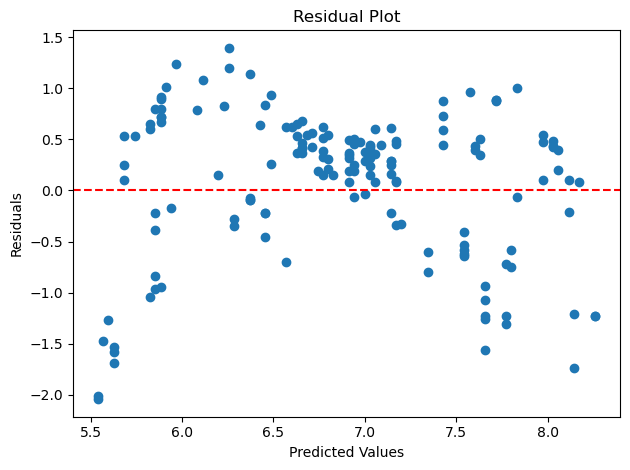

{'LM stat': 0.0132488525438762, 'LM Test p-value': 0.9083629589330371, 'F-stat': 0.013206736174320504, 'F-test p-value': 0.9085451130122614}


In [209]:
# Predict y_train in the log scale
y_train_pred_log = lpss_model_log.predict(sm.add_constant(X_train))

# Calculate residuals
residuals_log = y_train - y_train_pred_log  

# Homoscedasticity check.
homoscedasticity_check(y_test, y_pred_log, lpss_model_log)

***Interpretation of the plot***: The Breusch-Pagan result suggests no heteroscedasticity, but looking at the plot, there definitely is a pattern. This may be because Breusch-Pagan assumes linearity so if the relationship here is non-linear, it might be falsely labelling this as having homoscedasticity.

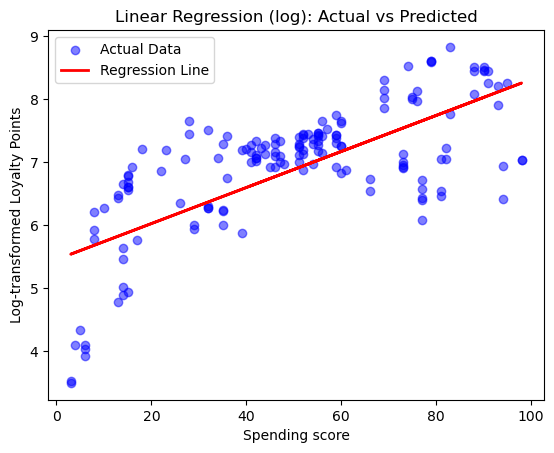

In [211]:
# Scatter plot of actual vs predicted values
plt.scatter(X_test, y_test, color="blue", label="Actual Data", alpha=0.5)

# Regression line using predictions
plt.plot(X_test, y_pred_log, color="red", linewidth=2, label="Regression Line")

# Labels and title
plt.xlabel("Spending score")
plt.ylabel("Log-transformed Loyalty Points")
plt.title("Linear Regression (log): Actual vs Predicted")
plt.legend()

# Get the title from the plot
plot_title = plt.gca().get_title()

# Clean the title to create a filename
clean_title = re.sub(r'[^\w\s-]', '', plot_title.replace("\n", " ")).strip().replace(' ', '_').lower()
filename = f"{clean_title}.png"

# Save the figure
plt.savefig(filename, dpi=500, bbox_inches="tight")

plt.show()

***Interpretation of the plot***: Looks like there are lots of moderate to large residuals.

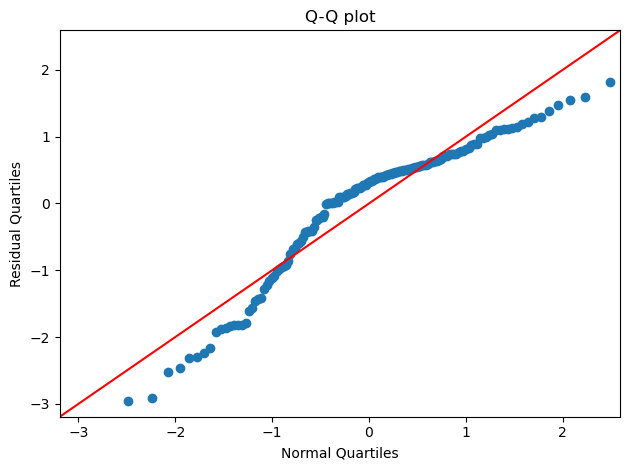

In [213]:
# Create Q-Q plot to check for normality of residuals.
create_qqplot(y_test, y_pred_log, title="Q-Q plot")

***Interpretation of the plot***: The residuals do not follow a normal distribution.

In [215]:
# Evaluate how well the model performs on the test data.

# Convert predictions back to original scale
y_test_original = np.exp(y_test) 

# Calculate mean absolute error.
mae = metrics.mean_absolute_error(y_test_original, y_pred)
print('Mean Absolute Error:', mae)

# Calculate mean squared error.
mse = metrics.mean_squared_error(y_test_original, y_pred)
print('Mean Squared Error:', mse)

# Calculate root mean squared error.
rmse = np.sqrt(mse)
print('Root Mean Squared Error:', rmse)

Mean Absolute Error: 746.8266096654695
Mean Squared Error: 1130085.4699244162
Root Mean Squared Error: 1063.054782184068


Very large errors.

***Summary of the model:***
- ***What's good about the model?***: Possibly has less heteroscedasticity than simple linear regression without the log transformation and has a better R-squared.
- ***What needs to be improved about the model?***: Violates normality of residuals worse than for the previous model with transformations. Also has a larger RMSE (1063.05 rather than 1004.85). These are very large errors. I'm going to see whether the a support vector regression model works better.

##### Model used: Support Vector Regression

In [219]:
# Feature scaling (standardisation of the features)

# Define the dependent variable.
y = reviews_nreviews["loyalty_points"] 

# Define the independent variable.
X = reviews_nreviews["spending_score"]

X = X.values.reshape(-1,1)

# Split the data in 'train' (80%) and 'test' (20%) sets.
# Using 20% test data as this is a small data set so having a larger training data set helps the model learn better.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)
# Convert y_train and y_test to 2D arrays before scaling
y_train = y_train.values.reshape(-1, 1)
y_test = y_test.values.reshape(-1, 1)

# Scale the data
scaler_X = StandardScaler()
scaler_y = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train)
X_test_scaled = scaler_X.transform(X_test)
y_train_scaled = scaler_y.fit_transform(y_train).ravel()
y_test_scaled = scaler_y.transform(y_test).ravel()

I'm tuning the hyperparameters using GridSearchCV to find the best parameters to use in my SVR model. I'm going to try this with two different regression scoring metrics: 1. R squared ('r2')   2. Negative MAE ('neg_mean_absolute_error').  The default is R squared, but just because there is a good R squared score, it doesn't necessarily mean that the model performs well. I'm also using the negative MAE as a scoring metric because it measures the error in the model but treats all errors equally meaning it's less sensitive to outliers than RMSE (which I know from previous analysis I've had some problem with).

In [221]:
# Hyperparameter tuning using GridSearchCV (cross-validation technique)
# This uses the R squared scores as the regression scoring metric.
# Define hyperparameter grid
param_grid = {
    'C': [0.1, 1, 10, 100], 
    'epsilon': [0.01, 0.1, 0.5, 1],
    'kernel': ['linear', 'rbf', 'poly']}
svr = SVR()
grid_search = GridSearchCV(svr, param_grid, cv=5, scoring='r2', n_jobs=-1)
grid_search.fit(X_train_scaled, y_train_scaled)
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

Best Hyperparameters: {'C': 100, 'epsilon': 0.5, 'kernel': 'rbf'}


In [222]:
# Hyperparameter tuning using GridSearchCV (cross-validation technique)
# This uses the negative mean absolute error scores as the regression scoring metric.
# Define hyperparameter grid
param_grid = {
    'C': [0.1, 1, 10, 100], 
    'epsilon': [0.01, 0.1, 0.5, 1],
    'kernel': ['linear', 'rbf', 'poly']}
svr = SVR()
grid_search = GridSearchCV(svr, param_grid, cv=5, scoring='neg_mean_absolute_error', n_jobs=-1)
grid_search.fit(X_train_scaled, y_train_scaled)
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

Best Hyperparameters: {'C': 100, 'epsilon': 0.1, 'kernel': 'rbf'}


***Analysis of hyperparameter tuning:***
Both say to use ***C=100***. This is a high value of C. This will produce a more complex model that will try to fit the training data closely. This will miimise error but there is a risk of overfitting.

Two different epsilon values are provided, ***epsilon=0.1 and epsilon=0.5***. These are both moderate epsilon values. This means that there is a more reasonable margin of error, reducing the risk of overfitting by ignoring small variations in the data.

Interestingly, both attempts at tuning the hyperparameters recommended using a RBF kernel rather than a linear kernel, suggesting that the data has non-linear relationships which can be modelled better using RBF. However, RBF is more complex to interpret and slows down performance. Therefore, I'm first going to check whether there is significant difference between using the RBF kernel and the linear kernel.

In [224]:
# Comparing the R squared and MAE scores of the RBF and linear kernels.
# Define custom scorers for GridSearchCV
mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False)
rmse_scorer = make_scorer(lambda y_true, y_pred: np.sqrt(mean_squared_error(y_true, y_pred)), greater_is_better=False)

# Linear Kernel
svr_linear = SVR(kernel='linear', C=100)
linear_r2_score = cross_val_score(svr_linear, X_train_scaled, y_train_scaled, cv=5, scoring='r2').mean()
linear_mae_score = cross_val_score(svr_linear, X_train_scaled, y_train_scaled, cv=5, scoring=mae_scorer).mean()
linear_rmse_score = cross_val_score(svr_linear, X_train_scaled, y_train_scaled, cv=5, scoring=rmse_scorer).mean()

# RBF Kernel
svr_rbf = SVR(kernel='rbf', C=100, gamma='scale')
rbf_r2_score = cross_val_score(svr_rbf, X_train_scaled, y_train_scaled, cv=5, scoring='r2').mean()
rbf_mae_score = cross_val_score(svr_rbf, X_train_scaled, y_train_scaled, cv=5, scoring=mae_scorer).mean()
rbf_rmse_score = cross_val_score(svr_rbf, X_train_scaled, y_train_scaled, cv=5, scoring=rmse_scorer).mean()

# Print results
print(f"Linear Kernel R² Score: {linear_r2_score:.2f}")
print(f"Linear Kernel MAE Score: {abs(linear_mae_score):.2f}")
print(f"Linear Kernel RMSE Score: {abs(linear_rmse_score):.2f}")

print(f"RBF Kernel R² Score: {rbf_r2_score:.2f}")
print(f"RBF Kernel MAE Score: {abs(rbf_mae_score):.2f}")
print(f"RBF Kernel RMSE Score: {abs(rbf_rmse_score):.2f}")

Linear Kernel R² Score: 0.36
Linear Kernel MAE Score: 0.54
Linear Kernel RMSE Score: 0.79
RBF Kernel R² Score: 0.36
RBF Kernel MAE Score: 0.48
RBF Kernel RMSE Score: 0.77


In [225]:
# Convert MAE and RMSE from scaled units to original units.
mae_linear_original = scaler_y.inverse_transform([[linear_mae_score]])[0][0]
mae_rbf_original = scaler_y.inverse_transform([[rbf_mae_score]])[0][0]
rmse_linear_original = scaler_y.inverse_transform([[linear_rmse_score]])[0][0]
rmse_rbf_original = scaler_y.inverse_transform([[rbf_rmse_score]])[0][0]

print(f"Linear Kernel MAE (Original Scale): {mae_linear_original:.2f}")
print(f"RBF Kernel MAE (Original Scale): {mae_rbf_original:.2f}")
print(f"Linear Kernel RMSE (Original Scale): {rmse_linear_original:.2f}")
print(f"RBF Kernel RMSE (Original Scale): {rmse_rbf_original:.2f}")

Linear Kernel MAE (Original Scale): 772.20
RBF Kernel MAE (Original Scale): 860.71
Linear Kernel RMSE (Original Scale): 444.47
RBF Kernel RMSE (Original Scale): 476.96


The R squared values are the same. 
As with the previous question, at first it appears that RBF is the best option, but when the values are converted back to the original scale, the linear kernel actually performs better. 
The R squared is worse for both kernels than it is for the simple linear regression model. Initially, I just tested for MAE but was really unsure whether it was worth using a SVR model. I then decided to work out the RMSE as well and discovered that the RMSE for both kernels is ***significantly better*** than when using a simple linear regression (1004). I will use a SVR model using a linear kernel.

In [227]:
# Train the model using the linear kernel.
svr_linear = SVR(C=100, epsilon=0.1, kernel='linear')

# Fit the model to the training data
svr_linear.fit(X_train_scaled, y_train_scaled)

SVR(C=100, kernel='linear')

In [228]:
# Make predictions using the test data
y_pred_scaled = svr_linear.predict(X_test_scaled)

In [229]:
# Convert predictions back to the original scale
y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1))

In [230]:
# Evaluate the model
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Linear Kernel SVR - C=100, epsilon=0.1")
print(f"MAE: {mae:.2f}")
print(f"MSE: {mse:.2f}")
print(f"R² Score: {r2:.2f}")

Linear Kernel SVR - C=100, epsilon=0.1
MAE: 667.40
MSE: 1067850.93
R² Score: 0.36


This means that the RMSE is 1033.37 - very large.

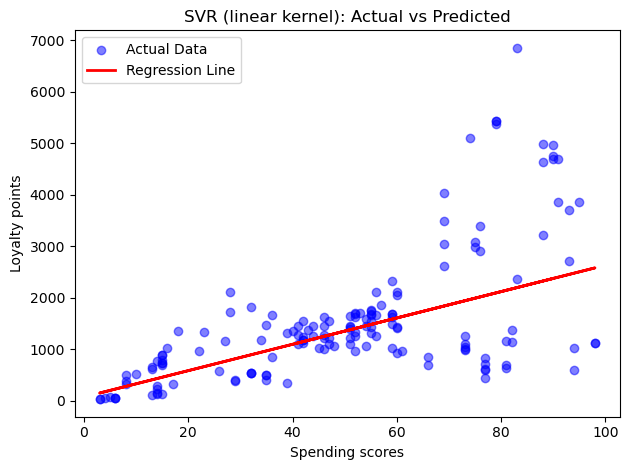

In [232]:
# Plot actual vs. predicted values
plt.scatter(X_test, y_test, color="blue", label="Actual Data", alpha=0.5)

# Regression line using predictions
plt.plot(X_test, y_pred, color="red", linewidth=2, label="Regression Line")

# Labels and title
plt.xlabel("Spending scores")
plt.ylabel("Loyalty points")
plt.title("SVR (linear kernel): Actual vs Predicted")
plt.legend()

# Show plot
plt.tight_layout()
plt.show()

***Interpretation of the plot***: This model is best at predicting when the spending scores are lower but over a spending score of 60, is a poor fit.

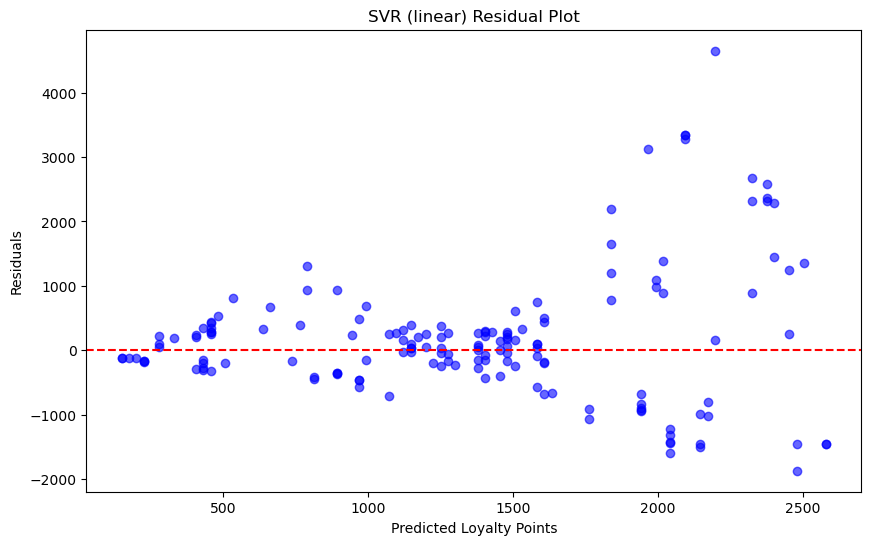

In [234]:
# Plot the residual plot to see if the residuals are randomly scattered.
residuals = y_test - y_pred
plt.figure(figsize=(10, 6))
plt.scatter(y_pred, residuals, color="blue", alpha=0.6)
plt.axhline(y=0, color="red", linestyle='--')
plt.xlabel("Predicted Loyalty Points")
plt.ylabel("Residuals")
plt.title("SVR (linear) Residual Plot")
plt.show()

***Interpretation of the plot***: The predictions for lower values of loyalty points have on average smaller residuals, but larger residuals once loyalty points exceed about 1700.

***Summary of the model:***
- ***What's good about the model?***: Seems to predict up to a spending score of about 60.
- ***What needs to be improved about the model?***: After a spending score of about 60, the residuals tend to get much larger meaning that this model poorly predicts loyalty points at these values.

#### 3. Does customer income influence loyalty points gained?
Business question this helps to answer: Are loyalty points an important metric that can be leveraged in future marketing activities?

##### Model used: Simple linear regression (without transformations)

In [239]:
# Define the dependent variable.
y = reviews_nreviews["loyalty_points"] 

# Define the independent variable.
X = reviews_nreviews["income_k"]

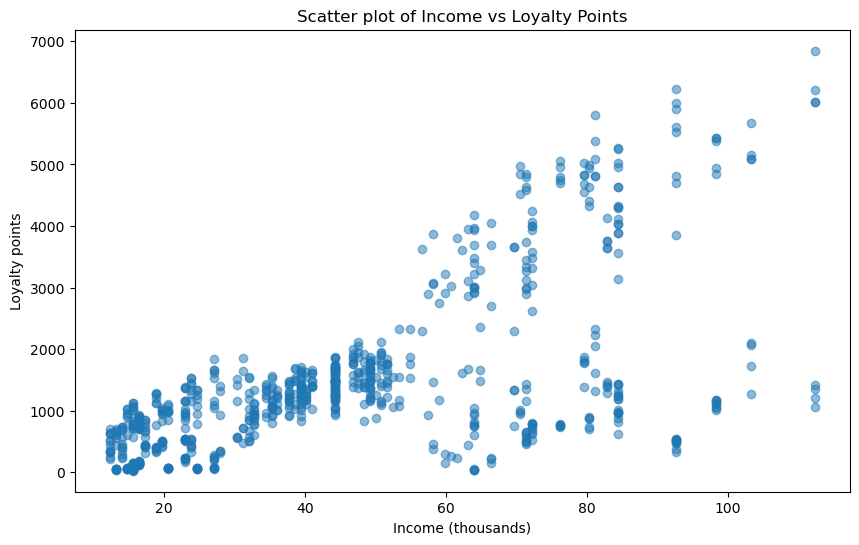

In [240]:
# Create scatterplot.
plt.figure(figsize=(10, 6))
plt.scatter(reviews_nreviews["income_k"], reviews_nreviews["loyalty_points"], alpha=0.5)
plt.xlabel("Income (thousands)")
plt.ylabel("Loyalty points")
plt.title("Scatter plot of Income vs Loyalty Points")

# Get the title from the plot
plot_title = plt.gca().get_title()

# Clean the title to create a filename
clean_title = re.sub(r'[^\w\s-]', '', plot_title.replace("\n", " ")).strip().replace(' ', '_').lower()
filename = f"{clean_title}.png"

# Save the figure
plt.savefig(filename, dpi=500, bbox_inches="tight")

plt.show()

***Interpretation of the plot***: Similar to the other simple linear regressions we have a funnel shape, meaning it would be easier to predict loyalty points based on income for the lower incomes (approx below £55k) but any predictions for the higher incomes would likely not be accurate.

In [242]:
# Change X into a 2D array so that OLS works.
X = X.values.reshape(-1,1)

In [243]:
# Split the data in 'train' (80%) and 'test' (20%) sets.
# Using 20% test data as this is a small data set so having a larger training data set helps the model learn better.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

# Training the model using the 'statsmodel' OLS library.
# Fit the model with the added constant.
inlp_model = sm.OLS(y_train, sm.add_constant(X_train)).fit()

# Set the predicted response vector.
y_pred = inlp_model.predict(sm.add_constant(X_test)) 

# Print the model summary.
print(inlp_model.summary())

                            OLS Regression Results                            
Dep. Variable:         loyalty_points   R-squared:                       0.398
Model:                            OLS   Adj. R-squared:                  0.397
Method:                 Least Squares   F-statistic:                     412.6
Date:                Fri, 11 Apr 2025   Prob (F-statistic):           9.07e-71
Time:                        21:05:18   Log-Likelihood:                -5218.0
No. Observations:                 625   AIC:                         1.044e+04
Df Residuals:                     623   BIC:                         1.045e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -28.4011     85.109     -0.334      0.7

***Analysis of the model summary***:
- R-squared: About 40% (similar to the other simple linear regressions) of the variance in income is explained by the change in loyalty points. This isn't bad, but is a there is a significant amount of variance which isn't explained. It shows that the income does have some influence over loyalty points but also indicates that there are probably other factors that affect loyalty points as well.
- intercept = -28.4011. This means that when income is 0, loyalty points are predicted to be about -28. This is impossible so this number does not matter (also the p value is very high, 0.739 so not statistically significant).
- coefficient = 33.1426. This means that for each increase of £1k, loyalty points increase on average by 33. In other words, for each £10k increase in income, we would expect 330 extra loyalty points (the max number of loyalty points in the data is 6847).
- the p value is 0.000 which is less than 0.05. This shows that the effect that income has on loyalty points is statistically significant.
- We can be 95% confident that the coefficient is between 29.938 and 36.347. This means that we can be 95% confident that for every £1k income increase, loyalty points will increase by between 29.938 and 36.347.
- The standard error is small (1.632) (with the coefficient of 33.1426) which suggests that the coefficient is precise as if repeated samples were taken from the same population, the coefficient wouldn't vary much.
- The kurtosis value is 3.907 which is greater than 3, so the distribution has a sharper peak and heavier tails than a normal distribution. It suggests that there are more outliers than in a normal distribution.
- A skew of 0.208 suggests a slight right skew suggesting there are some larger values (outliers?) pulling the mean towards the right.

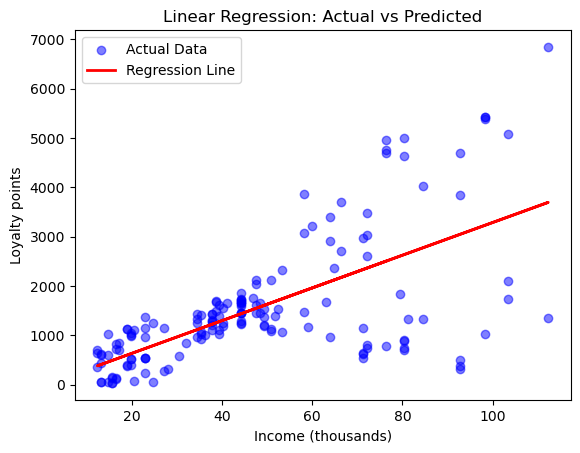

In [245]:
# Scatter plot of actual vs predicted values.
plt.scatter(X_test, y_test, color="blue", label="Actual Data", alpha=0.5)

# Regression line using predictions
plt.plot(X_test, y_pred, color="red", linewidth=2, label="Regression Line")

# Labels and title
plt.xlabel("Income (thousands)")
plt.ylabel("Loyalty points")
plt.title("Linear Regression: Actual vs Predicted")
plt.legend()

# Get the title from the plot
plot_title = plt.gca().get_title()

# Clean the title to create a filename
clean_title = re.sub(r'[^\w\s-]', '', plot_title.replace("\n", " ")).strip().replace(' ', '_').lower()
filename = f"{clean_title}.png"

# Save the figure
plt.savefig(filename, dpi=500, bbox_inches="tight")

plt.show()

***Interpretation of the plot***: As noted earlier, the incomes lower than about £55k fit the regression line much better than incomes above £55k. As income gets higher, the residuals get larger. Linear regression doesn't seem to fit well for comparing income and loyalty points.

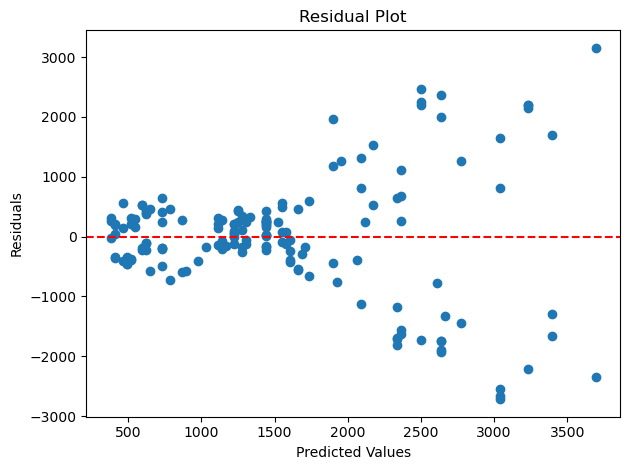

{'LM stat': 337.9408563638191, 'LM Test p-value': 1.7919232251046575e-75, 'F-stat': 733.4277906907377, 'F-test p-value': 2.3928427350148984e-107}


In [247]:
# Check for homoscedasticity (one of the simple linear regression assumptions).
homoscedasticity_check(y_test, y_pred, inlp_model)

***Interpretation of the plot***: The residuals don't seem to be randomly scattered and have a funnel shape showing heteroscedasticity.

The p value is much lower than 0.05 which means that the null hypothesis that there is no heteroscedasticity present is strongly rejected. This means that there is ***strong evidence that heteroscedasticity is present*** which means that the variance of the residuals isn't constant. This violates one of the assumptions of linear regression that ***homoscedasicity*** is present.

I now know that I cannot use this model, at least in it's current form. However, I will do some further analysis of the model so I can compare this model better with other models.

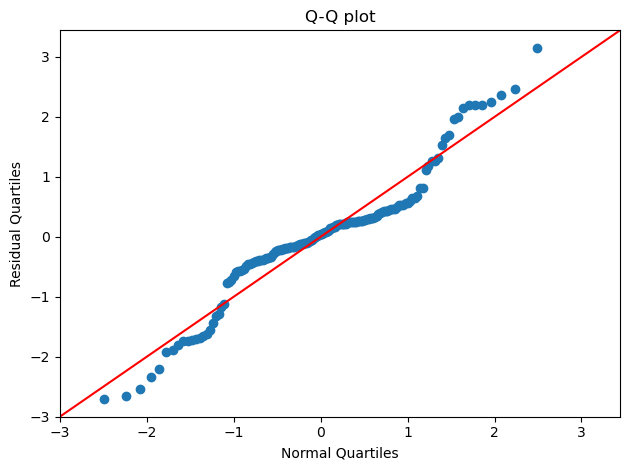

In [249]:
# Create a Q-Q plot to visulise whether the residuals follow a normal distribution (another assumption).
create_qqplot(y_test, y_pred)

***Interpretation of the plot***: Slight S shaped curve indicating that the residuals do not follow a normal distribution (however, they are close). The residuals show follow a normal distribution.

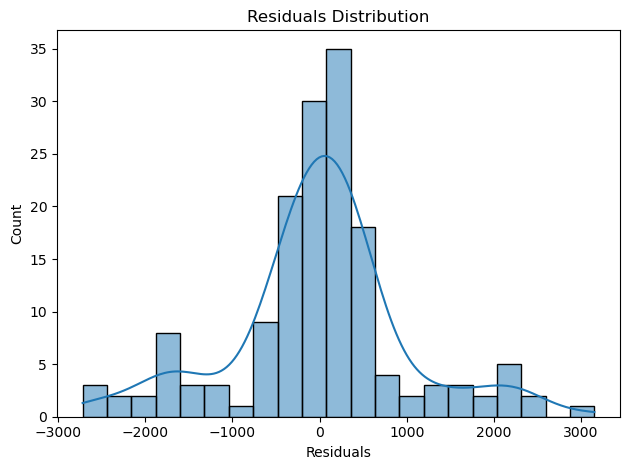

In [251]:
# Histogram of residuals (should be roughly normal)
hist_residuals(y_test, y_pred)

***Interpretation of the plot***: As shown in the Q-Q plot, the residuals only slightly don't follow a normal distribution so this could be ok, especially given that the sample size isn't small.

In [253]:
# Evaluate how well the model performs on the test data.
# Calculate mean absolute error.
mae = metrics.mean_absolute_error(y_test, y_pred)
print('Mean Absolute Error:', mae)

# Calculate mean squared error.
mse = metrics.mean_squared_error(y_test, y_pred)
print('Mean Squared Error:', mse)

# Calculate root mean squared error.
rmse = np.sqrt(mse)
print('Root Mean Squared Error:', rmse)

Mean Absolute Error: 689.9413967536071
Mean Squared Error: 1003511.0301857465
Root Mean Squared Error: 1001.7539768754335


The RMSE is approx 1001 will is a huge error as the range of loyalty points is 6822. We cannot be precise in our predictions.

***Summary of the model:***
- ***What's good about the model?***: Ok R-squared (but could be better) of 0.398.
- ***What needs to be improved about the model?***: There needs be no heteroscedasiticty (assumption has been violated). Again, the errors are very large meaning that the model is a poor fit so won't make predictions well.

##### Model used: Simple linear regression (using log transformation on loyalty points)

In [257]:
# Define the dependent variable.
y = reviews_nreviews["loyalty_points_log"] 

# Define the independent variable.
X = reviews_nreviews["income_k"]

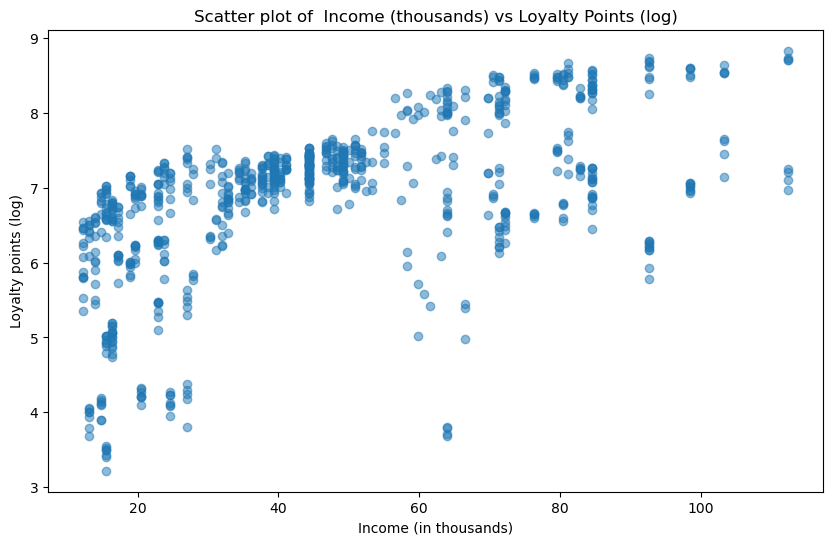

In [258]:
# Create scatterplot using "loyalty_points_log".
plt.figure(figsize=(10, 6))
plt.scatter(reviews_nreviews["income_k"], reviews_nreviews["loyalty_points_log"], alpha=0.5)
plt.xlabel("Income (in thousands)")
plt.ylabel("Loyalty points (log)")
plt.title("Scatter plot of  Income (thousands) vs Loyalty Points (log)")

# Get the title from the plot
plot_title = plt.gca().get_title()

# Clean the title to create a filename
clean_title = re.sub(r'[^\w\s-]', '', plot_title.replace("\n", " ")).strip().replace(' ', '_').lower()
filename = f"{clean_title}.png"

# Save the figure
plt.savefig(filename, dpi=500, bbox_inches="tight")

plt.show()

***Interpretation of the plot***: It shows the positive correlation but it looks like there will be lots of large residuals.

In [260]:
# Change X into a 2D array so that OLS works.
X = X.values.reshape(-1,1)

In [261]:
# Split the data into 'train' (80%) and 'test' (20%) sets.
# Using 20% test data as this is a small data set so having a larger training data set helps the model learn better.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

# Training the model using the 'statsmodel' OLS library.
# Fit the model with the added constant.
inlp_model_log = sm.OLS(y_train, sm.add_constant(X_train)).fit()

# Set the predicted response vector (in log scale).
y_pred_log = inlp_model_log.predict(sm.add_constant(X_test))

# Convert predictions back to original scale
y_pred = np.exp(y_pred_log) 

# Print the model summary.
print(inlp_model_log.summary())

                            OLS Regression Results                            
Dep. Variable:     loyalty_points_log   R-squared:                       0.311
Model:                            OLS   Adj. R-squared:                  0.310
Method:                 Least Squares   F-statistic:                     280.9
Date:                Fri, 11 Apr 2025   Prob (F-statistic):           2.55e-52
Time:                        21:05:25   Log-Likelihood:                -818.62
No. Observations:                 625   AIC:                             1641.
Df Residuals:                     623   BIC:                             1650.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          5.7746      0.075     77.368      0.0

***Analysis of model summary:***
- R-squared is 0.311 which means that a limited amount of the variance in the dependent variable is explained by the independent variable.
- p-values are less than 0.05 so income has a statistically significant effect on loyalty points.
- Kurtosis is over 3 meaning that there are heavier tails and an more extreme values. 
- The skew is -1.466 is a moderate to strong negative skew suggesting non-normality.

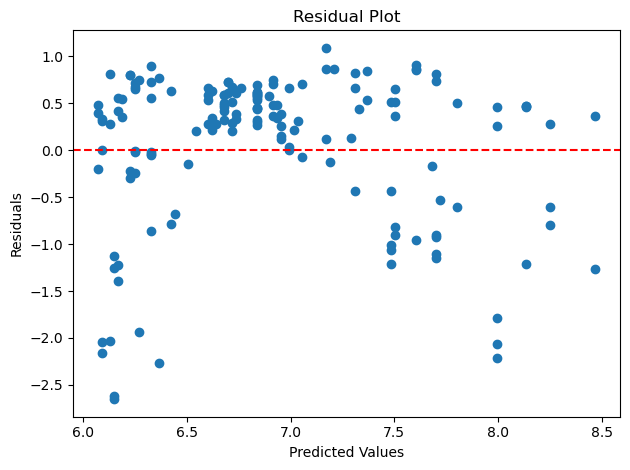

{'LM stat': 0.8024800193105058, 'LM Test p-value': 0.37035291739677234, 'F-stat': 0.8009404652006678, 'F-test p-value': 0.37115796251837263}


In [263]:
# Predict y_train in the log scale
y_train_pred_log = inlp_model_log.predict(sm.add_constant(X_train))

# Calculate residuals
residuals_log = y_train - y_train_pred_log  

# Homoscedasticity check.
homoscedasticity_check(y_test, y_pred_log, inlp_model_log)

***Interpretation of the plot***: The Breusch-Pagan result suggests no heteroscedasticity, but looking at the plot, there definitely is a pattern. This may be because Breusch-Pagan assumes linearity so if the relationship here is non-linear, it might be falsely labelling this as having homoscedasticity.

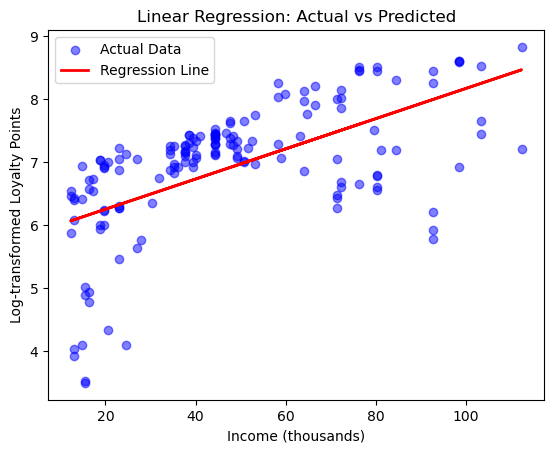

In [265]:
# Scatter plot of actual vs predicted values
plt.scatter(X_test, y_test, color="blue", label="Actual Data", alpha=0.5)

# Regression line using predictions
plt.plot(X_test, y_pred_log, color="red", linewidth=2, label="Regression Line")

# Labels and title
plt.xlabel("Income (thousands)")
plt.ylabel("Log-transformed Loyalty Points")
plt.title("Linear Regression: Actual vs Predicted")
plt.legend()

# Get the title from the plot
plot_title = plt.gca().get_title()

# Clean the title to create a filename
clean_title = re.sub(r'[^\w\s-]', '', plot_title.replace("\n", " ")).strip().replace(' ', '_').lower()
filename = f"{clean_title}.png"

# Save the figure
plt.savefig(filename, dpi=500, bbox_inches="tight")

plt.show()

***Interpretation of the plot***: As stated above, there are several large resisuals meaning that this model is overall a poor fit. It seems to fit a bit better for incomes of about £35k - £50k.

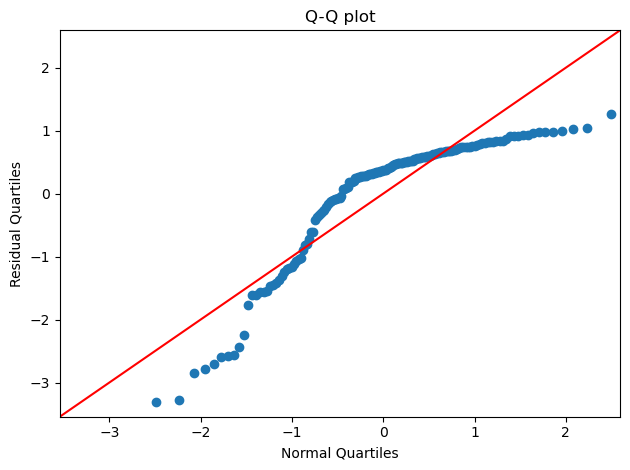

In [267]:
# Create Q-Q plot to check for normality of residuals.
create_qqplot(y_test, y_pred_log, title="Q-Q plot")

***Interpretation of the plot***: Residuals are not normal - violated assumption.

In [269]:
# Evaluate how well the model performs on the test data.

# Convert predictions back to original scale
y_test_original = np.exp(y_test) 

# Calculate mean absolute error.
mae = metrics.mean_absolute_error(y_test_original, y_pred)
print('Mean Absolute Error:', mae)

# Calculate mean squared error.
mse = metrics.mean_squared_error(y_test_original, y_pred)
print('Mean Squared Error:', mse)

# Calculate root mean squared error.
rmse = np.sqrt(mse)
print('Root Mean Squared Error:', rmse)

Mean Absolute Error: 808.0385070104684
Mean Squared Error: 1177953.1117564626
Root Mean Squared Error: 1085.335483505659


Very large errors.

***Summary of the model:***
- ***What's good about the model?***: There might not be as much heteroscedasticity as without the log transformation.
- ***What needs to be improved about the model?***: The residuals aren't normal, the skew is moderately negative (-1.466) so the data does not follow a normal distribution, and the errors are larger than for the previous model.

##### Model used: Support Vector Regression

In [273]:
# Feature scaling (standardisation of the features)

# Define the dependent variable.
y = reviews_nreviews['loyalty_points'] 

# Define the independent variable.
X = reviews_nreviews['income_k']

X = X.values.reshape(-1,1)

# Split the data in 'train' (80%) and 'test' (20%) sets.
# Using 20% test data as this is a small data set so having a larger training data set helps the model learn better.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

# Convert y_train and y_test to 2D arrays before scaling
y_train = y_train.values.reshape(-1, 1)
y_test = y_test.values.reshape(-1, 1)

# Scale the data
scaler_X = StandardScaler()
scaler_y = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train)
X_test_scaled = scaler_X.transform(X_test)
y_train_scaled = scaler_y.fit_transform(y_train).ravel()
y_test_scaled = scaler_y.transform(y_test).ravel()

I'm tuning the hyperparameters using GridSearchCV to find the best parameters to use in my SVR model. I'm going to try this with two different regression scoring metrics: 1. R squared ('r2')   2. Negative MAE ('neg_mean_absolute_error').  The default is R squared, but just because there is a good R squared score, it doesn't necessarily mean that the model performs well. I'm also using the negative MAE as a scoring metric because it measures the error in the model but treats all errors equally meaning it's less sensitive to outliers than RMSE (which I know from previous analysis I've had some problem with).

In [275]:
# Hyperparameter tuning using GridSearchCV (cross-validation technique)
# This uses the R squared scores as the regression scoring metric.
# Define hyperparameter grid
param_grid = {
    'C': [0.1, 1, 10, 100], 
    'epsilon': [0.01, 0.1, 0.5, 1],
    'kernel': ['linear', 'rbf', 'poly']}
svr = SVR()
grid_search = GridSearchCV(svr, param_grid, cv=5, scoring='r2', n_jobs=-1)
grid_search.fit(X_train_scaled, y_train_scaled)
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

Best Hyperparameters: {'C': 0.1, 'epsilon': 0.1, 'kernel': 'linear'}


In [276]:
# Hyperparameter tuning using GridSearchCV (cross-validation technique)
# This uses the negative mean absolute error scores as the regression scoring metric.
# Define hyperparameter grid
param_grid = {
    'C': [0.1, 1, 10, 100], 
    'epsilon': [0.01, 0.1, 0.5, 1],
    'kernel': ['linear', 'rbf', 'poly']}
svr = SVR()
grid_search = GridSearchCV(svr, param_grid, cv=5, scoring='neg_mean_absolute_error', n_jobs=-1)
grid_search.fit(X_train_scaled, y_train_scaled)
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

Best Hyperparameters: {'C': 0.1, 'epsilon': 0.1, 'kernel': 'rbf'}


***Analysis of hyperparameter tuning:***
Both say to use ***C=0.1***. This means the model is more tolerant of errors which leads to a simpler model but potentially with more bias.
Both say to use ***epsilon=0.1***. This is a moderate epsilon meaning there is a more reasonable margin of error, reducing the risk of overfitting by ignoring small variations in the data.

Each say to use a different kernel so I'm going to check the R squared, MAE, and RMSE of using each kernel.

In [278]:
# Comparing the R squared,MAE, and RMSE scores of the RBF and linear kernels.
# Define custom scorers for GridSearchCV
mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False)
rmse_scorer = make_scorer(lambda y_true, y_pred: np.sqrt(mean_squared_error(y_true, y_pred)), greater_is_better=False)

# Linear Kernel
svr_linear = SVR(kernel='linear', C=100)
linear_r2_score = cross_val_score(svr_linear, X_train_scaled, y_train_scaled, cv=5, scoring='r2').mean()
linear_mae_score = cross_val_score(svr_linear, X_train_scaled, y_train_scaled, cv=5, scoring=mae_scorer).mean()
linear_rmse_score = cross_val_score(svr_linear, X_train_scaled, y_train_scaled, cv=5, scoring=rmse_scorer).mean()

# RBF Kernel
svr_rbf = SVR(kernel='rbf', C=100, gamma='scale')
rbf_r2_score = cross_val_score(svr_rbf, X_train_scaled, y_train_scaled, cv=5, scoring='r2').mean()
rbf_mae_score = cross_val_score(svr_rbf, X_train_scaled, y_train_scaled, cv=5, scoring=mae_scorer).mean()
rbf_rmse_score = cross_val_score(svr_rbf, X_train_scaled, y_train_scaled, cv=5, scoring=rmse_scorer).mean()

# Print results
print(f"Linear Kernel R² Score: {linear_r2_score:.2f}")
print(f"Linear Kernel MAE Score: {abs(linear_mae_score):.2f}")
print(f"Linear Kernel RMSE Score: {abs(linear_rmse_score):.2f}")

print(f"RBF Kernel R² Score: {rbf_r2_score:.2f}")
print(f"RBF Kernel MAE Score: {abs(rbf_mae_score):.2f}")
print(f"RBF Kernel RMSE Score: {abs(rbf_rmse_score):.2f}")

Linear Kernel R² Score: 0.36
Linear Kernel MAE Score: 0.55
Linear Kernel RMSE Score: 0.79
RBF Kernel R² Score: 0.16
RBF Kernel MAE Score: 0.56
RBF Kernel RMSE Score: 0.90


RBF kernel has a very low R squared so probably isn't a good option to use.

In [280]:
# Convert MAE and RMSE from scaled units to original units.
mae_linear_original = scaler_y.inverse_transform([[linear_mae_score]])[0][0]
mae_rbf_original = scaler_y.inverse_transform([[rbf_mae_score]])[0][0]
rmse_linear_original = scaler_y.inverse_transform([[linear_rmse_score]])[0][0]
rmse_rbf_original = scaler_y.inverse_transform([[rbf_rmse_score]])[0][0]

print(f"Linear Kernel MAE (Original Scale): {mae_linear_original:.2f}")
print(f"RBF Kernel MAE (Original Scale): {mae_rbf_original:.2f}")
print(f"Linear Kernel RMSE (Original Scale): {rmse_linear_original:.2f}")
print(f"RBF Kernel RMSE (Original Scale): {rmse_rbf_original:.2f}")

Linear Kernel MAE (Original Scale): 768.39
RBF Kernel MAE (Original Scale): 746.43
Linear Kernel RMSE (Original Scale): 451.86
RBF Kernel RMSE (Original Scale): 302.04


The RMSE is not great (loyalty points have a range of about 6000) but could be worse. RBF has a very low R-squared so I'm going to use the linear kernel with C=0.1 and epsilon=0.1.

In [282]:
# Train the model using the linear kernel.
svr_linear = SVR(C=0.1, epsilon=0.1, kernel='linear')

# Fit the model to the training data
svr_linear.fit(X_train_scaled, y_train_scaled)

SVR(C=0.1, kernel='linear')

In [283]:
# Make predictions using the test data
y_pred_scaled = svr_linear.predict(X_test_scaled)

In [284]:
# Convert predictions back to the original scale
y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1))

In [285]:
# Evaluate the model
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Linear Kernel SVR - C=0.1, epsilon=0.1")
print(f"MAE: {mae:.2f}")
print(f"MSE: {mse:.2f}")
print(f"R² Score: {r2:.2f}")

Linear Kernel SVR - C=0.1, epsilon=0.1
MAE: 690.45
MSE: 1006080.46
R² Score: 0.39


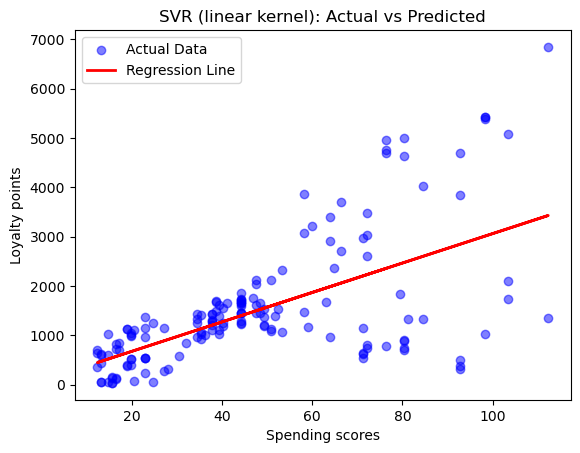

In [286]:
# Plot actual vs. predicted values
plt.scatter(X_test, y_test, color="blue", label="Actual Data", alpha=0.5)

# Regression line using predictions
plt.plot(X_test, y_pred, color="red", linewidth=2, label="Regression Line")

# Labels and title
plt.xlabel("Spending scores")
plt.ylabel("Loyalty points")
plt.title("SVR (linear kernel): Actual vs Predicted")
plt.legend()

# Get the title from the plot
plot_title = plt.gca().get_title()

# Clean the title to create a filename
clean_title = re.sub(r'[^\w\s-]', '', plot_title.replace("\n", " ")).strip().replace(' ', '_').lower()
filename = f"{clean_title}.png"

# Save the figure
plt.savefig(filename, dpi=500, bbox_inches="tight")

plt.show()

***Interpretation of the plot***: As seen in the other linear regression, this model is also poor at predicting loyalty points when spending scores are greater than about 60.

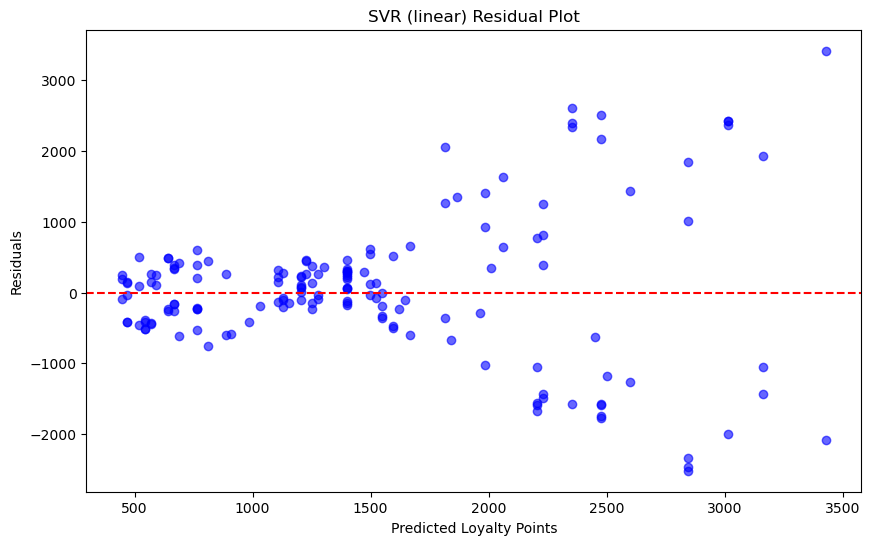

In [288]:
# Plot the residual plot to see if the residuals are randomly scattered.
residuals = y_test - y_pred
plt.figure(figsize=(10, 6))
plt.scatter(y_pred, residuals, color="blue", alpha=0.6)
plt.axhline(y=0, color="red", linestyle='--')
plt.xlabel("Predicted Loyalty Points")
plt.ylabel("Residuals")
plt.title("SVR (linear) Residual Plot")
plt.show()

***Interpretation of the plot***: Large residuals when loyalty points are higher.

***Summary of the model:***
- ***What's good about the model?***: Not a good model.
- ***What needs to be improved about the model?***: Poort R-squared and and very large errors meaning that the model is a poor fit.

***Summary of using linear regression***: Overall I have had lots of problems with heteroscedasticity, quite low R squared values, and very large residuals. I think that linear regression is not the best way to analyse this data, as predictions are unlikely to be precise enough, especially in certain ranges. Logistic regression, clustering, and decision trees may work better to understand the data.

***To view a multiple linear regression, see my R script***

#### 4. Can we predict a customers loyalty points based on their spending scores and demographics using a regression decision tree?
Business question this helps to answer: Are loyalty points an important metric that can be leveraged in future marketing activities?

##### Model used: Decision Tree Regression

As there were lots of problems with heteroscedasticity and with residuals in general, a regression decision tree might deal with the data better as it can model non-linear relationships between variables and does not assume homoscedasticity. They can also be more resistant to outliers. I do however, have to be careful of overfitting so may have to prune the decision tree, tune the hyperparameters (like max_depth and min_samples_leaf), or use ensemble methods like random forest or boosting.

In [296]:
# View the reviews_nreviews data
reviews_nreviews.head()

,customer_id,n_reviews,gender,age,income_k,spending_score,loyalty_points,education,loyalty_points_log
0,1,1,Female,17,13.94,40,233,Postgraduate,5.451038
1,2,1,Female,17,35.26,54,797,Postgraduate,6.680855
2,3,7,Female,17,53.30,48,1071,Postgraduate,6.976348
3,4,1,Female,17,69.70,26,759,Postgraduate,6.632002
4,5,1,Female,18,12.30,81,436,Graduate,6.077642


In [297]:
# Create a copy of the data frame.
reviews_dt = reviews_nreviews.copy()
reviews_dt.head()

,customer_id,n_reviews,gender,age,income_k,spending_score,loyalty_points,education,loyalty_points_log
0,1,1,Female,17,13.94,40,233,Postgraduate,5.451038
1,2,1,Female,17,35.26,54,797,Postgraduate,6.680855
2,3,7,Female,17,53.30,48,1071,Postgraduate,6.976348
3,4,1,Female,17,69.70,26,759,Postgraduate,6.632002
4,5,1,Female,18,12.30,81,436,Graduate,6.077642


In [298]:
# Drop "customer_id" column as not needed for the regression decision tree.
reviews_dt.drop(columns=["customer_id", "loyalty_points_log"], inplace=True)
reviews_dt.head()

,n_reviews,gender,age,income_k,spending_score,loyalty_points,education
0,1,Female,17,13.94,40,233,Postgraduate
1,1,Female,17,35.26,54,797,Postgraduate
2,7,Female,17,53.30,48,1071,Postgraduate
3,1,Female,17,69.70,26,759,Postgraduate
4,1,Female,18,12.30,81,436,Graduate


In [299]:
# Convert string calumns into numerical columns (create dummy variables).
# Create dummy variables for "Education" column
education_dummies = pd.get_dummies(reviews_dt["education"], prefix="education").drop(columns=["education_Not completed school"])

# Join the new columns to the DataFrame
reviews_dt = pd.concat([reviews_dt, education_dummies.astype(int)], axis=1)

# Create dummy variables for "Gender" column
gender_dummies = pd.get_dummies(reviews_dt["gender"], prefix="gender", drop_first=True)

# Join the new columns to the DataFrame
reviews_dt = pd.concat([reviews_dt, gender_dummies.astype(int)], axis=1)

# Drop the original string columns
reviews_dt.drop(["education", "gender"], axis=1, inplace=True)

# View the updated DataFrame
reviews_dt.head()

,n_reviews,age,income_k,spending_score,loyalty_points,education_Completed school,education_Graduate,education_PhD,education_Postgraduate,gender_Male
0,1,17,13.94,40,233,0,0,0,1,0
1,1,17,35.26,54,797,0,0,0,1,0
2,7,17,53.30,48,1071,0,0,0,1,0
3,1,17,69.70,26,759,0,0,0,1,0
4,1,18,12.30,81,436,0,1,0,0,0


In [300]:
# Check for nulls.
reviews_dt.isna().sum()

n_reviews                     0
age                           0
income_k                      0
spending_score                0
loyalty_points                0
education_Completed school    0
education_Graduate            0
education_PhD                 0
education_Postgraduate        0
gender_Male                   0
dtype: int64

No nulls

In [302]:
# Define features (X) and target variable (y).
X = reviews_dt.drop("loyalty_points", axis=1)
y = reviews_dt["loyalty_points"]
X

,n_reviews,age,income_k,spending_score,education_Completed school,education_Graduate,education_PhD,education_Postgraduate,gender_Male
0,1,17,13.94,40,0,0,0,1,0
1,1,17,35.26,54,0,0,0,1,0
2,7,17,53.30,48,0,0,0,1,0
3,1,17,69.70,26,0,0,0,1,0
4,1,18,12.30,81,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...
777,7,72,37.72,56,0,0,0,1,1
778,1,72,39.36,47,0,0,1,0,1
779,7,72,40.18,55,0,0,1,0,1
780,1,72,66.42,93,0,0,1,0,1


In [303]:
# Get feature_cols
feature_cols = [c for c in X.columns]
feature_cols

['n_reviews',
 'age',
 'income_k',
 'spending_score',
 'education_Completed school',
 'education_Graduate',
 'education_PhD',
 'education_Postgraduate',
 'gender_Male']

In [304]:
# Split the data using train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [305]:
# Create Decision Tree Regressor object
dtr = DecisionTreeRegressor(random_state=42)

# Train Decision Tree Regressor
dtr.fit(X_train, y_train)

# Predict loyalty points on test data
y_pred = dtr.predict(X_test)

In [306]:
# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Error: {mae}")
print(f"R-squared: {r2}")
print(f"Root Mean Squared Error: {rmse}")

Mean Squared Error: 43472.93630573248
Mean Absolute Error: 117.72611464968153
R-squared: 0.9738134819009635
Root Mean Squared Error: 208.5016458106086


R squared is very good! Although this could be too good - overfitting?
RMSE is better than for the other regression models! Remember that loyalty points have a range of over 6000 so while RMSE over 200 isn't good, it's a lot better than the other models.

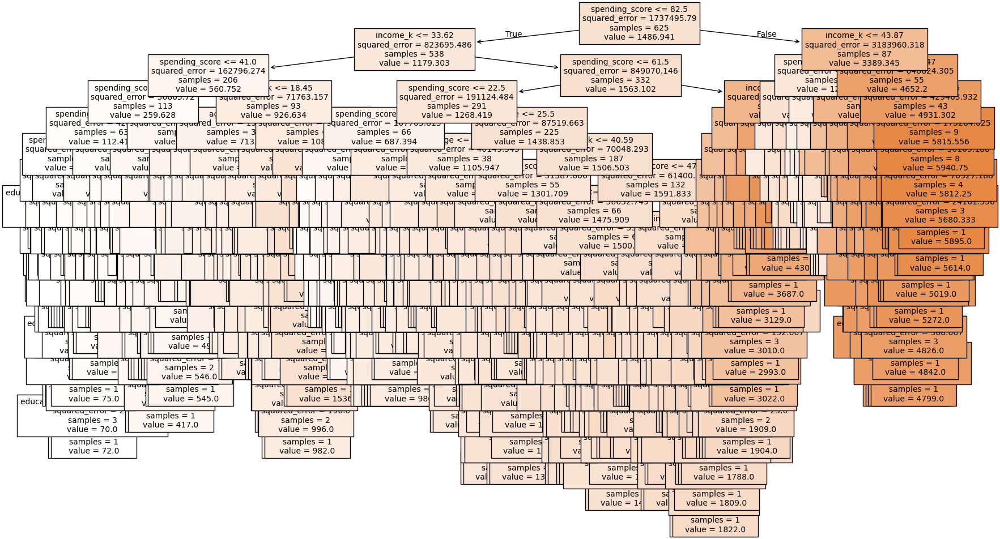

In [308]:
# Visualize the decision tree

plt.figure(figsize=(20, 12))
plot_tree(dtr, feature_names=feature_cols, filled=True, fontsize=10)
plt.show()

***Interpretation of the plot***: Can't interpret!

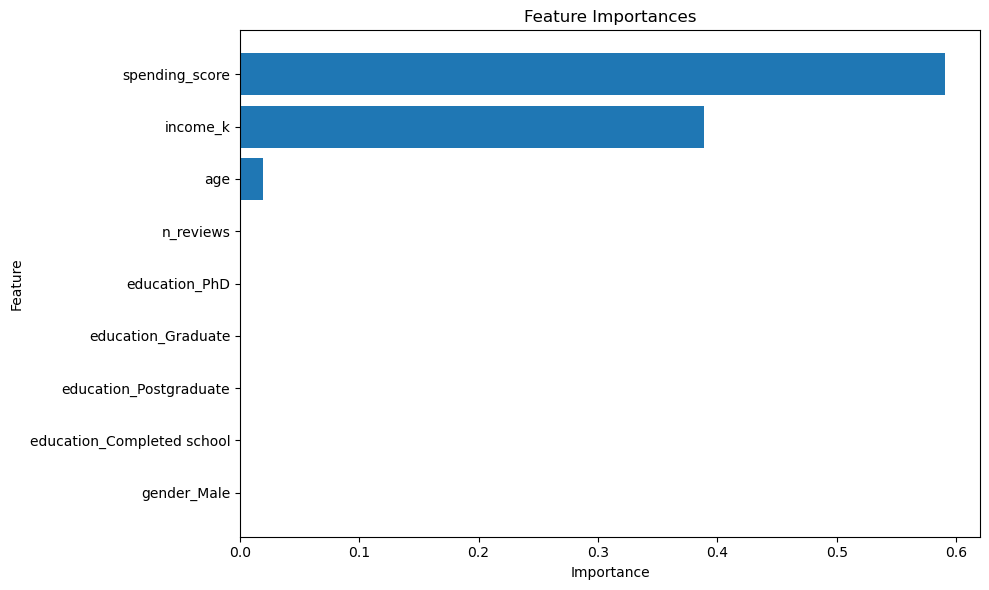

In [310]:
# Extract feature importances
feature_importances = dtr.feature_importances_

#Create a DataFrame to display feature importances
feature_importance_df = pd.DataFrame({'Feature': feature_cols, 'Importance': feature_importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=True)

#Plot feature importances
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importances')
plt.tight_layout()
plt.show()

***Interpretation of the plot***: Here I can see that most features are not important/have little importance. Age, income and spending scores are the only features with signifcant importance. I'm going to remove the unimportant features and run the model again.

In [312]:
# Define features (X) and target variable (y).
X = reviews_dt[["spending_score", "age", "income_k"]]
y = reviews_dt["loyalty_points"] 
X

,spending_score,age,income_k
0,40,17,13.94
1,54,17,35.26
2,48,17,53.30
3,26,17,69.70
4,81,18,12.30
...,...,...,...
777,56,72,37.72
778,47,72,39.36
779,55,72,40.18
780,93,72,66.42


In [313]:
# Get feature_cols
feature_cols = [c for c in X.columns]
feature_cols

['spending_score', 'age', 'income_k']

In [314]:
# Split the data using train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [315]:
# Create Decision Tree Regressor object
dtr2 = DecisionTreeRegressor(random_state=42)

# Train Decision Tree Regressor
dtr2.fit(X_train, y_train)

# Predict loyalty points on test data
y_pred = dtr2.predict(X_test)

In [316]:
# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Error: {mae}")
print(f"R-squared: {r2}")
print(f"Root Mean Squared Error: {rmse}")

Mean Squared Error: 31503.28025477707
Mean Absolute Error: 92.18471337579618
R-squared: 0.9810235680247356
Root Mean Squared Error: 177.49163432335922


R squared is very good but very close to 1 - overfitting?
RMSE is the lowest out of all regression models created so far.

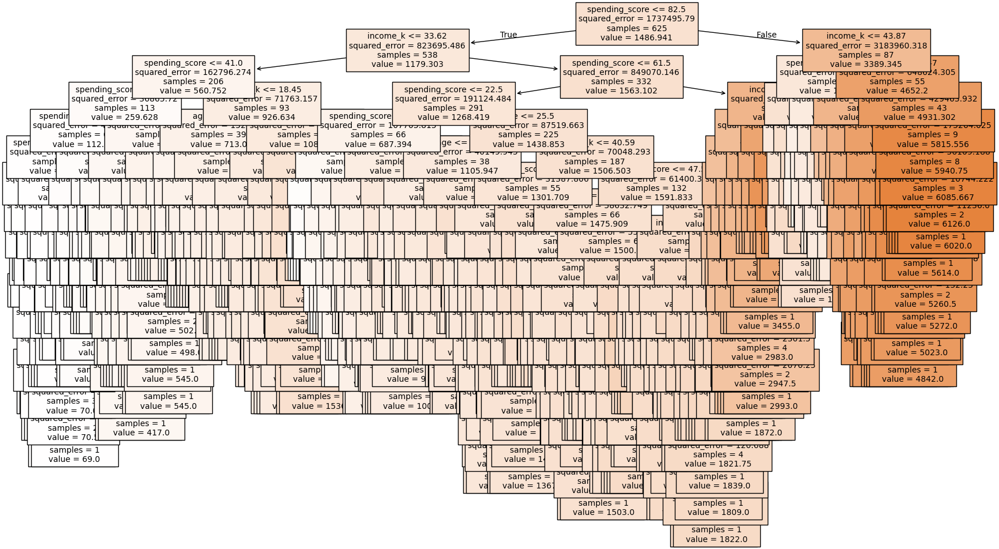

In [318]:
# Visualize the decision tree

plt.figure(figsize=(20, 12))
plot_tree(dtr2, feature_names=feature_cols, filled=True, fontsize=10)
plt.show()

***Interpretation of the plot***: Still can't interpret!

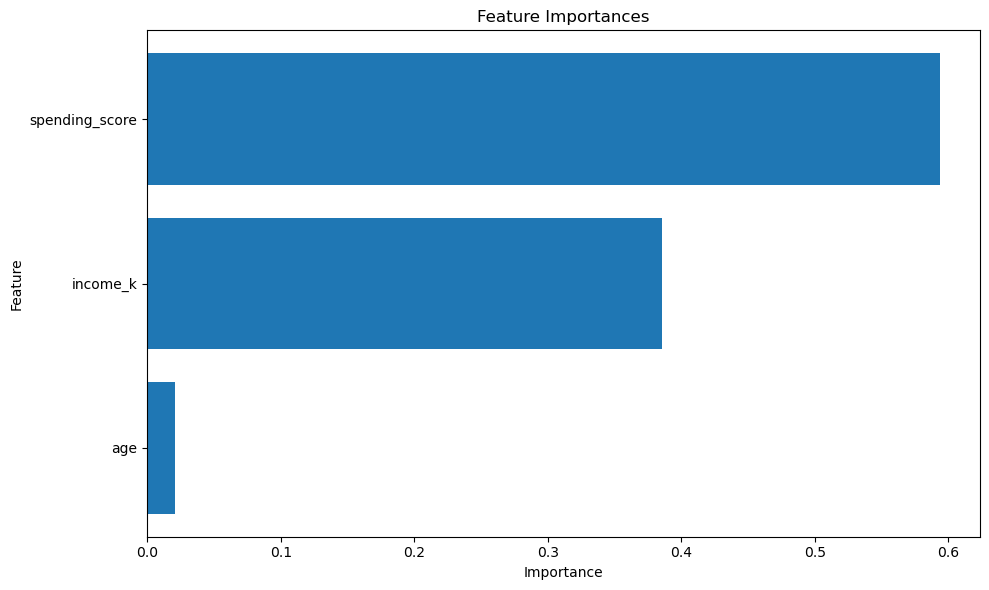

In [320]:
# Extract feature importances
feature_importances = dtr2.feature_importances_

#Create a DataFrame to display feature importances
feature_importance_df = pd.DataFrame({'Feature': feature_cols, 'Importance': feature_importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=True)

#Plot feature importances
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importances')
plt.tight_layout()
plt.show()

***Interpretation of the plot***: Income and spending scores are the most important features in determining the loyalty points value and age is slightly important.

In [322]:
# View these so I can see the actual values.
feature_importances

array([0.59390321, 0.02062761, 0.38546917])

Note that feature importance are on a range of 0 to 1 so age has very little important, income has some importance, and spending scores have a reasonably good importance.

As the decision tree is unreadable and as I suspect that the decision tree is overfitting the data (very large R squared), I'm going to tune the hyperparameters.\
To reduce overfitting and create a simpler tree, I'll use moderate values:\
***max_depth=10***\
***min_samples_leaf=5***\
***min_samples_split=10***

In [325]:
# Create Decision Tree Regressor object
dtr_hp = DecisionTreeRegressor(max_depth=10, min_samples_leaf=5, min_samples_split=10, random_state=42)

# Train Decision Tree Regressor
dtr_hp.fit(X_train, y_train)

# Predict loyalty points on test data
y_pred = dtr_hp.predict(X_test)

In [326]:
# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Error: {mae}")
print(f"R-squared: {r2}")
print(f"Root Mean Squared Error: {rmse}")

Mean Squared Error: 77044.55081045568
Mean Absolute Error: 144.08530492246913
R-squared: 0.9535911604856538
Root Mean Squared Error: 277.5690018904411


R squared as decreased but still very good.\
RMSE has increased but is ok.

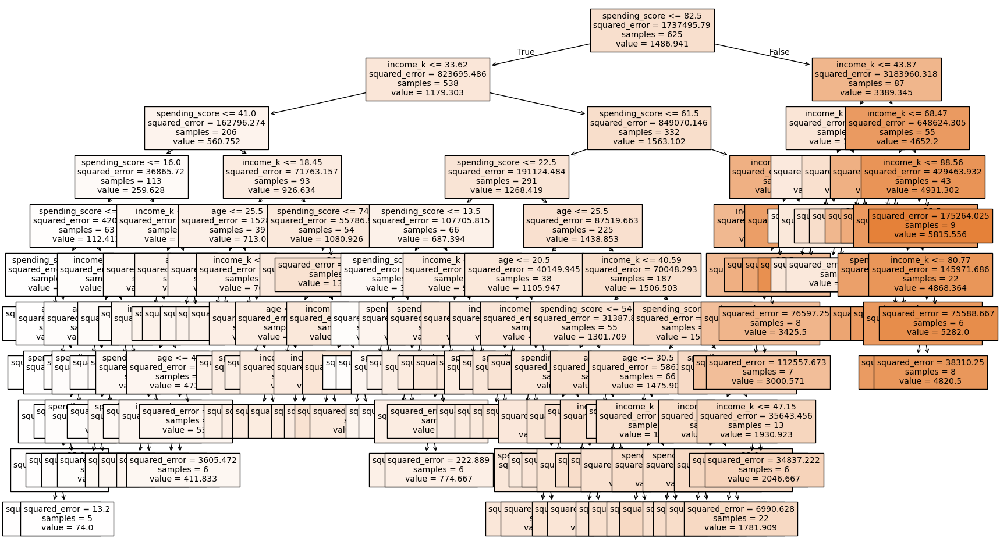

In [328]:
# Visualize the decision tree

plt.figure(figsize=(20, 12))
plot_tree(dtr_hp, feature_names=feature_cols, filled=True, fontsize=10)
plt.show()

***Interpretation of the plot***: There's still a high R squared and the decision tree is still not very readable. I'm going to limit the ***max depth to 5*** and see what the results are.

In [330]:
# Create Decision Tree Regressor object
dtr_hp2 = DecisionTreeRegressor(max_depth=5, min_samples_leaf=5, min_samples_split=10, random_state=42)

# Train Decision Tree Regressor
dtr_hp2.fit(X_train, y_train)

# Predict loyalty points on test data
y_pred = dtr_hp2.predict(X_test)

In [331]:
# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Error: {mae}")
print(f"R-squared: {r2}")
print(f"Root Mean Squared Error: {rmse}")

Mean Squared Error: 99973.21464761972
Mean Absolute Error: 197.3316243615872
R-squared: 0.939779766050826
Root Mean Squared Error: 316.18541181974183


As I reduce the max depth, the RMSE gets higher and the R squared gets lower.

I'm reducing the fontsize to 7 and changed the figsize so that the decision tree is more likely to fit on the page.

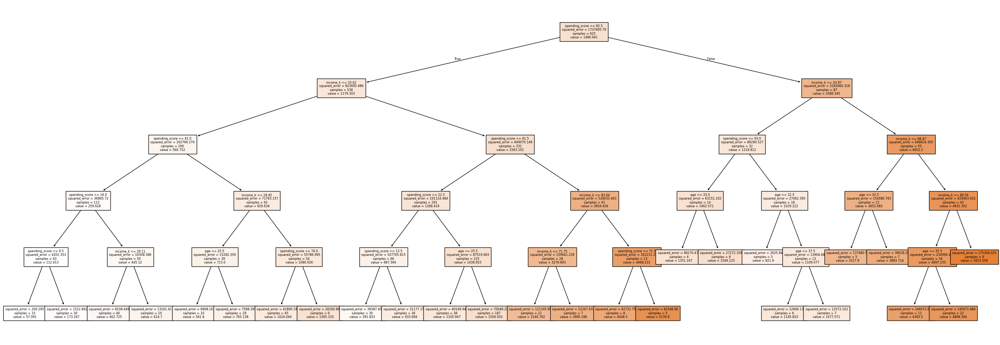

In [334]:
# Visualize the decision tree

plt.figure(figsize=(35, 12))
plot_tree(dtr_hp2, feature_names=feature_cols, filled=True, fontsize=6)

# Save the fig so that I can zoom in.
plt.savefig("decision_tree.png", format="png", dpi=300, bbox_inches="tight")

plt.show()

 ***Interpretation of the plot***: Note that the darker colours mean that the average loyalty points are higher.

Key results: The highest average number of loyalty points is with customers with a spending score of more than 82.5 and an income of more than 88.56k with average loyalty points of 5815.556. Of those with an income greater than 43.87k,  average loyalty points are least 3327.8. Also, those with a spending score between 61.5 and 82.5 have higher average loyalty points (at least 3140.762), with those with an income greater than 83.64k and a spending score between 71.5 and 82.5, having average loyalty points of 5139.8

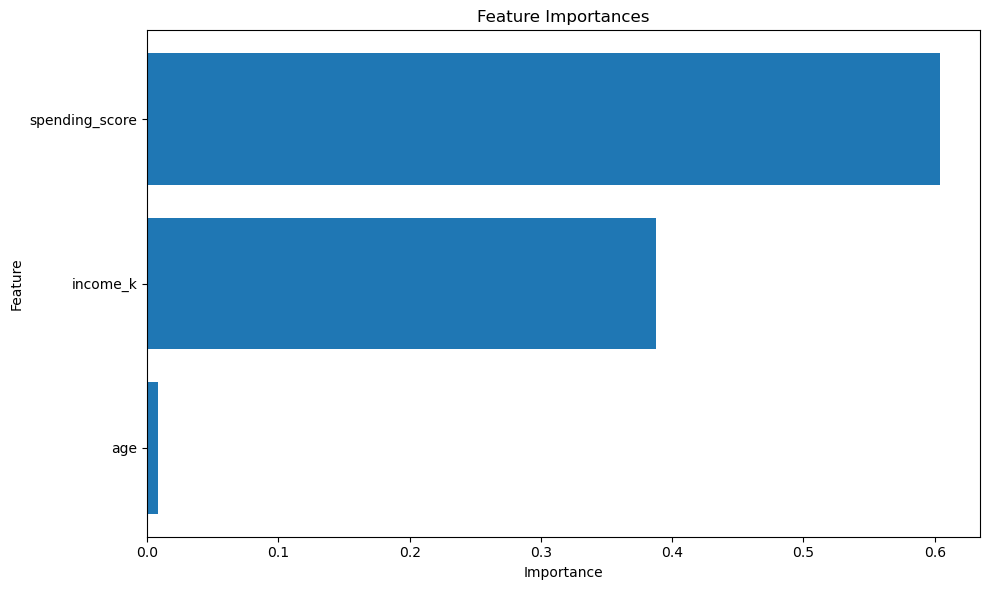

In [336]:
# Extract feature importances
feature_importances = dtr_hp2.feature_importances_

#Create a DataFrame to display feature importances
feature_importance_df = pd.DataFrame({'Feature': feature_cols, 'Importance': feature_importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=True)

#Plot feature importances
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importances')
plt.tight_layout()
plt.show()

***Interpretation of the plot***: Same as above.

In [338]:
feature_importances

array([0.60424804, 0.00811813, 0.38763383])

These feature importances have changed, but only slightly.

***Summary of the model:***
- ***What's good about the model?***: The last iteration of this model (pruned) is easily interpretable for the stakeholder and provides us with key insights. The R-squared is good but not extremely high (0.93) and the RMSE is 316.19 which is much lower than we saw with the linear regression models.
- ***What needs to be improved about the model?***: The R-squared is still perhaps still too high so there might be some overfitting. To see if overfitting can be reduced, I'm going to use ensemble methods: Random Forest and Gradient Boosting.

##### Model used: Random Forest

To reduce the chances of overfitting, I'm going to use a Random Forest regressor. I will use moderate hyperparameter.\
***n_estimators=100***\
***max_depth=5***\
***min_samples_split=10***\
***min_samples_leaf=10***

In [343]:
# Create a Random Forest Regressor
rf = RandomForestRegressor(n_estimators=100, max_depth=5, min_samples_split=10, min_samples_leaf=10, random_state=42)

# Train the model
rf.fit(X_train, y_train)

# Predict loyalty points on test data
y_pred = rf.predict(X_test)

In [344]:
# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Error: {mae}")
print(f"R-squared: {r2}")
print(f"Root Mean Squared Error: {rmse}")

Mean Squared Error: 107819.89768906962
Mean Absolute Error: 184.40234349704522
R-squared: 0.935053209141091
Root Mean Squared Error: 328.35940322925063


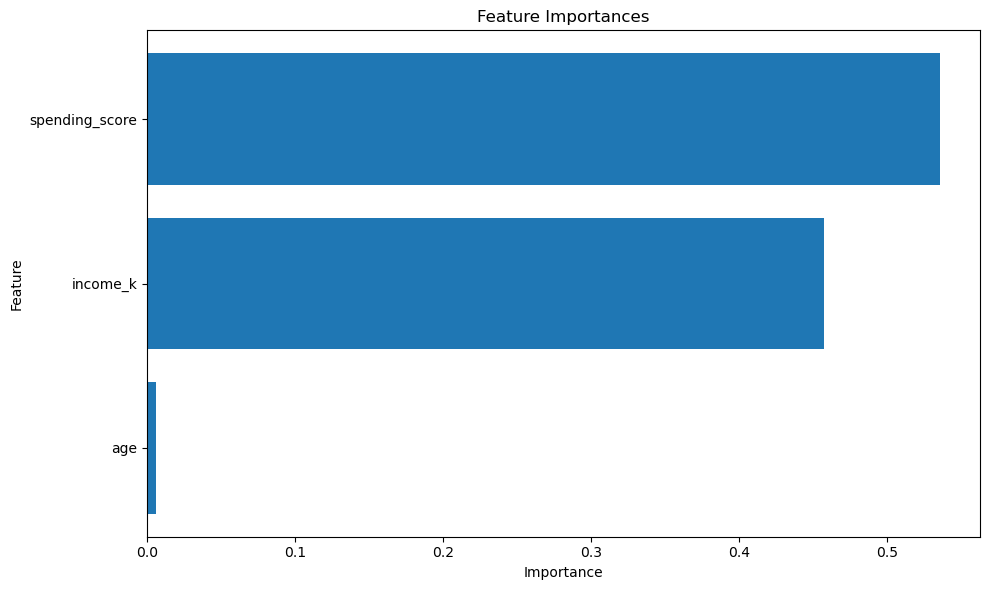

In [345]:
# Extract feature importances
feature_importances = rf.feature_importances_

#Create a DataFrame to display feature importances
feature_importance_df = pd.DataFrame({'Feature': feature_cols, 'Importance': feature_importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=True)

#Plot feature importances
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importances')
plt.tight_layout()
plt.show()

***Interpretation of the plot***: Similar to the decision tree results but slightly lower.

In [347]:
# Print feature importances.
feature_importances

array([0.5362173 , 0.00616603, 0.45761667])

I can't visualise the random forest as it would be unreadable. This is the advantage of the decision tree.

***Summary of the model:***
- ***What's good about the model?***: The R-squared is 0.94 which is good but...
- ***What needs to be improved about the model?***: ...the R-squared could actually be indicating more overfitting than for the final decision model . The RMSE has also increased slightly as well from 316.19 with the decision trees to 328.36 using Random Forest. As there can't be a visualisation of the Random Forest model, and we don't appear to have necessarily reduced potential overfitting, the decision tree model is likely better.

##### Model used: Gradient Boosting

Too see whether I can reduce the errors more, I'm going to try Gradient Boosting. However, this model is more complex, slower to train, and can be prone to overfitting. I will tune the hyperparameter to try to prevent overfitting. I'm going to use moderate hyperparameters that have a balance between reducing overfitting and underfitting, a moderate training time, and a balance between being too simple and too complex.

In [352]:
# Create a Gradient Boosting Regressor
gbr = GradientBoostingRegressor(n_estimators=100, learning_rate=0.01, max_depth=5, random_state=42)

# Train the model
gbr.fit(X_train, y_train)

# Make predictions on test data
y_pred = gbr.predict(X_test)

In [353]:
# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Error: {mae}")
print(f"R-squared: {r2}")
print(f"Root Mean Squared Error: {rmse}")

Mean Squared Error: 266867.8710867049
Mean Absolute Error: 354.7721939171841
R-squared: 0.839248485836881
Root Mean Squared Error: 516.5925581023258


This is actually the lowest R squared and the highest RMSE of the tree models. I'm going to tune the hyperparameters again to reduce error. I'm increasing the n_estimators to get better accuracy without increasing the chance of overfitting too much, decreasing the learning_rate which means less likelihood of overfitting, and increasing the max_depth slightly so that the model can capture more complex patterns.

In [355]:
# Create a Gradient Boosting Regressor
gbr2 = GradientBoostingRegressor(n_estimators=150, learning_rate=0.005, max_depth=6, random_state=42)

# Train the model
gbr2.fit(X_train, y_train)

# Make predictions on test data
y_pred = gbr2.predict(X_test)

In [356]:
# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Error: {mae}")
print(f"R-squared: {r2}")
print(f"Root Mean Squared Error: {rmse}")

Mean Squared Error: 398260.33618275344
Mean Absolute Error: 431.7589891011465
R-squared: 0.7601024364162214
Root Mean Squared Error: 631.0787083896536


This has made it worse! I'm not going to use the Gradient Boosting model.

***Summary of the model:***
- ***What's good about the model?***: Lower R-squared (0.84) so maybe less overfitting.
- ***What needs to be improved about the model?***: The errors have doubled from the decision tree and random forest models so this model is not as good as predicting loyalty points by a significant amount.

#### 5. Which variables are significant predictors of loyalty points?

##### Model used: Multinomial logistic regression

I considered doing binary logistic regression by segmenting loyalty_points into high and low. However, I think this might oversimplify loyalty points to much as the margin between "high" and "low" is probably going to be very small. Therefore, I have decided to use multinomial logsitic regression so that I can add more categories. I'm going to segment loyalty points into "high" (2), "medium" (1), and "low" (0).\
First, I'm going to view the loyalty points info again and show the histogram created earlier in the notebook so that I can decide where to split the data.


In [362]:
# Remove the "loyalty_points_log" column.
reviews_nreviews = reviews_nreviews.drop("loyalty_points_log", axis=1)
reviews_nreviews.head(1)

,customer_id,n_reviews,gender,age,income_k,spending_score,loyalty_points,education
0,1,1,Female,17,13.94,40,233,Postgraduate


In [363]:
# View info about the "loyalty_points" column.
reviews_nreviews["loyalty_points"].describe()

count     782.000000
mean     1497.404092
std      1313.241715
min        25.000000
25%       701.000000
50%      1187.000000
75%      1658.000000
max      6847.000000
Name: loyalty_points, dtype: float64

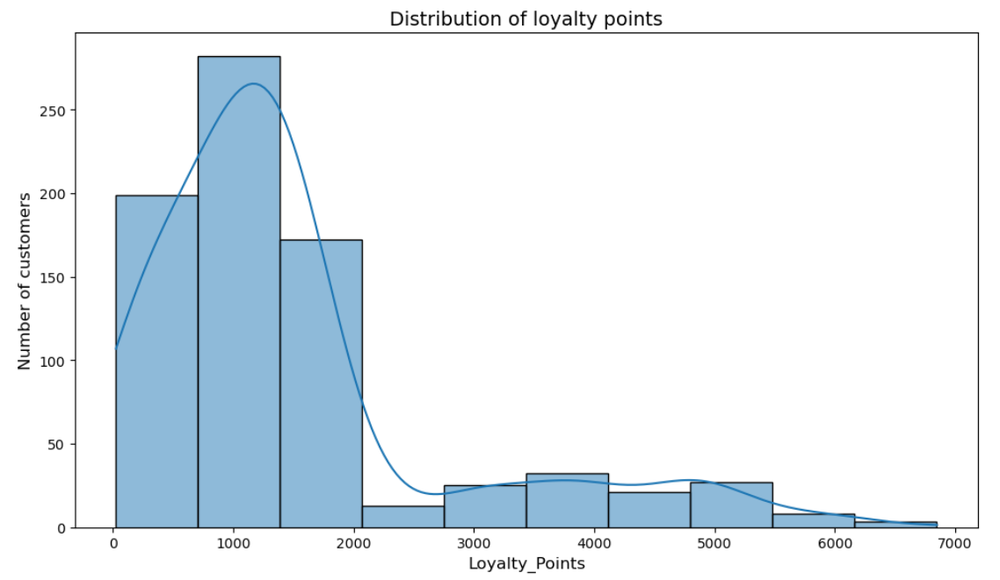

***Interpretation of the plot***: Looking at this, 75% of customers have up to 1658 loyalty points although the maximum number of loyalty points is 6847. At first, I was thinking that I would say that up to the first quartile would be classed as "low", in between the first and third quartiles as "medium", and above the third quartile as "high". However, 1658 does not seem like a high number of loyalty points. If I could speak to the stakeholder, I would speak to them here about what they feel are "high" and "low" loyalty point values. However, as I can't do this, I'm going to take the top 10% of loyalty points as "high", the bottom 25% as "low", and the rest as "medium". This will mean I will have a very unbalanced data set so I will have to balance the data.

In [366]:
# Loyalty points score at the 90th percentile.
top_10_percent_threshold = reviews_customer["loyalty_points"].quantile(0.90)
print("Top 10% Loyalty Points Threshold:", top_10_percent_threshold)

Top 10% Loyalty Points Threshold: 3694.2


In [367]:
# Convert loyalty points into a numerical variable. High loyalty = 2    Medium loyalty = 1   Low loyalty = 0
# Calculate thresholds
q1 = reviews_nreviews["loyalty_points"].quantile(0.25)  # First quartile (25th percentile)
q90 = reviews_nreviews["loyalty_points"].quantile(0.90)  # 90th percentile

# Assign loyalty levels
reviews_nreviews["loyalty_level"] = np.where(
    reviews_nreviews["loyalty_points"] <= q1, 0, 
    np.where(reviews_nreviews["loyalty_points"] > q90, 2, 1))

# View reviews_nreviews
reviews_nreviews.head()

,customer_id,n_reviews,gender,age,income_k,spending_score,loyalty_points,education,loyalty_level
0,1,1,Female,17,13.94,40,233,Postgraduate,0
1,2,1,Female,17,35.26,54,797,Postgraduate,1
2,3,7,Female,17,53.30,48,1071,Postgraduate,1
3,4,1,Female,17,69.70,26,759,Postgraduate,1
4,5,1,Female,18,12.30,81,436,Graduate,0


In [368]:
# Create dummy variables for the "Education" and "Gender" columns to convert strings to numbers.
# Create dummy variables for "Education" column
education_dummies = pd.get_dummies(reviews_nreviews["education"], prefix="education").drop(columns=["education_Not completed school"])


# Join the new columns to the DataFrame
reviews_nreviews = pd.concat([reviews_nreviews, education_dummies.astype(int)], axis=1)

# Create dummy variables for "Gender" column
gender_dummies = pd.get_dummies(reviews_nreviews["gender"], prefix="gender", drop_first=True)

# Join the new columns to the DataFrame
reviews_nreviews = pd.concat([reviews_nreviews, gender_dummies.astype(int)], axis=1)

# Drop the original string columns
reviews_nreviews.drop(["education", "gender"], axis=1, inplace=True)

# View the updated DataFrame
reviews_nreviews.head()

,customer_id,n_reviews,age,income_k,spending_score,loyalty_points,loyalty_level,education_Completed school,education_Graduate,education_PhD,education_Postgraduate,gender_Male
0,1,1,17,13.94,40,233,0,0,0,0,1,0
1,2,1,17,35.26,54,797,1,0,0,0,1,0
2,3,7,17,53.30,48,1071,1,0,0,0,1,0
3,4,1,17,69.70,26,759,1,0,0,0,1,0
4,5,1,18,12.30,81,436,0,0,1,0,0,0


Test for multicollinearity using VIF.

In [370]:
# Set the variables.
X = reviews_nreviews.drop("loyalty_level", axis = 1)
y = reviews_nreviews["loyalty_level"]

# Create a VIF dataframe.
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
  
# Calculate VIF for each feature.
vif_data["VIF"] = [variance_inflation_factor(X.values, i)
                          for i in range(len(X.columns))]

# View the DataFrame.
vif_data.sort_values("VIF",ascending=True)

,feature,VIF
1,n_reviews,1.943009
6,education_Completed school,2.833601
9,education_Postgraduate,4.801009
8,education_PhD,5.560594
7,education_Graduate,9.083796
3,income_k,10.964706
5,loyalty_points,11.080099
4,spending_score,12.465987
10,gender_Male,45.929857
2,age,76.668458


There are several features here with a high multicollinearity (greater than 10) so I'm going to drop "customer_id", "loyalty_points", and "age" (as loyalty points is not needed anyway as we have loyalty_level) and then check for multicollinearity again.

In [372]:
# Drop "customer_id" and "loyalty_points" columns.
reviews_nreviews2 = reviews_nreviews.drop(columns=["customer_id", "loyalty_points", "age"])

In [373]:
# Set the variables.
X = reviews_nreviews2.drop("loyalty_level", axis = 1)
y = reviews_nreviews2["loyalty_level"]

# Create a VIF dataframe.
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
  
# Calculate VIF for each feature.
vif_data["VIF"] = [variance_inflation_factor(X.values, i)
                          for i in range(len(X.columns))]

# View the DataFrame.
vif_data.sort_values("VIF",ascending=True)

,feature,VIF
3,education_Completed school,1.526394
7,gender_Male,1.767597
0,n_reviews,1.936006
6,education_Postgraduate,2.328128
5,education_PhD,2.663532
4,education_Graduate,3.968314
1,income_k,4.014398
2,spending_score,4.258327


Most have little multicollinearity. "Age" has a little more, but it's still significantly below 10 so I'm going to keep it in.

I'm now going to ***balance*** the data so that the model is trained equally on each of the loyalty_level values.

In [376]:
# Determine whether values in the "loyalty_level" column are balanced.
reviews_nreviews2["loyalty_level"].value_counts()  

loyalty_level
1    506
0    197
2     79
Name: count, dtype: int64

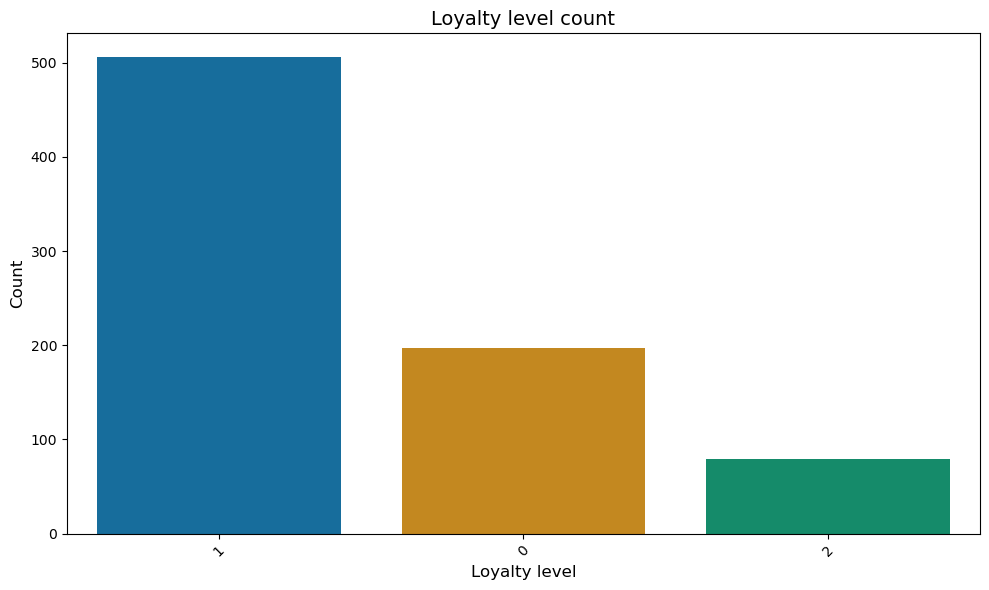

In [377]:
# Create a visualisation for this as well.
count_plot(reviews_nreviews2, "loyalty_level", title="Loyalty level count", xlabel="Loyalty level", ylabel="Count")

***Interpretation of the plot***: The data is very unbalanced so it needs to be balanced.

In [379]:
# Apply SMOTE class as the target variable is not balanced.
os = SMOTE(random_state=0)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Balance the training data.
os_data_X, os_data_y = os.fit_resample(X_train, y_train)  

# Create two DataFrames for X and one for y:
os_data_X = pd.DataFrame(data = os_data_X, columns = X.columns) 
os_data_y = pd.DataFrame(data = os_data_y, columns = ["loyalty_level"])

# View DataFrame.
print(os_data_X.head())
os_data_y.head()

   n_reviews  income_k  spending_score  education_Completed school  \
0          1     40.18              42                           0   
1          1     46.74              55                           0   
2          1     44.28              52                           0   
3          1    103.32              74                           0   
4          1     44.28              54                           0   

   education_Graduate  education_PhD  education_Postgraduate  gender_Male  
0                   0              0                       1            0  
1                   1              0                       0            0  
2                   1              0                       0            0  
3                   0              1                       0            0  
4                   0              1                       0            1  


,loyalty_level
0,1
1,1
2,1
3,2
4,1


Verify whether the data is balanced.

In [381]:
# Determine whether values in a column are balanced by counting the values.
os_data_y["loyalty_level"].value_counts()

loyalty_level
1    404
2    404
0    404
Name: count, dtype: int64

Yes, the data is balanced.

In [383]:
# Standardize features using StandardScaler
scaler = StandardScaler()

# Add the X_train data set to the 'scaler' function.
scaler.fit(os_data_X)

# Specify X_train data set.
X_train = scaler.transform(os_data_X) 

# Specify X_test data set. 
X_test = scaler.transform(X_test)

# Define the MLR model, and set predictions and parameters.
MLR = LogisticRegression(random_state=0, 
                         multi_class='multinomial', 
                         penalty='l2', 
                         solver='newton-cg').fit(X_train, os_data_y)

# Set the predictions equal to the 'MLR' function and 
# specify the DataFrame.
preds = MLR.predict(X_test) 

# Set the parameters equal to the DataFrame and 
# add the 'get_params' function. 
params = MLR.get_params() 

# Print the parameters, intercept, and coefficients.
print(params)  
print("Intercept: \n", MLR.intercept_)
print("Coefficients: \n", MLR.coef_)

{'C': 1.0, 'class_weight': None, 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 100, 'multi_class': 'multinomial', 'n_jobs': None, 'penalty': 'l2', 'random_state': 0, 'solver': 'newton-cg', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}
Intercept: 
 [-0.14241033  2.15264138 -2.01023105]
Coefficients: 
 [[ 0.02766729 -3.44102044 -3.6627988  -0.32190702 -0.22902153 -0.31076499
  -0.34264296 -0.12492284]
 [ 0.15471575 -0.36491534 -0.20038332  0.46082956  0.7467354   0.7719891
   0.7742398   0.13481792]
 [-0.18238303  3.80593579  3.86318213 -0.13892255 -0.51771388 -0.46122411
  -0.43159685 -0.00989508]]


Notes: I started off with "penalty=None" but I was getting some very large coefficient values suggesting that the model was unstable. To fix this, I added used the Standard Scaler instead, as well as adding a penalty.

In [385]:
# Convert coefficients to odds ratios
odds_ratios = np.exp(MLR.coef_)

# Convert to a DataFrame and rename columns (adjusting based on the number of classes)
odds_ratios_df = pd.DataFrame(odds_ratios, columns=os_data_X.columns)

# Format the DataFrame to avoid scientific notation (set to 4 decimal places)
odds_ratios_df = odds_ratios_df.applymap(lambda x: f"{x:.4f}")

# Print the odds ratios
print(odds_ratios_df)

  n_reviews income_k spending_score education_Completed school  \
0    1.0281   0.0320         0.0257                     0.7248   
1    1.1673   0.6943         0.8184                     1.5854   
2    0.8333  44.9673        47.6166                     0.8703   

  education_Graduate education_PhD education_Postgraduate gender_Male  
0             0.7953        0.7329                 0.7099      0.8826  
1             2.1101        2.1641                 2.1689      1.1443  
2             0.5959        0.6305                 0.6495      0.9902  


In [386]:
# Calculate feature importance.
# Extract feature names (assuming X_train was a DataFrame before scaling)
feature_names = os_data_X.columns

# Get the absolute values of coefficients
coefs = MLR.coef_

# Convert coefficients into odds ratios
odds_ratios = np.exp(coefs)

# Create a DataFrame for feature importance
feature_importance_df = pd.DataFrame(
    odds_ratios.T, 
    index=feature_names, 
    columns=["Medium vs Low", "High vs Medium", "High vs Low"])

# Sort features by importance for better visualization
feature_importance_df["Mean Importance"] = feature_importance_df.mean(axis=1)
feature_importance_df = feature_importance_df.sort_values(by="Mean Importance", ascending=False)

# Display feature importance
print(feature_importance_df)

                            Medium vs Low  High vs Medium  High vs Low  \
spending_score                   0.025661        0.818417    47.616633   
income_k                         0.032032        0.694255    44.967310   
education_Postgraduate           0.709892        2.168943     0.649471   
education_PhD                    0.732886        2.164067     0.630511   
education_Graduate               0.795311        2.110100     0.595881   
education_Completed school       0.724766        1.585389     0.870295   
n_reviews                        1.028054        1.167326     0.833282   
gender_Male                      0.882565        1.144328     0.990154   

                            Mean Importance  
spending_score                    16.153570  
income_k                          15.231199  
education_Postgraduate             1.176102  
education_PhD                      1.175821  
education_Graduate                 1.167098  
education_Completed school         1.060150  
n_reviews  

***Interpretation of odds ratios:***
-	Having a higher income strongly increases the odds of being in the high loyalty category over low.
-	Having a higher spending score strongly increases the odds of being in the high loyalty category over low.
-	Graduates, Postgraduates, and PhD’s approximately double the odds of being in the high loyalty category over the medium loyalty category over someone who didn’t complete school. For those who completed school, they 1.5 X the odds.
-	Those who are male, are slightly more likely to be in the high loyalty category than the medium loyalty category than females.
-	However, all education levels are less likely to be in the high loyalty category vs the low loyalty category vs those who didn’t complete school. However, remember not many people who didn’t complete school.

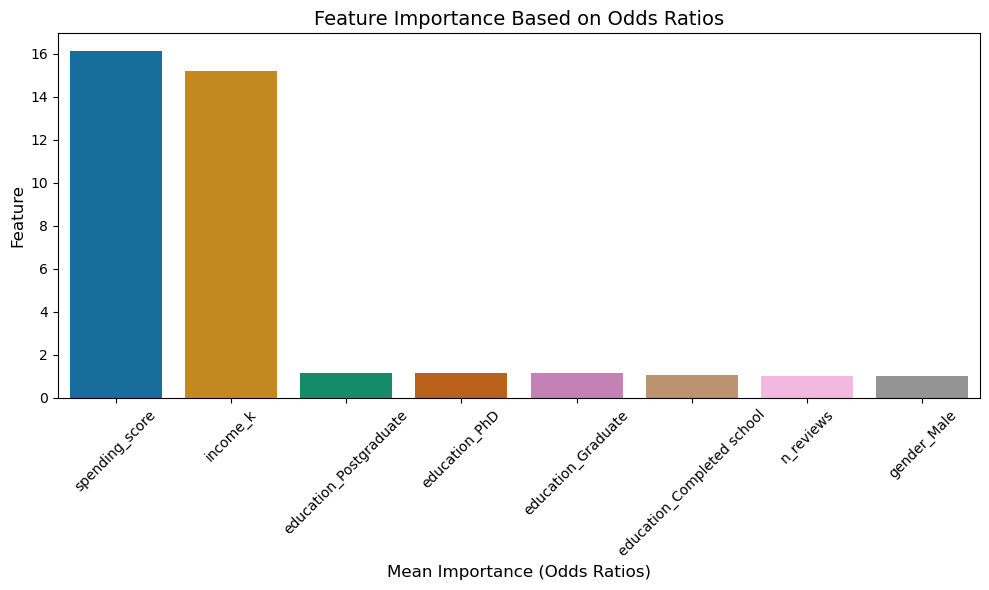

In [388]:
# Create bar plot for "Mean importance" column.

horizontal_bar_plot(df=feature_importance_df, x_column="Mean Importance", y_column=feature_importance_df.index, 
                    title="Feature Importance Based on Odds Ratios", xlabel="Mean Importance (Odds Ratios)",
                    ylabel="Feature")

***Interpretation of the plot***: Spending score and income the most important features in this model.

In [390]:
# Generate predictions on X_test
y_pred = MLR.predict(X_test)

# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Create and print a confusion matrix:
# y_test as the first argument and the predictions as the second argument. 
confusion_matrix(y_test, y_pred)

# Transform confusion matrix into an array.
cmatrix = np.array(confusion_matrix(y_test, y_pred))

# Create the DataFrame from cmatrix array. 
pd.DataFrame(cmatrix, index=["actual_low", "actual_medium", "actual_high"],
columns=["predicted_low", "predicted_medium", "predicted_high"])

,predicted_low,predicted_medium,predicted_high
actual_low,30,9,0
actual_medium,6,96,0
actual_high,0,1,15


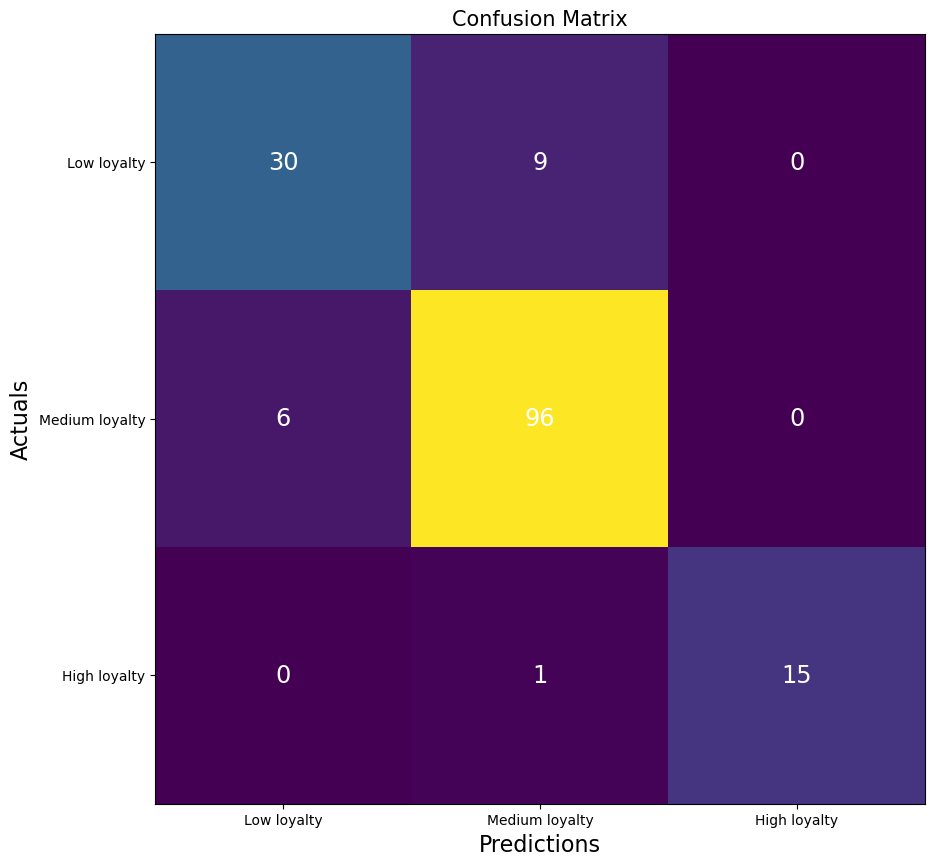

In [391]:
# Create visualisation for the confusion matrix.
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(cm)
ax.grid(False)
ax.xaxis.set(ticks=(0, 1, 2),
             ticklabels=("Low loyalty", "Medium loyalty", "High loyalty"))
ax.yaxis.set(ticks=(0, 1, 2),
             ticklabels=("Low loyalty", "Medium loyalty", "High loyalty"))

# ax.set_ylim(1.5, -0.5)
for i in range(3):
    for j in range(3):
        ax.text(j, i, cm[i, j],
                ha='center',
                va='center',
                color='white',
                size='xx-large')
        
# Set the labels.
plt.xlabel("Predictions", fontsize=16)
plt.ylabel("Actuals", fontsize=16)
plt.title("Confusion Matrix", fontsize=15)

plt.savefig("confusion_matrix.png", dpi=500, bbox_inches="tight")

plt.show()

***Interpretation of confusion matrix***:
If we predict low loyalty: 30/36 = predicts with 83.3% accuracy
If we predict medium loyalty: 96/106 = predicts with 90.6% accuracy
If we predict high loyalty: 15/15 = predicts 100% accuracy

These are good accuracy scores.

In [393]:
# Determine accuracy statistics.
print("Accuracy score:", metrics.accuracy_score(y_test, y_pred))  

# Create a classification report.
class_report=classification_report(y_test, y_pred)

print(class_report)

Accuracy score: 0.8980891719745223
              precision    recall  f1-score   support

           0       0.83      0.77      0.80        39
           1       0.91      0.94      0.92       102
           2       1.00      0.94      0.97        16

    accuracy                           0.90       157
   macro avg       0.91      0.88      0.90       157
weighted avg       0.90      0.90      0.90       157



This is very good accuracy, suggesting that using multinomial logistic regression is a better for predicting loyalty points than linear regression (although this classifies customers into loyalty category).

Overall accuracy is 90% but the precision for high loyalty is very high so the model might be overfitting.

***Summary of the model:***
- ***What's good about the model?***: Good accuracy with few false positive and false negatives. Precision and recall is good.
- ***What needs to be improved about the model?***: Perhaps the precision for the high loyalty group is too accurate so the model might be overfitting.

#### 6. Can we predict a customers loyalty level based on their spending scores and demographics using a classification decision tree?

##### Model used: Decision Tree

In [398]:
# Set the variables.
X = reviews_nreviews.drop(columns=["loyalty_level", "customer_id", "loyalty_points"])
y = reviews_nreviews["loyalty_level"]

In [399]:
# Apply SMOTE class as the target variable is not balanced.
os = SMOTE(random_state=0)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Balance the training data.
os_data_X, os_data_y = os.fit_resample(X_train, y_train)  

# Create two DataFrames for X and one for y:
os_data_X = pd.DataFrame(data = os_data_X, columns = X.columns) 
os_data_y = pd.DataFrame(data = os_data_y, columns = ["loyalty_level"])

# View DataFrame.
print(os_data_X.head())
os_data_y.head()

   n_reviews  age  income_k  spending_score  education_Completed school  \
0          1   62     40.18              42                           0   
1          1   38     46.74              55                           0   
2          1   39     44.28              52                           0   
3          1   34    103.32              74                           0   
4          1   62     44.28              54                           0   

   education_Graduate  education_PhD  education_Postgraduate  gender_Male  
0                   0              0                       1            0  
1                   1              0                       0            0  
2                   1              0                       0            0  
3                   0              1                       0            0  
4                   0              1                       0            1  


,loyalty_level
0,1
1,1
2,1
3,2
4,1


In [400]:
# Create Decision Tree Classifier object
dtc = DecisionTreeClassifier(random_state=42)

# Train Decision Tree Classifier
dtc.fit(os_data_X, os_data_y)

# Predict on test data
y_pred = dtc.predict(X_test)

In [401]:
# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy Score: {accuracy:.2f}")

# Print classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

Accuracy Score: 0.95
Classification Report:
              precision    recall  f1-score   support

           0       0.89      1.00      0.94        39
           1       0.97      0.95      0.96       102
           2       1.00      0.81      0.90        16

    accuracy                           0.95       157
   macro avg       0.95      0.92      0.93       157
weighted avg       0.95      0.95      0.95       157



Very high accuracy, precision, and recall suggesting to overfitting. I'm going to compare the training accuracy and the test accuracy to see if they differ. If the training accuracy is higher than testing accuracy, this suggest there could be overfitting.

In [403]:
print("Training Accuracy:", dtc.score(os_data_X, os_data_y))
print("Test Accuracy:", dtc.score(X_test, y_test))

Training Accuracy: 1.0
Test Accuracy: 0.9490445859872612


Training accuracy is 100% which means it is overfitting to the training data. The tree needs to be pruned and the hyperparameters tuned.

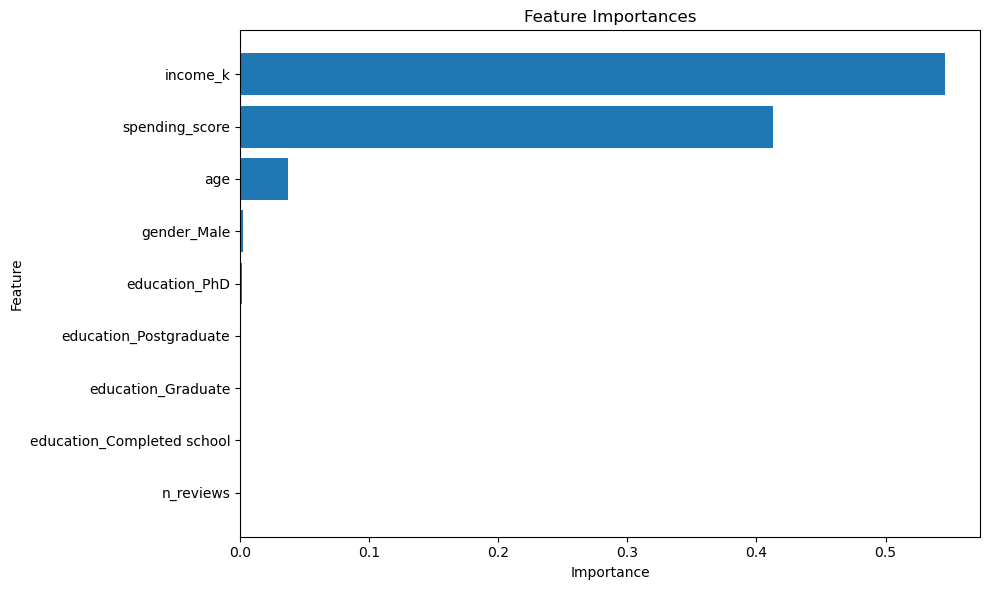

In [405]:
# Get feature_cols
feature_cols = [c for c in os_data_X.columns]

# Extract feature importances
feature_importances = dtc.feature_importances_

#Create a DataFrame to display feature importances
feature_importance_df = pd.DataFrame({"Feature": feature_cols, "Importance": feature_importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=True)

#Plot feature importances
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df["Feature"], feature_importance_df["Importance"])
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.title("Feature Importances")
plt.tight_layout()

plt.savefig("initial_feature_importances_dtc.png", dpi=500, bbox_inches="tight")

plt.show()

***Interpretation of the plot***: Income and spending score the most important features. Age is slightly important.

In [407]:
# Get actual values of feature importances.
feature_importance_df.sort_values(by="Importance", ascending=False)

,Feature,Importance
2,income_k,0.545831
3,spending_score,0.413036
1,age,0.037283
8,gender_Male,0.002200
6,education_PhD,0.001650
0,n_reviews,0.000000
4,education_Completed school,0.000000
5,education_Graduate,0.000000
7,education_Postgraduate,0.000000


As when using the decision tree regression, income_k, spending_score, and age are the only significant features. Before tuning the hyperparameters, I'm going to create the model again but only with these features.

In [409]:
# Define features (X) and target variable (y).
X = reviews_nreviews[["spending_score", "age", "income_k"]]
y = reviews_nreviews["loyalty_level"] 
X

,spending_score,age,income_k
0,40,17,13.94
1,54,17,35.26
2,48,17,53.30
3,26,17,69.70
4,81,18,12.30
...,...,...,...
777,56,72,37.72
778,47,72,39.36
779,55,72,40.18
780,93,72,66.42


In [410]:
# Apply SMOTE class as the target variable is not balanced.
os = SMOTE(random_state=0)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Balance the training data.
os_data_X, os_data_y = os.fit_resample(X_train, y_train)  

# Create two DataFrames for X and one for y:
os_data_X = pd.DataFrame(data = os_data_X, columns = X.columns) 
os_data_y = pd.DataFrame(data = os_data_y, columns = ["loyalty_level"])

# View DataFrame.
print(os_data_X.head())
os_data_y.head()

   spending_score  age  income_k
0              42   62     40.18
1              55   38     46.74
2              52   39     44.28
3              74   34    103.32
4              54   62     44.28


,loyalty_level
0,1
1,1
2,1
3,2
4,1


In [411]:
# Create Decision Tree Classifier object
dtc2 = DecisionTreeClassifier(random_state=42)

# Train Decision Tree Classifier
dtc2.fit(os_data_X, os_data_y)

# Predict on test data
y_pred = dtc2.predict(X_test)

In [412]:
# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy Score: {accuracy:.2f}")

# Print classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

Accuracy Score: 0.96
Classification Report:
              precision    recall  f1-score   support

           0       0.91      1.00      0.95        39
           1       0.97      0.96      0.97       102
           2       1.00      0.81      0.90        16

    accuracy                           0.96       157
   macro avg       0.96      0.92      0.94       157
weighted avg       0.96      0.96      0.95       157



In [413]:
print("Training Accuracy:", dtc2.score(os_data_X, os_data_y))
print("Test Accuracy:", dtc2.score(X_test, y_test))

Training Accuracy: 1.0
Test Accuracy: 0.9554140127388535


Still getting very high overall accuracy and 100% training accuracy so the model is still overfitting. I'm going to prune the tree and tune the hyperparameters. I'm going to set moderate hyperparameter values to reduce the chance of overfitting and underfitting. As the tree will be much smaller (less max depth), I'll also visualise this decision tree.\
***max_depth=5***\
***min_samples_split=10***\
***min_samples_leaf=10***\
***criterion="gini"***

In [415]:
# Create Decision Tree Classifier object
dtc3 = DecisionTreeClassifier(max_depth=5, min_samples_split=10, min_samples_leaf=10, criterion="gini", random_state=42)

# Train Decision Tree Classifier
dtc3.fit(os_data_X, os_data_y)

# Predict on test data
y_pred = dtc3.predict(X_test)

In [416]:
# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy Score: {accuracy:.2f}")

# Print classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

Accuracy Score: 0.92
Classification Report:
              precision    recall  f1-score   support

           0       0.83      1.00      0.91        39
           1       0.96      0.91      0.93       102
           2       0.92      0.75      0.83        16

    accuracy                           0.92       157
   macro avg       0.90      0.89      0.89       157
weighted avg       0.92      0.92      0.92       157



In [417]:
print("Training Accuracy:", dtc3.score(os_data_X, os_data_y))
print("Test Accuracy:", dtc3.score(X_test, y_test))

Training Accuracy: 0.9801980198019802
Test Accuracy: 0.9171974522292994


These are still very high accuracy scores, but they're not 100%! So there is at least less overfitting.

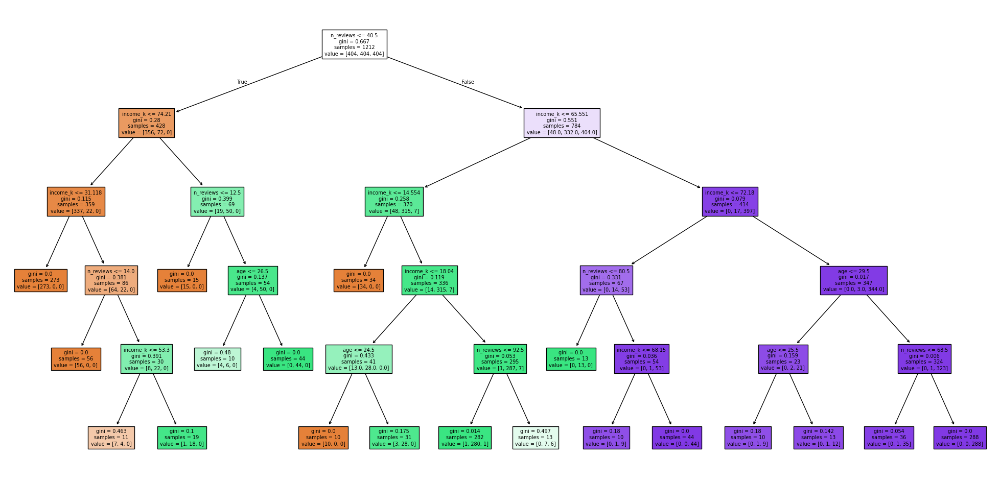

In [419]:
# Visualize the decision tree

plt.figure(figsize=(25, 12))
plot_tree(dtc3, feature_names=feature_cols, filled=True, fontsize=7)

# Save the fig so that I can zoom in.
plt.savefig("decision_tree_classification.png", format="png", dpi=300, bbox_inches="tight")

plt.show()

***Interpretation of the plot***: More purple = more high loyalty, more green = more medium loyalty, more orange = more low loyalty\
Here we can clearly see that higher spending scores and income is correlated with higher loyalty, and lower income is correlated with lower loyalty points. We can also see that higher spending scores can lead to low, medium, or high loyalty, although high loyalty requires there to be high spending scores.

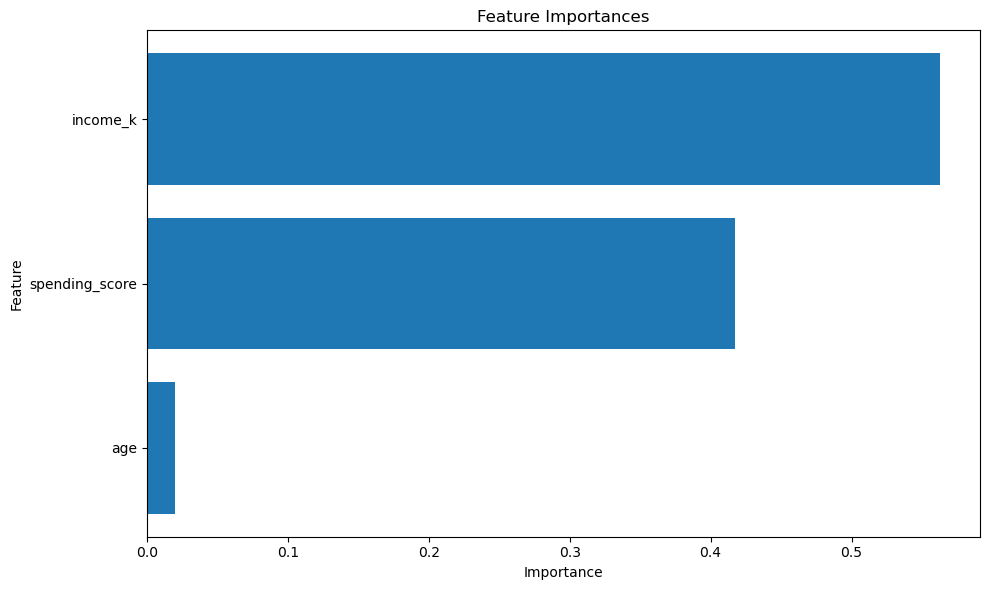

In [421]:
# Get feature_cols
feature_cols = [c for c in os_data_X.columns]

# Extract feature importances
feature_importances = dtc3.feature_importances_

#Create a DataFrame to display feature importances
feature_importance_df = pd.DataFrame({"Feature": feature_cols, "Importance": feature_importances})
feature_importance_df = feature_importance_df.sort_values(by="Importance", ascending=True)

#Plot feature importances
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df["Feature"], feature_importance_df["Importance"])
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.title("Feature Importances")
plt.tight_layout()

plt.savefig("features_importance_dtc.png", dpi=500, bbox_inches="tight")

plt.show()

In [422]:
# View the importance scores.
feature_importance_df.sort_values(by="Importance", ascending=False)

,Feature,Importance
2,income_k,0.563059
0,spending_score,0.417209
1,age,0.019732


Income and spending_score still the most important features.

***Summary of the model:***
- ***What's good about the model?***: The pruned tree is easily interpretable by stakeholders and is very accurate.
- ***What needs to be improved about the model?***: However, even when pruned, the accuracy scores are very high, suggesting that there is some overfitting. I'm going to use a Random Forest as this ensembel method tends to reduce overfitting.

##### Model used: Random Forest

In [426]:
# Create a Random Forest Classifier
rf = RandomForestClassifier(n_estimators=100, max_depth=5, min_samples_split=10, min_samples_leaf=10, random_state=42)

# Train the model
rf.fit(os_data_X, os_data_y)

# Predict loyalty levels on test data
y_pred = rf.predict(X_test)

In [427]:
# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy Score: {accuracy:.2f}")

# Print classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

Accuracy Score: 0.90
Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.92      0.87        39
           1       0.94      0.90      0.92       102
           2       0.87      0.81      0.84        16

    accuracy                           0.90       157
   macro avg       0.87      0.88      0.88       157
weighted avg       0.90      0.90      0.90       157



In [428]:
print("Training Accuracy:", rf.score(os_data_X, os_data_y))
print("Test Accuracy:", rf.score(X_test, y_test))

Training Accuracy: 0.9777227722772277
Test Accuracy: 0.8980891719745223


It performs very well on the training data, but less so on the test data. There may still be some overfitting. I'm going to increase the number of trees, decrease the max depth, and increase the minimum number of samples in the split and leaf.

In [430]:
# Create a Random Forest Classifier
rf2 = RandomForestClassifier(n_estimators=300, max_depth=4, min_samples_split=20, min_samples_leaf=20, random_state=42)

# Train the model
rf2.fit(os_data_X, os_data_y)

# Predict loyalty levels on test data
y_pred = rf2.predict(X_test)

In [431]:
# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy Score: {accuracy:.2f}")

# Print classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

Accuracy Score: 0.89
Classification Report:
              precision    recall  f1-score   support

           0       0.78      0.92      0.85        39
           1       0.94      0.88      0.91       102
           2       0.87      0.81      0.84        16

    accuracy                           0.89       157
   macro avg       0.86      0.87      0.86       157
weighted avg       0.89      0.89      0.89       157



In [432]:
print("Training Accuracy:", rf2.score(os_data_X, os_data_y))
print("Test Accuracy:", rf2.score(X_test, y_test))

Training Accuracy: 0.9694719471947195
Test Accuracy: 0.8853503184713376


This has reduced the accuracy a bit but there is still reasonable sized gap between training and testing accuracy.

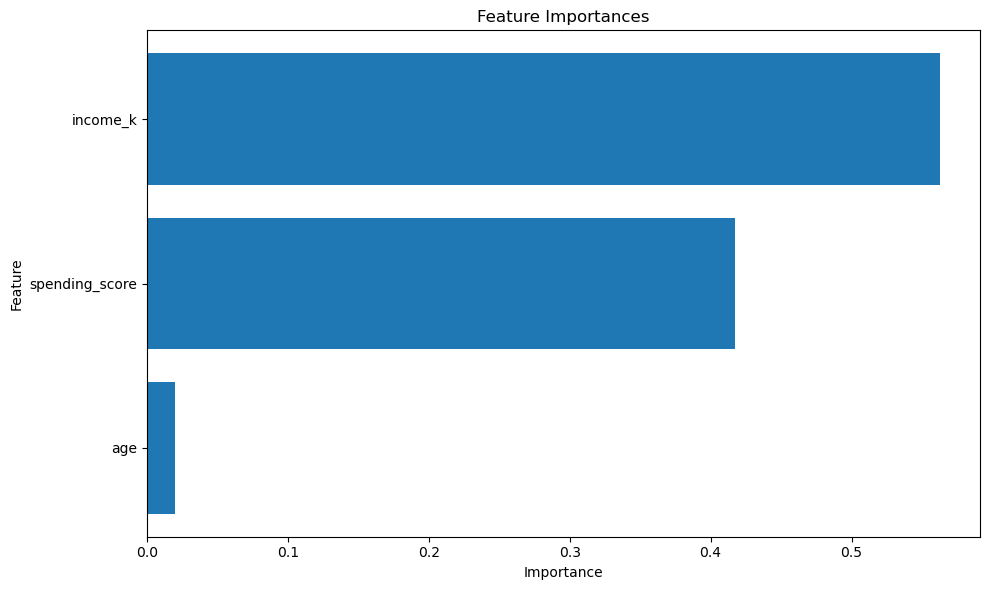

In [434]:
# Get feature_cols
feature_cols = [c for c in os_data_X.columns]

# Extract feature importances
feature_importances = dtc3.feature_importances_

# Create a DataFrame to display feature importances
feature_importance_df = pd.DataFrame({"Feature": feature_cols, "Importance": feature_importances})
feature_importance_df = feature_importance_df.sort_values(by="Importance", ascending=True)

# Plot feature importances
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df["Feature"], feature_importance_df["Importance"])
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.title("Feature Importances")
plt.tight_layout()
plt.show()

In [435]:
# View the importance scores.
feature_importance_df.sort_values(by="Importance", ascending=False)

,Feature,Importance
2,income_k,0.563059
0,spending_score,0.417209
1,age,0.019732


Similar/the same seen above.

***Summary of the model:***
- ***What's good about the model?***: The accuracy scores are lower suggesting less overfitting but there is a reasonable gap between training and testing accuracy meaning it might be overfitting on the training data.
- ***What needs to be improved about the model?***: Might be slightly fitted and can;t be easily interpreted by stakeholders like the decision tree can.

### Business question 2: How can customers be segmented into groups, and which groups can be targeted by the marketing department?

#### 1. How can the customers be segmented into groups?

##### Model used: k-means clustering

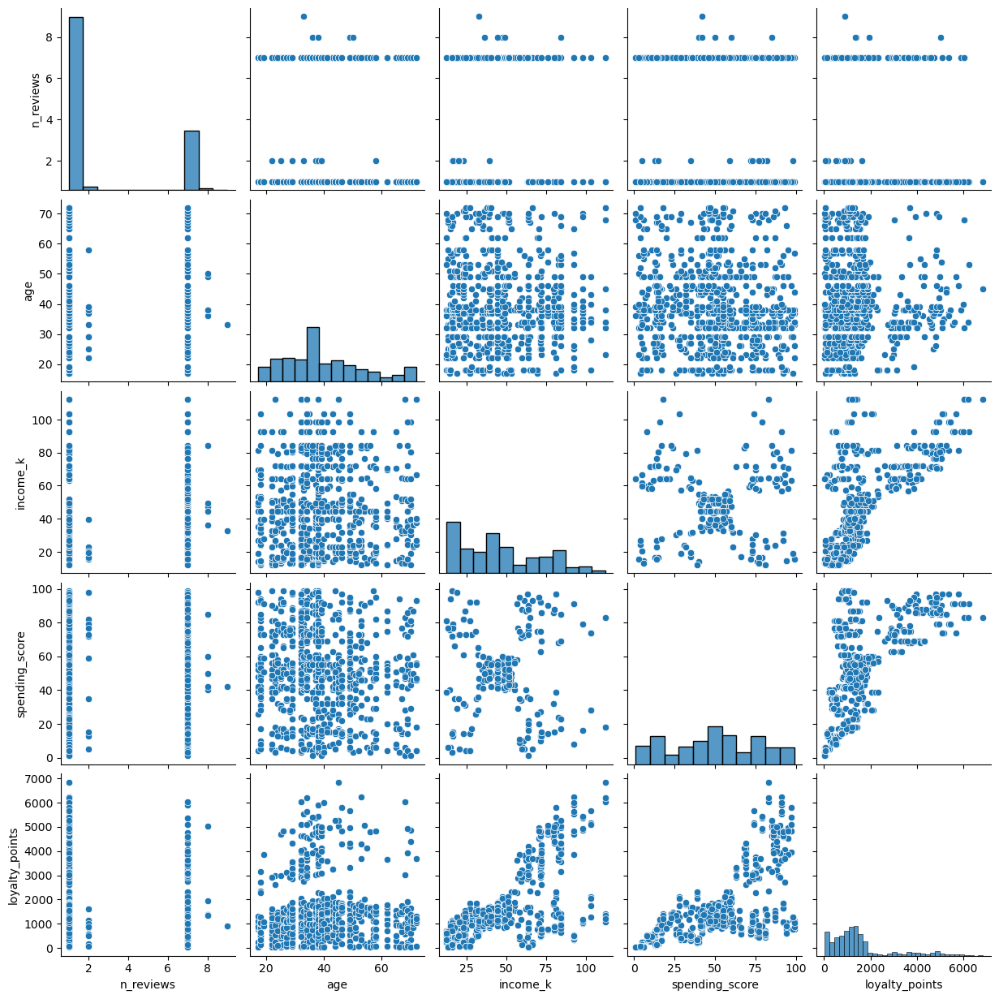

In [441]:
# View the pairplot (same as earlier in the notebook).
sns.pairplot(reviews_nreviews3)

***Interpretation of the plot***: We can see clear clustering between the spending_score and income_k variables where there appears to be 5 clusters. I'll use the elbow and silhouette methods to check that the optimum number of clusters is indeed 5.

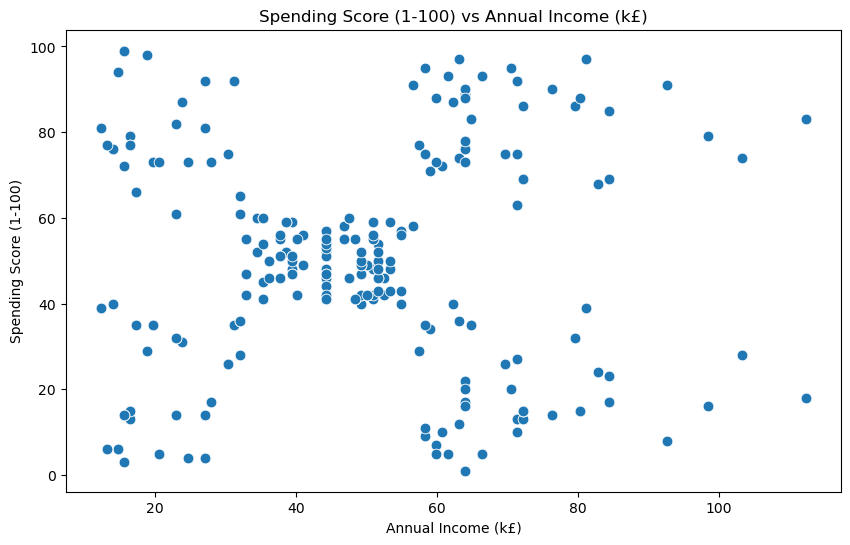

In [443]:
# View the spending_score, income_k scatterplot.
plt.figure(figsize=(10,6))
sns.scatterplot(x="income_k", y="spending_score",  data=reviews_nreviews3, s = 60 )
plt.xlabel("Annual Income (k£)")
plt.ylabel("Spending Score (1-100)") 
plt.title("Spending Score (1-100) vs Annual Income (k£)")

# Get the title from the plot
plot_title = plt.gca().get_title()

# Clean the title to create a filename
clean_title = re.sub(r'[^\w\s-]', '', plot_title.replace("\n", " ")).strip().replace(' ', '_').lower()
filename = f"{clean_title}.png"

# Save the figure
plt.savefig(filename, dpi=500, bbox_inches="tight")

plt.show()

***Interpretation of the plot***: Again, there clearly seems to be 5 clusters.

Next: Determine the optimal number of clusters using the elbow and silhouette methods.

1. The Elbow Method

In [447]:
# Define X variable
X=reviews_nreviews3[["income_k","spending_score"]]

# View X
X.head()

,income_k,spending_score
0,13.94,40
1,35.26,54
2,53.30,48
3,69.70,26
4,12.30,81


In [448]:
# Within Cluster Sum of Squared Errors (WSS) 
# Create an empty list to store WSS values
wcss=[]

# Select a range of 1 to 10 clusters.
for i in range(1,11):
    # Create a KMeans object with 'i' clusters and set the number of initializations to 10
    km = KMeans(n_clusters=i, n_init=10) 
    km.fit(X)
    wcss.append(km.inertia_)

wcss

  File "C:\Users\jmrob\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
               ^^^^^^^^^^^^^^^
  File "C:\Users\jmrob\anaconda3\Lib\subprocess.py", line 548, in run
    with Popen(*popenargs, **kwargs) as process:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\jmrob\anaconda3\Lib\subprocess.py", line 1026, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "C:\Users\jmrob\anaconda3\Lib\subprocess.py", line 1538, in _execute_child
    hp, ht, pid, tid = _winapi.CreateProcess(executable, args,
                       ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


[1050265.7051682863,
 675519.5966223144,
 440090.428151623,
 251647.3757937954,
 126976.0861924743,
 107378.61646587506,
 92769.33367091777,
 78964.27898932587,
 69672.0088998773,
 61194.930892549666]

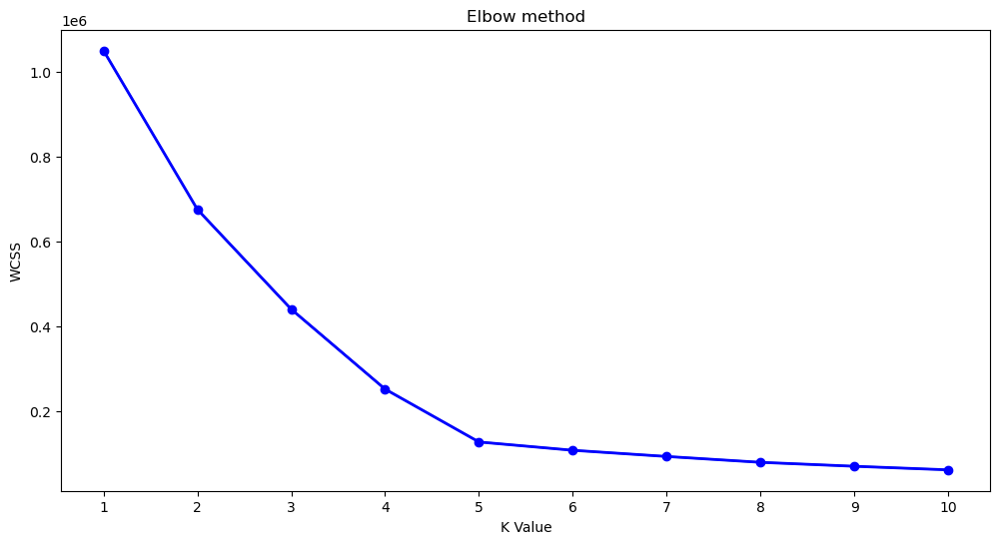

In [449]:
# Plot the elbow curve
plt.figure(figsize=(12,6))
plt.plot(range(1,11),wcss)
plt.plot(range(1,11),wcss, linewidth=2, color="blue", marker ="o")
plt.xlabel("K Value")
plt.xticks(np.arange(1,11,1))
plt.ylabel("WCSS")
plt.title("Elbow method")

# Get the title from the plot
plot_title = plt.gca().get_title()

# Clean the title to create a filename
clean_title = re.sub(r'[^\w\s-]', '', plot_title.replace("\n", " ")).strip().replace(' ', '_').lower()
filename = f"{clean_title}.png"

# Save the figure
plt.savefig(filename, dpi=500, bbox_inches="tight")

plt.show()

***Interpretation of the plot***: The decrease in WCSS starts to slow down around k=5 which is as expected.

2. The Silhouette Method

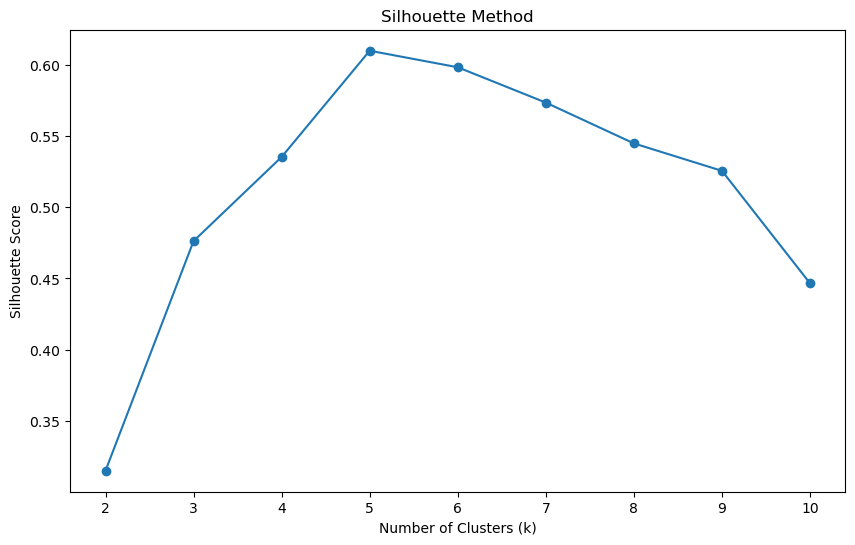

In [452]:
# Create an empty list to store silhouette scores
silhouette_scores = []

# Loop through different values of k
for k in range(2, 11):
    km = KMeans(n_clusters=k, n_init=10, random_state=42)
    km.fit(X)
    y_pred = km.predict(X)
    
    silhouette_avg = silhouette_score(X, y_pred)
    silhouette_scores.append(silhouette_avg)

# Plot the silhouette scores
plt.figure(figsize=(10, 6))
plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.title("Silhouette Method")
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Silhouette Score")
plt.xticks(range(2, 11))

# Get the title from the plot
plot_title = plt.gca().get_title()

# Clean the title to create a filename
clean_title = re.sub(r'[^\w\s-]', '', plot_title.replace("\n", " ")).strip().replace(' ', '_').lower()
filename = f"{clean_title}.png"

# Save the figure
plt.savefig(filename, dpi=500, bbox_inches="tight")

plt.show()

***Interpretation of the plot***: We're looking for the maximum silhouette score as a higher score means that, on average, the data points are more closely matched to their own cluster than their neighbouring clusters. The maximum silhouette score here is 5.\
Therefore, from looking at the scatterplot, and using the elbow and silhouette methods, I have concluded that the ***optimal number of clusters is 5.***

***Cluster the data using k-means++*** because it spreads the centroids out more effectively, leading to better clustering quality.

In [455]:
# Create an instance of the k-means model using k-means++ and 5 clusters.
km = KMeans(n_clusters=5, init="k-means++", n_init=10, random_state=42)

# Fitting the input data
km.fit(X)

# Predicting the clusters of the input data
y = km.predict(X)

In [456]:
# View y
y

array([0, 4, 4, 3, 1, 1, 4, 4, 4, 4, 2, 2, 1, 0, 1, 1, 1, 4, 4, 0, 0, 1,
       0, 1, 4, 4, 4, 4, 4, 4, 4, 4, 2, 2, 3, 0, 1, 0, 1, 4, 4, 4, 3, 0,
       1, 0, 0, 1, 0, 0, 0, 0, 1, 4, 4, 4, 4, 4, 4, 4, 4, 3, 3, 2, 3, 2,
       0, 1, 1, 1, 0, 4, 4, 2, 0, 4, 4, 3, 1, 1, 0, 1, 0, 1, 1, 0, 0, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 2, 2, 2, 2, 3, 2, 2, 2, 3, 3, 3, 2, 1,
       1, 1, 0, 1, 1, 1, 0, 1, 4, 4, 4, 4, 4, 4, 2, 2, 2, 2, 3, 3, 2, 2,
       2, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 4, 4, 4, 4, 4, 4, 4, 2, 2, 2,
       2, 2, 3, 2, 0, 0, 1, 1, 1, 4, 4, 4, 4, 4, 4, 4, 4, 2, 2, 3, 3, 3,
       2, 2, 2, 3, 2, 2, 1, 2, 3, 2, 1, 0, 0, 4, 4, 4, 3, 2, 3, 2, 3, 1,
       0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 4, 4, 4, 4, 4, 4, 4, 4, 2, 2, 2, 2,
       2, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 2, 3, 2, 3, 3, 2, 3, 2, 3, 2, 3, 2, 2, 2, 3, 0, 0,
       0, 4, 4, 4, 3, 3, 3, 2, 3, 0, 0, 4, 4, 0, 4, 4, 3, 0, 4, 4, 3, 3,
       2, 3, 3, 0, 0, 1, 0, 4, 4, 4, 4, 4, 2, 3, 3,

In [457]:
# Creating a new column called "label" and adding the clusters to it.
reviews_nreviews3["label"] = y

In [458]:
# View the data frame.
reviews_nreviews3.head()

,n_reviews,gender,age,income_k,spending_score,loyalty_points,education,label
0,1,Female,17,13.94,40,233,Postgraduate,0
1,1,Female,17,35.26,54,797,Postgraduate,4
2,7,Female,17,53.30,48,1071,Postgraduate,4
3,1,Female,17,69.70,26,759,Postgraduate,3
4,1,Female,18,12.30,81,436,Graduate,1


In [459]:
# Check that there are 5 values in the "label" column.
reviews_nreviews3["label"].unique()

array([0, 4, 3, 1, 2])

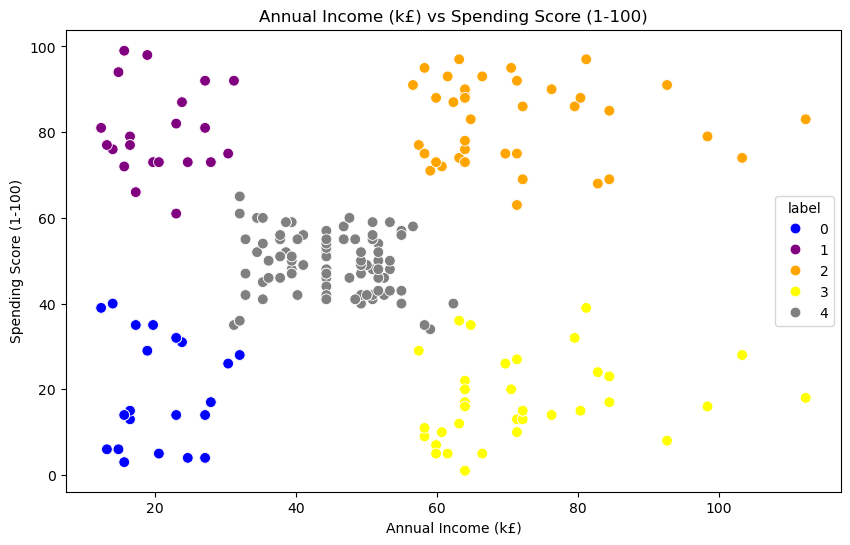

In [460]:
# Scatterplot of the clusters
plt.figure(figsize=(10,6))
sns.scatterplot(x="income_k", y="spending_score", hue="label",  
                 palette=["blue", "purple", "orange", "yellow", "gray"], legend='full', data=reviews_nreviews3, s = 60 )
plt.xlabel("Annual Income (k£)")
plt.ylabel("Spending Score (1-100)") 
plt.title("Annual Income (k£) vs Spending Score (1-100)")

# Get the title from the plot
plot_title = plt.gca().get_title()

# Clean the title to create a filename
clean_title = re.sub(r'[^\w\s-]', '', plot_title.replace("\n", " ")).strip().replace(' ', '_').lower()
filename = f"{clean_title}.png"

# Save the figure
plt.savefig(filename, dpi=500, bbox_inches="tight")

plt.show()

***Interpretation of the plot***: The clusters of customers can be clearly seen. I've avoided using red and green here to make it easier to read for those with colour blindness.

***Analysis of the segments***:

***Segment 0: Budget Essentialists***\
Annual income: approx £8k - £32k (low)\
Spending score: approx 2 - 40 (low)\

Possible behaviours: Customers in this segment have a low income and a low spending score suggesting that they look more for budget items and do not spend money on expensive products. Marketing for this category of customer should focus on sale items and low cost items, as well as promoting offers and discounts like 3 for 2. Maybe offer loyalty programs that will allow them to spend loyalty points on a product which could encourage them to keep buying from the store.

***Segment 1: Aspirational Spenders***\
Annual income: approx £8k - £32k (low)\
Spending score: approx 60 - 100 (high)\

Possible behaviours: Customers in this segment have a low income but a high spending score suggesting that they either do not prioritise saving and are impulse buyers, or are willing to save up for items they really want while budgeting elsewhere. Marketing for this category of customer could focus on promoting discounts and deals as well as offering loyalty programs that will allow them to accumulate lots of loyalty points. This could keep them shopping at Turtle Games, rather than spending their saved up money elsewhere. Market high value items, but with some sort of discount or other incentive attached.

***Segment 2: Affluent Indulgers***\
Annual income: approx £58k - £115k (high)\
Spending score: approx 60 - 100 (high)\

Possible behaviours: Customers in this segment have a high income and a high spending socre suggesting that they are willing to spend lots of money at the store. Market luxury, high value, and high quality items towards these customers as well as providing them with incentives to stay, such as providing them with premium access to certain items if they accumulate a high number of loyalty points. 

***Segment 3: Wealth-Conscious Savers***\
Annual income: approx £58k - £115k (high)\
Spending score: approx 2- 40 (low)\

Possible behaviours: Customers in this segment have a high income but a low spending score suggesting that they prioritise saving over spending lots of money on products. These customers could be more willing to spend more on products they perceive to be as high quality which will last a long time and they (or the person they're buying for) will get good use out of. Market high quality items to these customers, with discounts to encourage them to spend. Also engage them in a loyalty points scheme that will give them reductions in price so that you can retain these customers.

***Segment 4: Practical Purchasers***\
Annual income: £30k - £60k (Mid)
Spending score: 35 - 65 (Mid)

Possible behaviours: Customers in this segment have a mid income and a mid spending score, suggesting that they are willing to spend a decent amount of money on products, but are somewhat budget conscious so are unlikely to buy higher value products. Advertise mid range products to them that are high quality to encourage them to buy the products, as well as high value products that have been discounted so they feel like they are getting a great deal.

Note: This doesn't necessarily mean that if I customer is in one of these categories, this is how they tend to shop generally. For example, someone in low income, high spending category might have bought multiple items from this shop but spend very little in other shops. or have bought one expensive item for a present but not be planning on spending much in the future.

Rename the labels so that the scatterplot is more easily understood by the stakeholders.

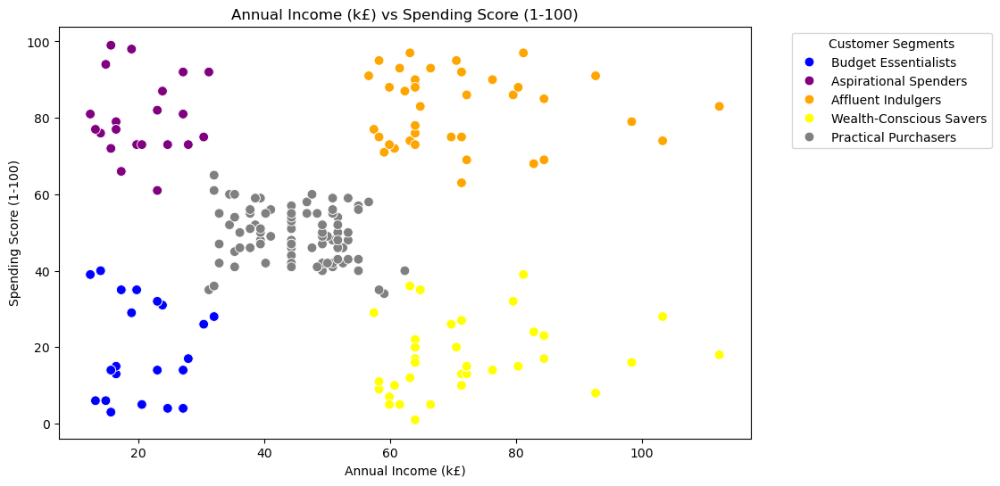

In [465]:
# Define custom labels for the segments
segment_labels = {
    "0": "Budget Essentialists",
    "1": "Aspirational Spenders",
    "2": "Affluent Indulgers",
    "3": "Wealth-Conscious Savers",
    "4": "Practical Purchasers"}

# Create scatterplot
plt.figure(figsize=(10,6))
scatter = sns.scatterplot(x="income_k", y="spending_score", hue="label",  
                          palette=["blue", "purple", "orange", "yellow", "gray"], 
                          data=reviews_nreviews3, s=60)

# Get legend handles and labels
handles, labels = scatter.get_legend_handles_labels()

# Convert labels to match dictionary keys
new_labels = [segment_labels[label] if label in segment_labels else label for label in labels]

# Update legend
plt.legend(handles=handles, labels=new_labels, title="Customer Segments", 
           bbox_to_anchor=(1.05, 1), loc='upper left')

# Axis labels and title
plt.xlabel("Annual Income (k£)")
plt.ylabel("Spending Score (1-100)")
plt.title("Annual Income (k£) vs Spending Score (1-100)")

# Get the title from the plot
plot_title = plt.gca().get_title()

# Clean the title to create a filename
clean_title = re.sub(r'[^\w\s-]', '', plot_title.replace("\n", " ")).strip().replace(' ', '_').lower()
filename = f"{clean_title}.png"

# Save the figure
plt.savefig(filename, dpi=500, bbox_inches="tight")

# Show plot
plt.show()


***Using three variables (creating a 3D plot)***: Adding "Age" as a third feature.

In [467]:
# Taking all three features
X2 = reviews_nreviews3[["age", "income_k", "spending_score"]]
X2

,age,income_k,spending_score
0,17,13.94,40
1,17,35.26,54
2,17,53.30,48
3,17,69.70,26
4,18,12.30,81
...,...,...,...
777,72,37.72,56
778,72,39.36,47
779,72,40.18,55
780,72,66.42,93


1. The Elbow Method

In [469]:
# Calculate the Within Cluster Sum of Squared Errors (WSS) for different values of k.
wcss = []
for k in range(1,11):
    kmeans = KMeans(n_clusters=k, n_init=10)
    kmeans.fit(X2)
    wcss.append(kmeans.inertia_)

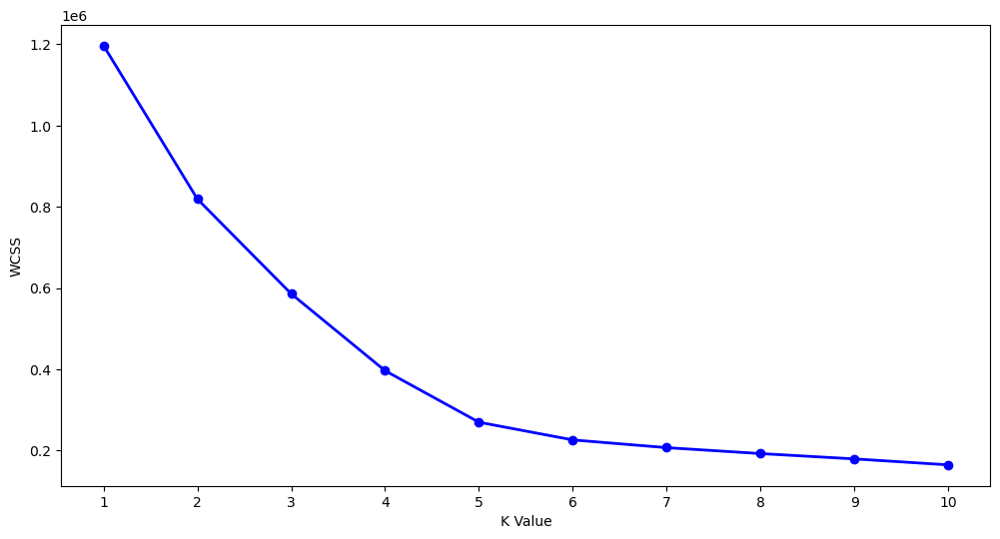

In [470]:
# Plot the Elbow Method
plt.figure(figsize=(12,6))    
plt.plot(range(1,11),wcss, linewidth=2, color="blue", marker="o")
plt.xlabel("K Value")
plt.xticks(np.arange(1,11,1))
plt.ylabel("WCSS")
plt.show()

***Interpretation of the plot***: 5 clusters is looking good again.

2. The Silhouette Method

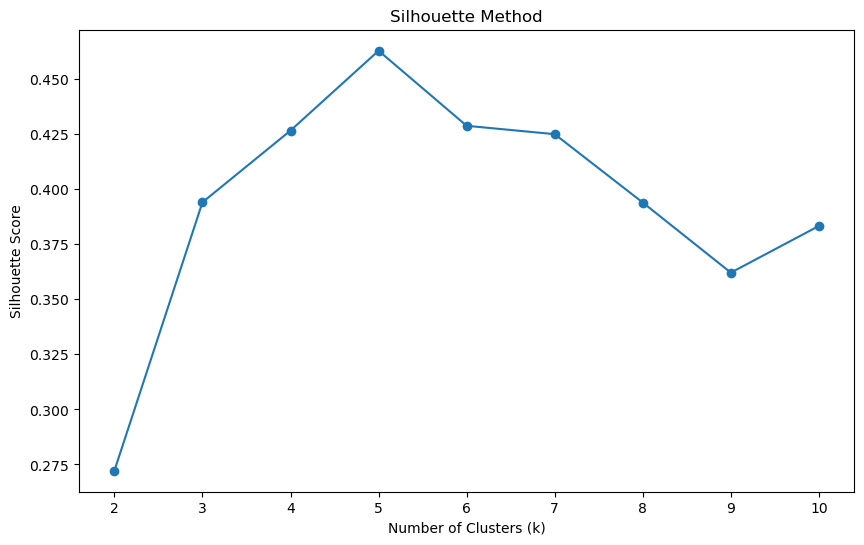

In [473]:
# Create an empty list to store silhouette scores
silhouette_scores = []

# Loop through different values of k
for k in range(2, 11):
    km = KMeans(n_clusters=k, n_init=10, random_state=42)
    km.fit(X2)
    y_pred = km.predict(X2)
    
    silhouette_avg = silhouette_score(X2, y_pred)
    silhouette_scores.append(silhouette_avg)

# Plot the silhouette scores
plt.figure(figsize=(10, 6))
plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.title("Silhouette Method")
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Silhouette Score")
plt.xticks(range(2, 11))
plt.show()

***Interpretation of the plot***: 5 clusters has the highest accuracy score.

In [475]:
# Create an instance of the k-means model using k-means++ and 5 clusters.
km = KMeans(n_clusters=5, init="k-means++", n_init=10, random_state=42)

# Fitting the input data
km.fit(X2)

# Predicting the clusters of the input data
y2 = km.predict(X2)

In [476]:
# Copy reviews_nreviews3 data frame, delete "label" column.
# Copy the data frame.
reviews_nreviews4 = reviews_nreviews3.copy()

# Delete the "label" column.
reviews_nreviews4.drop(columns="label", inplace=True)

# View reviews_nreviews4
reviews_nreviews4.head()

,n_reviews,gender,age,income_k,spending_score,loyalty_points,education
0,1,Female,17,13.94,40,233,Postgraduate
1,1,Female,17,35.26,54,797,Postgraduate
2,7,Female,17,53.30,48,1071,Postgraduate
3,1,Female,17,69.70,26,759,Postgraduate
4,1,Female,18,12.30,81,436,Graduate


In [477]:
# Add "label" column for the 3 variables.
reviews_nreviews4["label"] = y2

In [478]:
# View reviews_nreviews4
reviews_nreviews4.head()

,n_reviews,gender,age,income_k,spending_score,loyalty_points,education,label
0,1,Female,17,13.94,40,233,Postgraduate,0
1,1,Female,17,35.26,54,797,Postgraduate,4
2,7,Female,17,53.30,48,1071,Postgraduate,4
3,1,Female,17,69.70,26,759,Postgraduate,3
4,1,Female,18,12.30,81,436,Graduate,1


In [479]:
# Check the values in the "label" column. There should be 4 values.
reviews_nreviews4["label"].unique()

array([0, 4, 3, 1, 2])

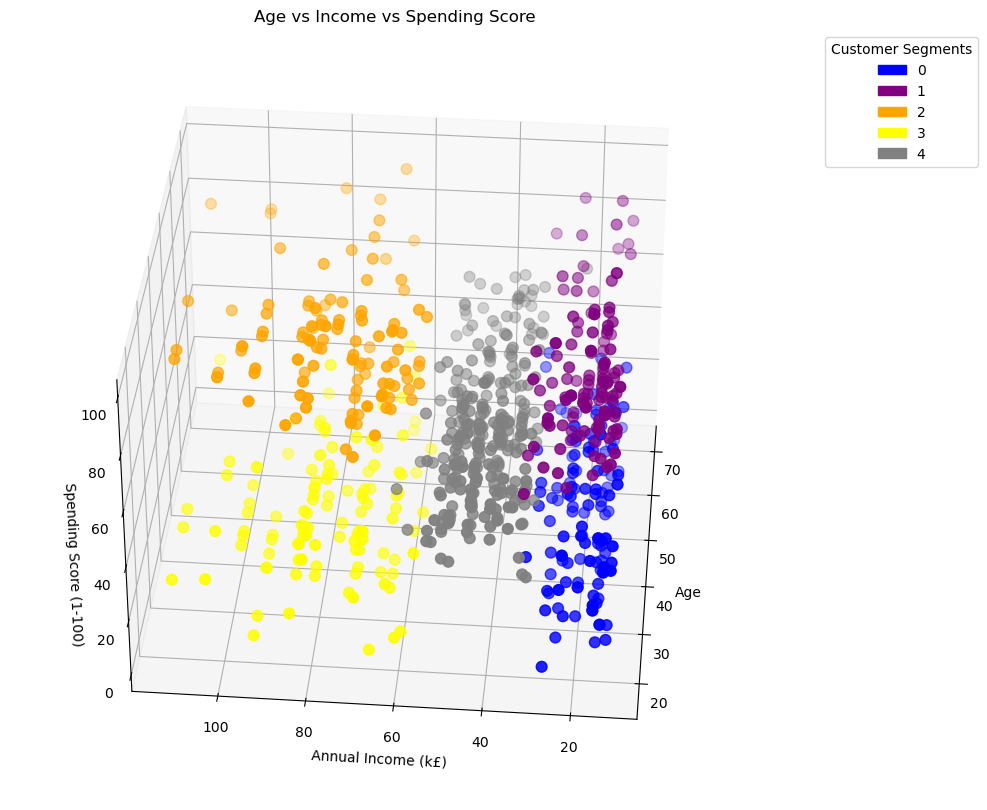

In [480]:
# Here is a 3D Plot as the clustering is on 3 input features.
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(reviews_nreviews4.age[reviews_nreviews4.label == 0], reviews_nreviews4["income_k"][reviews_nreviews4.label == 0], 
           reviews_nreviews4["spending_score"][reviews_nreviews4.label == 0], c='blue', s=60)
ax.scatter(reviews_nreviews4.age[reviews_nreviews4.label == 1], reviews_nreviews4["income_k"][reviews_nreviews4.label == 1],
           reviews_nreviews4["spending_score"][reviews_nreviews4.label == 1], c='purple', s=60)
ax.scatter(reviews_nreviews4.age[reviews_nreviews4.label == 2], reviews_nreviews4["income_k"][reviews_nreviews4.label == 2], 
           reviews_nreviews4["spending_score"][reviews_nreviews4.label == 2], c='orange', s=60)
ax.scatter(reviews_nreviews4.age[reviews_nreviews4.label == 3], reviews_nreviews4["income_k"][reviews_nreviews4.label == 3],
           reviews_nreviews4["spending_score"][reviews_nreviews4.label == 3], c='yellow', s=60)
ax.scatter(reviews_nreviews4.age[reviews_nreviews4.label == 4], reviews_nreviews4["income_k"][reviews_nreviews4.label == 4],
           reviews_nreviews4["spending_score"][reviews_nreviews4.label == 4], c='gray', s=60)

ax.view_init(35, 185)
plt.xlabel("Age")
plt.ylabel("Annual Income (k£)")
ax.set_zlabel("Spending Score (1-100)")
plt.title("Age vs Income vs Spending Score")

# Create legend manually
colors = ["blue", "purple", "orange", "yellow", "gray"]
legend_patches = [mpatches.Patch(color=colors[i], label=labels[i]) for i in range(len(colors))]
ax.legend(handles=legend_patches, title="Customer Segments", bbox_to_anchor=(1.05, 1), loc='upper left')

# Get the title from the plot
plot_title = plt.gca().get_title()

# Clean the title to create a filename
clean_title = re.sub(r'[^\w\s-]', '', plot_title.replace("\n", " ")).strip().replace(' ', '_').lower()
filename = f"{clean_title}.png"

# Save the figure
plt.savefig(filename, dpi=500, bbox_inches="tight")

plt.show()

***Interpretation of the plot***:

***Analysis of the segments***:

***Segment 0 (blue):***\
Annual income: approx £8k - £38k (low to mid) \
Spending score: Low\
Age: All ages


Possible behaviours: Customers in this segment are probably more budget conscious. Market discounts and deals as well as lower value products at this category. Also market mid value products that have been discounted so that the customer feels they are getting a good deal. 

***Segment 1 (purple):**\
Annual income: approx £10k - £38k (low to mid)\
Spending score: Up to approx 80 (low-high)\
Age: Approx 58+ (older)

Possible behaviours: Customers in this segment are in the older range of customers, don't have lots of money, but can spend quite a lot. As these are older customers and this is a games company, you could market these products as presents for grandchildren. There are a range of spending scores so try marketing a range of products at discounted prices.

***Segment 2 (orange):***\
Annual income: approx £60k - £120k (high) \
Spending score: Up to approx 90 (low-high)\
Age: 65+ (older)

Possible behaviours:  Customers in this segment are in the older range of customers, have a high annual income, and have a low-high spending score. These customers have the money, and probably the time, to spare looking at products, again, probably gifts for younger family members. Market high quality, mid or high value products, that the customer will believe will be a durable product and looks like a premium product. 

***Segment 3 (yellow):***\
Annual income: approx £60k - £118k (high)\
Spending score: Up to approx 20 (low)\
Age: approx 23+

Possible behaviours: Customers in this segment are have a high income, have a wide variety of ages, but spend very little. These customers could be big on saving and are cautious about spending their money. They will probably want good quality products at a good price, so provide them with discounts, and enrol on loyalty schemes that will reward them for spending to encourage them to spend more. 

***Segment 4 (grey):***\
Annual income: approx £20k - £63k (low-slightly into high)
Spending score: Up to approx 55 (low-mid)
Age: 40+ (mid-high)

Possible behaviours: Customers in this segment have a wide range of incomes, that covers mostly the middle income range, have a low-mid spending score, and a middle aged and above. Market mid priced products at these customers including at a discounted price, including bundles of low priced products. These customers will likely have children or grandchildren so advertise these products as great for present for children.

***Summary of the model:***
- ***What's good about the model?***: It has shown 5 clear segments of customers that can be targeted by the marketing department. These clusters  were also seen on the scatterplot before using k-means so it hasn't arbtrarily chosen the clusters.
- ***What needs to be improved about the model?***: The model using the three variables isn't as easy to understand as a visualisation. Also there is lots of overlapping so I won't show this visualisation to the stakeholder. I think it'll just confuse them.

### Business question 3: How can customer reviews be used to inform marketing campaigns and make improvements to the business?

##### Model used: Sentiment analysis (NLP)

In [486]:
# View data frame.
reviews.head()

,customer_id,gender,age,income_k,spending_score,loyalty_points,education,product,review,summary
1714,1,Female,17,13.94,40,233,Postgraduate,7573,My son (8) and daughter (11) were and still ar...,Five Stars
1914,2,Female,17,35.26,54,797,Postgraduate,4491,super for playing quiddler!,Five Stars
714,3,Female,17,53.30,48,1071,Postgraduate,2404,These are great quality and super cute! They a...,Love these!
914,3,Female,17,53.30,48,1071,Postgraduate,5493,This is a very good game. We enjoy playing it ...,"Good game, not durable version"
314,3,Female,17,53.30,48,1071,Postgraduate,2326,These are cute and the instructions are relati...,Cute but creators will be older kids and adult...


***I'm going to analyse the text data of the "review" and "summary" columns.*** Each row should have the same sentiment (postive, neutral, or negative) for both the review and the summary so they will be compared. If they have substantially differing sentiments, I will mainly analyse the "review" column as the summary column is supposed to summarise the customer's review so may not be as accurate as it may lose the original meaning of the review.

***I'm only going to remove the "product" column as keeping the other columns, means I can analyse sentiment by demographics, loyalty points, and spending scores.*** Whilst this will make for a data frame with lots of columns, I think that analysing how demographics, loyalty points, and spending scores might be correlated with sentiment could yield useful insights.

In [488]:
# Remove the "product" column.
reviews_text = reviews.drop(columns=["product"])
reviews_text.head()

,customer_id,gender,age,income_k,spending_score,loyalty_points,education,review,summary
1714,1,Female,17,13.94,40,233,Postgraduate,My son (8) and daughter (11) were and still ar...,Five Stars
1914,2,Female,17,35.26,54,797,Postgraduate,super for playing quiddler!,Five Stars
714,3,Female,17,53.30,48,1071,Postgraduate,These are great quality and super cute! They a...,Love these!
914,3,Female,17,53.30,48,1071,Postgraduate,This is a very good game. We enjoy playing it ...,"Good game, not durable version"
314,3,Female,17,53.30,48,1071,Postgraduate,These are cute and the instructions are relati...,Cute but creators will be older kids and adult...


In [489]:
# Are there any missing values?
reviews_text[["review", "summary"]].isna().sum()

review     0
summary    0
dtype: int64

In [490]:
# Are there any duplicates in the "review" or "summary" columns?
print("Duplicated reviews:", reviews_text["review"].duplicated().sum())
print("Duplicated summaries:", reviews_text["summary"].duplicated().sum())

Duplicated reviews: 20
Duplicated summaries: 568


There are duplicates, particularly duplicated summaries. However, as summaries are only a short summary of the review, they could be ok to keep. I'll view some examples of these duplicates. Duplicated reviews are an issue however, as two different people are very unlikely to leave the exact same review. These will be removed.

In [492]:
# Show examples of duplicated summaries.
reviews_text["summary"][reviews_text.duplicated(subset=["summary"])].unique()

array(['Five Stars', 'Four Stars', 'Fun', 'Great!', 'Disappointing',
       'Two Stars', 'Fun word game', 'Great game', 'Fun!', 'Awesome',
       'Ball of Whacks', 'Cute', 'Love this game!', 'Three Stars',
       'great game', 'great', 'One Star', 'Fun game', 'Super fun',
       'I love this game', 'Great Expansion', 'Nice', 'Great expansion',
       'Acquire', 'So cute!', 'Great game!', 'Gift', 'Love!',
       'Great pictures', 'One of my favorite games', 'Disappointed',
       'Excellent!', 'Acquire Game', 'Fun toy', 'Love this game',
       'Great Game', 'Love it!', 'Meh', 'Great product!', 'good',
       'Great toy', 'loved it', 'fun', 'Perfect!', 'Precious', 'Meh...',
       'They love it!', 'Excellent Game', 'great!'], dtype=object)

These seem like ok summaries to keep as they are only a few words at most so are most likely not "bad" duplicates.

In [494]:
# What is the number of rows before dropping rows?
reviews_text.shape

(2000, 9)

In [495]:
# Drop duplicates in the "review" column.
reviews_text.drop_duplicates(subset=["review"], inplace=True)

In [496]:
# View the data frame and number of rows (there should be 1980 (2000-20)).
print(reviews_text.shape)
reviews_text.head()

(1980, 9)


,customer_id,gender,age,income_k,spending_score,loyalty_points,education,review,summary
1714,1,Female,17,13.94,40,233,Postgraduate,My son (8) and daughter (11) were and still ar...,Five Stars
1914,2,Female,17,35.26,54,797,Postgraduate,super for playing quiddler!,Five Stars
714,3,Female,17,53.30,48,1071,Postgraduate,These are great quality and super cute! They a...,Love these!
914,3,Female,17,53.30,48,1071,Postgraduate,This is a very good game. We enjoy playing it ...,"Good game, not durable version"
314,3,Female,17,53.30,48,1071,Postgraduate,These are cute and the instructions are relati...,Cute but creators will be older kids and adult...


Next, I'm going to ***preprocess the text***.

In [498]:
# View the English stopwords. Are there any I want to keep?
# Get the list of English stopwords
english_stopwords = stopwords.words('english')

# Print the list
print(english_stopwords)

['a', 'about', 'above', 'after', 'again', 'against', 'ain', 'all', 'am', 'an', 'and', 'any', 'are', 'aren', "aren't", 'as', 'at', 'be', 'because', 'been', 'before', 'being', 'below', 'between', 'both', 'but', 'by', 'can', 'couldn', "couldn't", 'd', 'did', 'didn', "didn't", 'do', 'does', 'doesn', "doesn't", 'doing', 'don', "don't", 'down', 'during', 'each', 'few', 'for', 'from', 'further', 'had', 'hadn', "hadn't", 'has', 'hasn', "hasn't", 'have', 'haven', "haven't", 'having', 'he', "he'd", "he'll", 'her', 'here', 'hers', 'herself', "he's", 'him', 'himself', 'his', 'how', 'i', "i'd", 'if', "i'll", "i'm", 'in', 'into', 'is', 'isn', "isn't", 'it', "it'd", "it'll", "it's", 'its', 'itself', "i've", 'just', 'll', 'm', 'ma', 'me', 'mightn', "mightn't", 'more', 'most', 'mustn', "mustn't", 'my', 'myself', 'needn', "needn't", 'no', 'nor', 'not', 'now', 'o', 'of', 'off', 'on', 'once', 'only', 'or', 'other', 'our', 'ours', 'ourselves', 'out', 'over', 'own', 're', 's', 'same', 'shan', "shan't", 'she

Keep "not", as this could express negative sentiment.

In [500]:
# Preprocessing the text function
def preprocess_text(text):
    text = contractions.fix(text)  
    text = re.sub(r'http\S+', '', text) 
    text = re.sub('#', '', text) 
    text = re.sub(r'\d+', '', text)
    text = re.sub(r'\W+', ' ', text)    
    text = text.lower()                  
    stop_words = set(stopwords.words('english')) - {'not'}
    text = ' '.join([word for word in text.split() if word not in stop_words])
    return text

# Apply the preprocess_text function to both 'review' and 'summary' columns
reviews_text["cleaned_review"] = reviews_text["review"].apply(preprocess_text)
reviews_text["cleaned_summary"] = reviews_text["summary"].apply(preprocess_text)

# View reviews_text
reviews_text.head()

,customer_id,gender,age,income_k,spending_score,loyalty_points,education,review,summary,cleaned_review,cleaned_summary
1714,1,Female,17,13.94,40,233,Postgraduate,My son (8) and daughter (11) were and still ar...,Five Stars,son daughter still intrigued toy,five stars
1914,2,Female,17,35.26,54,797,Postgraduate,super for playing quiddler!,Five Stars,super playing quiddler,five stars
714,3,Female,17,53.30,48,1071,Postgraduate,These are great quality and super cute! They a...,Love these!,great quality super cute little smaller expect...,love
914,3,Female,17,53.30,48,1071,Postgraduate,This is a very good game. We enjoy playing it ...,"Good game, not durable version",good game enjoy playing friends material piece...,good game not durable version
314,3,Female,17,53.30,48,1071,Postgraduate,These are cute and the instructions are relati...,Cute but creators will be older kids and adult...,cute instructions relatively easy follow altho...,cute creators older kids adults vs younger kids


Next, do ***tokenisation*** and ***lemmatization***

In [502]:
# Tokenise the words.
reviews_text["tokens_review"] = reviews_text["cleaned_review"].apply(word_tokenize)
reviews_text["tokens_summary"] = reviews_text["cleaned_summary"].apply(word_tokenize)

# View reviews_text.
reviews_text.head()

,customer_id,gender,age,income_k,spending_score,loyalty_points,education,review,summary,cleaned_review,cleaned_summary,tokens_review,tokens_summary
1714,1,Female,17,13.94,40,233,Postgraduate,My son (8) and daughter (11) were and still ar...,Five Stars,son daughter still intrigued toy,five stars,"[son, daughter, still, intrigued, toy]","[five, stars]"
1914,2,Female,17,35.26,54,797,Postgraduate,super for playing quiddler!,Five Stars,super playing quiddler,five stars,"[super, playing, quiddler]","[five, stars]"
714,3,Female,17,53.30,48,1071,Postgraduate,These are great quality and super cute! They a...,Love these!,great quality super cute little smaller expect...,love,"[great, quality, super, cute, little, smaller,...",[love]
914,3,Female,17,53.30,48,1071,Postgraduate,This is a very good game. We enjoy playing it ...,"Good game, not durable version",good game enjoy playing friends material piece...,good game not durable version,"[good, game, enjoy, playing, friends, material...","[good, game, not, durable, version]"
314,3,Female,17,53.30,48,1071,Postgraduate,These are cute and the instructions are relati...,Cute but creators will be older kids and adult...,cute instructions relatively easy follow altho...,cute creators older kids adults vs younger kids,"[cute, instructions, relatively, easy, follow,...","[cute, creators, older, kids, adults, vs, youn..."


In [503]:
# Define an empty list of tokens for reviews.
all_tokens_review = []

for i in range(len(reviews_text)):  
    all_tokens_review += reviews_text.iloc[i]["tokens_review"]


# Define an empty list of tokens for reviews.
all_tokens_summary = []

for i in range(len(reviews_text)):  
    all_tokens_summary += reviews_text.iloc[i]["tokens_summary"]
    
# View lists
print("All tokens reviews:", all_tokens_review[:20])
print("All tokens summaries:", all_tokens_summary[:20])

All tokens reviews: ['son', 'daughter', 'still', 'intrigued', 'toy', 'super', 'playing', 'quiddler', 'great', 'quality', 'super', 'cute', 'little', 'smaller', 'expected', 'perfect', 'month', 'old', 'purchased', 'good']
All tokens summaries: ['five', 'stars', 'five', 'stars', 'love', 'good', 'game', 'not', 'durable', 'version', 'cute', 'creators', 'older', 'kids', 'adults', 'vs', 'younger', 'kids', 'great', 'game']


In [504]:
# Calculate the frequency distribution the tokens in reviews and summaries.
fdist_review = FreqDist(all_tokens_review)
fdist_summary = FreqDist(all_tokens_summary)

In [505]:
# View fdist_review
fdist_review

FreqDist({'game': 1709, 'not': 1116, 'great': 591, 'fun': 558, 'one': 540, 'play': 509, 'like': 421, 'would': 357, 'love': 325, 'get': 320, ...})

In [506]:
# View fdist_summary
fdist_summary

FreqDist({'stars': 448, 'five': 363, 'game': 319, 'great': 296, 'fun': 218, 'not': 98, 'good': 93, 'love': 92, 'four': 58, 'like': 54, ...})

Before lemmitization, we can see that in the "review" column, "game", "not", "great", "fun", and "one" are the most common words, and in the "summary" column, "stars", "five", "game", "great", and "fun" are the most common words. "Great" and "fun" tend to be used to express positive sentiment which suggests that there some positive sentiment.

In [508]:
# Define the tag map for POS tagging
tag_map = defaultdict(lambda: wn.NOUN)
tag_map['J'] = wn.ADJ
tag_map['V'] = wn.VERB
tag_map['A'] = wn.ADV

# Lemmatize the tokens with correct POS tags
lemma_function = WordNetLemmatizer()

def lemmatize_tokens(tokens):
    # For each word in the token list, it lemmatizes the word with the correct part-of-speech
    lemmatized_tokens = [lemma_function.lemmatize(token, tag_map[tag[0]]) for token, tag in pos_tag(tokens)]
    return lemmatized_tokens

reviews_text["lemmatized_review"] = reviews_text["tokens_review"].apply(lemmatize_tokens)
reviews_text["lemmatized_summary"] = reviews_text["tokens_summary"].apply(lemmatize_tokens)

# View the updated DataFrame
reviews_text.head()

,customer_id,gender,age,income_k,spending_score,loyalty_points,education,review,summary,cleaned_review,cleaned_summary,tokens_review,tokens_summary,lemmatized_review,lemmatized_summary
1714,1,Female,17,13.94,40,233,Postgraduate,My son (8) and daughter (11) were and still ar...,Five Stars,son daughter still intrigued toy,five stars,"[son, daughter, still, intrigued, toy]","[five, stars]","[son, daughter, still, intrigue, toy]","[five, star]"
1914,2,Female,17,35.26,54,797,Postgraduate,super for playing quiddler!,Five Stars,super playing quiddler,five stars,"[super, playing, quiddler]","[five, stars]","[super, playing, quiddler]","[five, star]"
714,3,Female,17,53.30,48,1071,Postgraduate,These are great quality and super cute! They a...,Love these!,great quality super cute little smaller expect...,love,"[great, quality, super, cute, little, smaller,...",[love],"[great, quality, super, cute, little, small, e...",[love]
914,3,Female,17,53.30,48,1071,Postgraduate,This is a very good game. We enjoy playing it ...,"Good game, not durable version",good game enjoy playing friends material piece...,good game not durable version,"[good, game, enjoy, playing, friends, material...","[good, game, not, durable, version]","[good, game, enjoy, play, friend, material, pi...","[good, game, not, durable, version]"
314,3,Female,17,53.30,48,1071,Postgraduate,These are cute and the instructions are relati...,Cute but creators will be older kids and adult...,cute instructions relatively easy follow altho...,cute creators older kids adults vs younger kids,"[cute, instructions, relatively, easy, follow,...","[cute, creators, older, kids, adults, vs, youn...","[cute, instruction, relatively, easy, follow, ...","[cute, creator, older, kid, adult, v, young, kid]"


In [509]:
# Convert into a single string for reviews and summaries.
tokens_string_review = " ".join(word for tokens in reviews_text["lemmatized_review"] for word in tokens)
tokens_string_summary = " ".join(word for tokens in reviews_text["lemmatized_summary"] for word in tokens)

#### 1. Create a word cloud for reviews

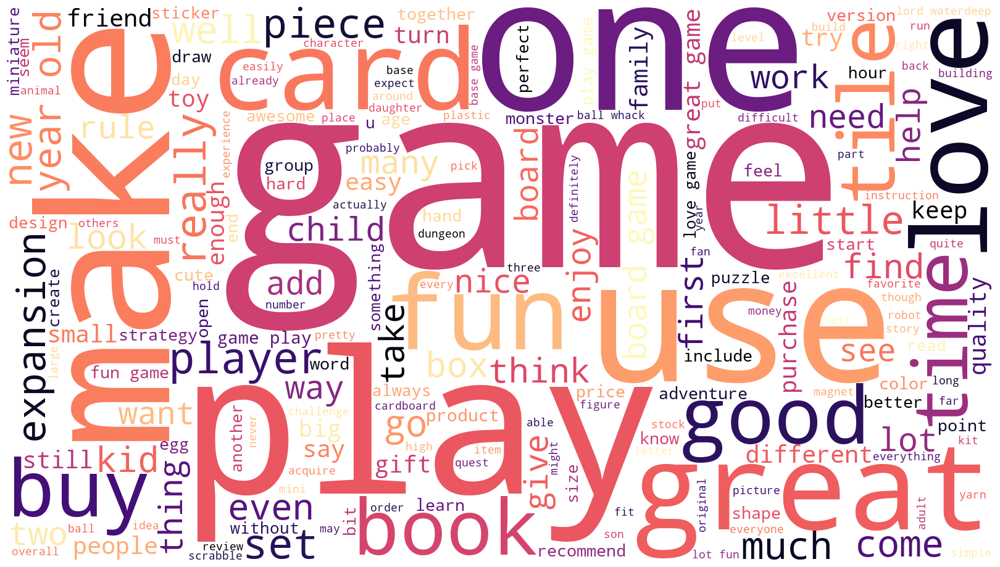

In [511]:
# Create a WordCloud for reviews.
wordcloud = WordCloud(width = 1600, height = 900, 
                background_color ='white', 
                colormap='magma', 
                min_font_size = 10).generate(tokens_string_review) 

# Plot the WordCloud image.                        
plt.figure(figsize = (16, 9), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis('off') 
plt.tight_layout(pad = 0) 

plt.savefig("word_cloud_reviews.png", dpi=500, bbox_inches="tight")

plt.show()

***Interpretation of the word cloud***: Words like "game", "play, and "use" are used the most although this doesn't give us important insights.

#### 2. Create a word cloud for summaries.

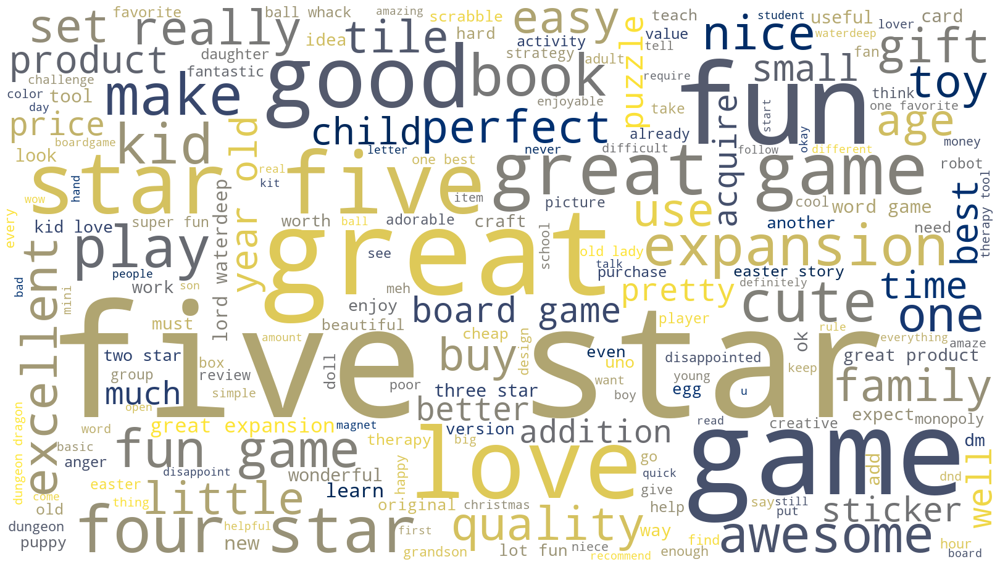

In [514]:
# Create a WordCloud for summaries.
wordcloud = WordCloud(width = 1600, height = 900, 
                background_color ='white', 
                colormap='cividis', 
                min_font_size = 10).generate(tokens_string_summary) 

# Plot the WordCloud image.                        
plt.figure(figsize = (16, 9), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis('off') 
plt.tight_layout(pad = 0) 

plt.savefig("word_cloud_summary.png", dpi=500, bbox_inches="tight")

plt.show()

***Interpretation of the word cloud***: Words like "great", "game", "awesome", "five", and "star" are used a lot. This tells us that positive words are used quite a lot. However, as there are many different words that can be used to convey a positive sentiment, this would be best analysed by calcualting the sentiment scores.

#### 3. What are the 15 most common words in reviews?

In [517]:
# View the 15 most common words in reviews.
# Flatten the list of lemmatized words into a single list.
tokens_review = [word for tokens in reviews_text["lemmatized_review"] for word in tokens]

# Count the frequency of each word
word_counts = Counter(tokens_review)

# Convert to a DataFrame (showing the top 15 most common words)
counts_reviews = pd.DataFrame(word_counts.most_common(15), columns=["Word", "Frequency"]).set_index("Word")

# Preview the DataFrame
print(counts_reviews)

       Frequency
Word            
game        1988
not         1116
play         926
great        600
one          579
love         566
make         565
fun          558
get          529
like         465
card         440
use          439
tile         402
time         364
would        357


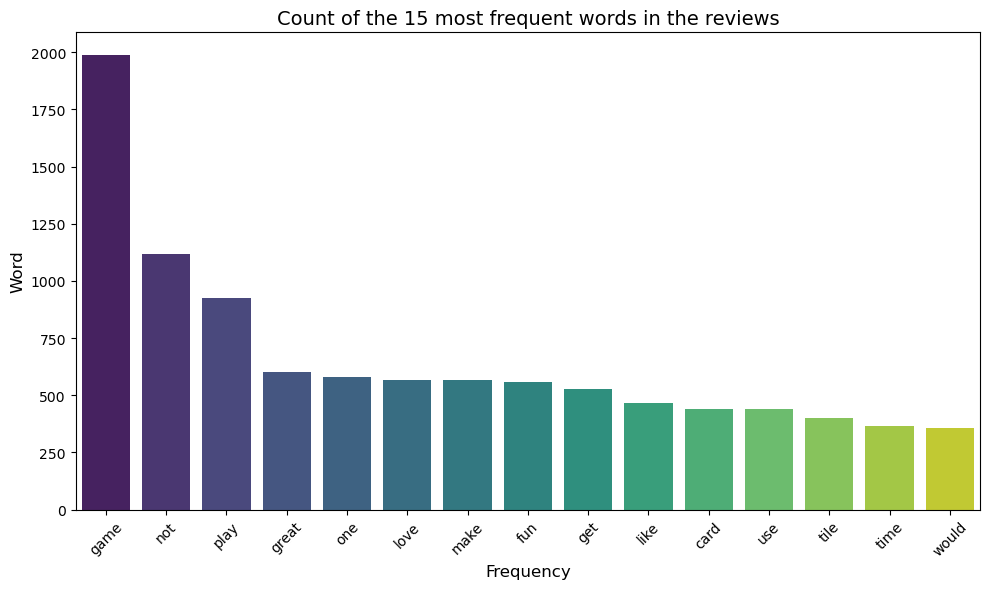

In [518]:
# Plot a horizontal bar chart.
horizontal_bar_plot(counts_reviews, "Frequency", "Word", title="Count of the 15 most frequent words in the reviews", 
                    xlabel="Frequency", ylabel="Word", palette="viridis")

***Interpretation of the plot***: Several positive words used a lot but doesn't tell us much beyond that.

#### 4. What are the 15 most common words in summaries?

In [521]:
# View the 15 most common words in summaries.
# Flatten the list of lemmatized words into a single list.
tokens_summary = [word for tokens in reviews_text["lemmatized_summary"] for word in tokens]

# Count the frequency of each word
word_counts = Counter(tokens_summary)

# Convert to a DataFrame (showing the top 15 most common words)
counts_summary = pd.DataFrame(word_counts.most_common(15), columns=["Word", "Frequency"]).set_index("Word")

# Preview the DataFrame
print(counts_summary)

           Frequency
Word                
star             460
five             363
game             335
great            296
fun              218
love             135
not               98
good              95
expansion         62
four              58
like              56
kid               53
book              46
cute              45
play              45


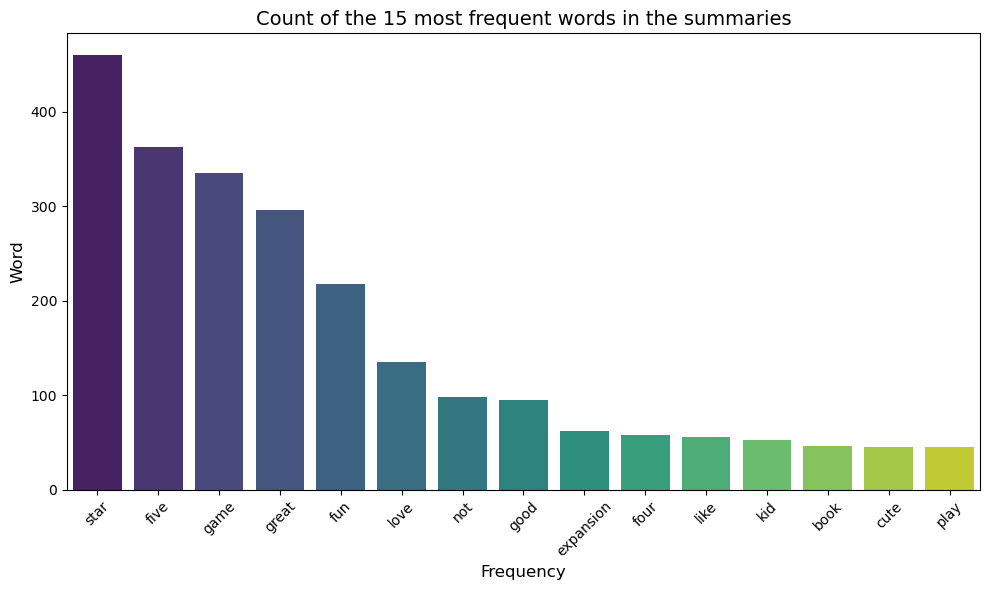

In [522]:
# Plot a horizontal bar chart.
horizontal_bar_plot(counts_summary, "Frequency", "Word", title="Count of the 15 most frequent words in the summaries", 
                    xlabel="Frequency", ylabel="Word", palette="viridis")

***Interpretation of the plot***: Positive words tend to be used a lot but note lots of negative words could be being used but if there is more variety in the range of different words used to display negative sentiment, it wouldn't appear in this bar plot.

***Analysing sentiment***

In [525]:
# Initialise the SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()

# Create function
def analyze_sentiment(text):
    return analyzer.polarity_scores(' '.join(text))

# Use function
reviews_text["sentiment_score_reviews"] = reviews_text["lemmatized_review"].apply(analyze_sentiment)
reviews_text["sentiment_score_summary"] = reviews_text["lemmatized_summary"].apply(analyze_sentiment)

# View reviews_text
reviews_text.head()

,customer_id,gender,age,income_k,spending_score,loyalty_points,education,review,summary,cleaned_review,cleaned_summary,tokens_review,tokens_summary,lemmatized_review,lemmatized_summary,sentiment_score_reviews,sentiment_score_summary
1714,1,Female,17,13.94,40,233,Postgraduate,My son (8) and daughter (11) were and still ar...,Five Stars,son daughter still intrigued toy,five stars,"[son, daughter, still, intrigued, toy]","[five, stars]","[son, daughter, still, intrigue, toy]","[five, star]","{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...","{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound..."
1914,2,Female,17,35.26,54,797,Postgraduate,super for playing quiddler!,Five Stars,super playing quiddler,five stars,"[super, playing, quiddler]","[five, stars]","[super, playing, quiddler]","[five, star]","{'neg': 0.0, 'neu': 0.149, 'pos': 0.851, 'comp...","{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound..."
714,3,Female,17,53.30,48,1071,Postgraduate,These are great quality and super cute! They a...,Love these!,great quality super cute little smaller expect...,love,"[great, quality, super, cute, little, smaller,...",[love],"[great, quality, super, cute, little, small, e...",[love],"{'neg': 0.0, 'neu': 0.327, 'pos': 0.673, 'comp...","{'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound..."
914,3,Female,17,53.30,48,1071,Postgraduate,This is a very good game. We enjoy playing it ...,"Good game, not durable version",good game enjoy playing friends material piece...,good game not durable version,"[good, game, enjoy, playing, friends, material...","[good, game, not, durable, version]","[good, game, enjoy, play, friend, material, pi...","[good, game, not, durable, version]","{'neg': 0.087, 'neu': 0.391, 'pos': 0.522, 'co...","{'neg': 0.0, 'neu': 0.58, 'pos': 0.42, 'compou..."
314,3,Female,17,53.30,48,1071,Postgraduate,These are cute and the instructions are relati...,Cute but creators will be older kids and adult...,cute instructions relatively easy follow altho...,cute creators older kids adults vs younger kids,"[cute, instructions, relatively, easy, follow,...","[cute, creators, older, kids, adults, vs, youn...","[cute, instruction, relatively, easy, follow, ...","[cute, creator, older, kid, adult, v, young, kid]","{'neg': 0.083, 'neu': 0.634, 'pos': 0.283, 'co...","{'neg': 0.0, 'neu': 0.7, 'pos': 0.3, 'compound..."


In [526]:
# Extract individual sentiment scores
reviews_text["neg_review"] = reviews_text["sentiment_score_reviews"].apply(lambda x: x["neg"])
reviews_text["neu_review"] = reviews_text["sentiment_score_reviews"].apply(lambda x: x["neu"])
reviews_text["pos_review"] = reviews_text["sentiment_score_reviews"].apply(lambda x: x["pos"])
reviews_text["compound_review"] = reviews_text["sentiment_score_reviews"].apply(lambda x: x["compound"])

reviews_text["neg_summary"] = reviews_text["sentiment_score_summary"].apply(lambda x: x["neg"])
reviews_text["neu_summary"] = reviews_text["sentiment_score_summary"].apply(lambda x: x["neu"])
reviews_text["pos_summary"] = reviews_text["sentiment_score_summary"].apply(lambda x: x["pos"])
reviews_text["compound_summary"] = reviews_text["sentiment_score_summary"].apply(lambda x: x["compound"])

# View reviews_text
reviews_text.head()

,customer_id,gender,age,income_k,spending_score,loyalty_points,education,review,summary,cleaned_review,...,sentiment_score_reviews,sentiment_score_summary,neg_review,neu_review,pos_review,compound_review,neg_summary,neu_summary,pos_summary,compound_summary
1714,1,Female,17,13.94,40,233,Postgraduate,My son (8) and daughter (11) were and still ar...,Five Stars,son daughter still intrigued toy,...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...","{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.000,1.000,0.000,0.0000,0.0,1.00,0.00,0.0000
1914,2,Female,17,35.26,54,797,Postgraduate,super for playing quiddler!,Five Stars,super playing quiddler,...,"{'neg': 0.0, 'neu': 0.149, 'pos': 0.851, 'comp...","{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.000,0.149,0.851,0.6908,0.0,1.00,0.00,0.0000
714,3,Female,17,53.30,48,1071,Postgraduate,These are great quality and super cute! They a...,Love these!,great quality super cute little smaller expect...,...,"{'neg': 0.0, 'neu': 0.327, 'pos': 0.673, 'comp...","{'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound...",0.000,0.327,0.673,0.9375,0.0,0.00,1.00,0.6369
914,3,Female,17,53.30,48,1071,Postgraduate,This is a very good game. We enjoy playing it ...,"Good game, not durable version",good game enjoy playing friends material piece...,...,"{'neg': 0.087, 'neu': 0.391, 'pos': 0.522, 'co...","{'neg': 0.0, 'neu': 0.58, 'pos': 0.42, 'compou...",0.087,0.391,0.522,0.9393,0.0,0.58,0.42,0.4404
314,3,Female,17,53.30,48,1071,Postgraduate,These are cute and the instructions are relati...,Cute but creators will be older kids and adult...,cute instructions relatively easy follow altho...,...,"{'neg': 0.083, 'neu': 0.634, 'pos': 0.283, 'co...","{'neg': 0.0, 'neu': 0.7, 'pos': 0.3, 'compound...",0.083,0.634,0.283,0.9783,0.0,0.70,0.30,0.4588


In [527]:
# label with overall sentiment for "Positive", "Neutral", and "Negative".
# Create function
def get_sentiment_label(compound):
    if compound >= 0.05:
        return 'Positive'
    elif compound <= -0.05:
        return 'Negative'
    else:
        return 'Neutral'

reviews_text["overall_sentiment_review"] = reviews_text["compound_review"].apply(get_sentiment_label)
reviews_text["overall_sentiment_summary"] = reviews_text["compound_summary"].apply(get_sentiment_label)

# View reviews_text
reviews_text.head()

,customer_id,gender,age,income_k,spending_score,loyalty_points,education,review,summary,cleaned_review,...,neg_review,neu_review,pos_review,compound_review,neg_summary,neu_summary,pos_summary,compound_summary,overall_sentiment_review,overall_sentiment_summary
1714,1,Female,17,13.94,40,233,Postgraduate,My son (8) and daughter (11) were and still ar...,Five Stars,son daughter still intrigued toy,...,0.000,1.000,0.000,0.0000,0.0,1.00,0.00,0.0000,Neutral,Neutral
1914,2,Female,17,35.26,54,797,Postgraduate,super for playing quiddler!,Five Stars,super playing quiddler,...,0.000,0.149,0.851,0.6908,0.0,1.00,0.00,0.0000,Positive,Neutral
714,3,Female,17,53.30,48,1071,Postgraduate,These are great quality and super cute! They a...,Love these!,great quality super cute little smaller expect...,...,0.000,0.327,0.673,0.9375,0.0,0.00,1.00,0.6369,Positive,Positive
914,3,Female,17,53.30,48,1071,Postgraduate,This is a very good game. We enjoy playing it ...,"Good game, not durable version",good game enjoy playing friends material piece...,...,0.087,0.391,0.522,0.9393,0.0,0.58,0.42,0.4404,Positive,Positive
314,3,Female,17,53.30,48,1071,Postgraduate,These are cute and the instructions are relati...,Cute but creators will be older kids and adult...,cute instructions relatively easy follow altho...,...,0.083,0.634,0.283,0.9783,0.0,0.70,0.30,0.4588,Positive,Positive


In [528]:
# label with overall sentiment for "Very positive", "Positive", "Neutral", "Negative", and "Very negative"
# Create function
def get_sentiment_label(compound):
    if compound >= 0.5:
        return "Very positive"
    elif compound >= 0.05:
        return "Positive"
    elif compound <= -0.5:  # Fix: Place this BEFORE the general negative condition
        return "Very negative"
    elif compound < -0.05:   # Fix: Change from `<=` to `<` to avoid conflict
        return "Negative"
    else:
        return "Neutral"

reviews_text["overall_sentiment_review2"] = reviews_text["compound_review"].apply(get_sentiment_label)
reviews_text["overall_sentiment_summary2"] = reviews_text["compound_summary"].apply(get_sentiment_label)

# View reviews_text
reviews_text.head()

,customer_id,gender,age,income_k,spending_score,loyalty_points,education,review,summary,cleaned_review,...,pos_review,compound_review,neg_summary,neu_summary,pos_summary,compound_summary,overall_sentiment_review,overall_sentiment_summary,overall_sentiment_review2,overall_sentiment_summary2
1714,1,Female,17,13.94,40,233,Postgraduate,My son (8) and daughter (11) were and still ar...,Five Stars,son daughter still intrigued toy,...,0.000,0.0000,0.0,1.00,0.00,0.0000,Neutral,Neutral,Neutral,Neutral
1914,2,Female,17,35.26,54,797,Postgraduate,super for playing quiddler!,Five Stars,super playing quiddler,...,0.851,0.6908,0.0,1.00,0.00,0.0000,Positive,Neutral,Very positive,Neutral
714,3,Female,17,53.30,48,1071,Postgraduate,These are great quality and super cute! They a...,Love these!,great quality super cute little smaller expect...,...,0.673,0.9375,0.0,0.00,1.00,0.6369,Positive,Positive,Very positive,Very positive
914,3,Female,17,53.30,48,1071,Postgraduate,This is a very good game. We enjoy playing it ...,"Good game, not durable version",good game enjoy playing friends material piece...,...,0.522,0.9393,0.0,0.58,0.42,0.4404,Positive,Positive,Very positive,Positive
314,3,Female,17,53.30,48,1071,Postgraduate,These are cute and the instructions are relati...,Cute but creators will be older kids and adult...,cute instructions relatively easy follow altho...,...,0.283,0.9783,0.0,0.70,0.30,0.4588,Positive,Positive,Very positive,Positive


#### 5. Create a bar plot for "reviews" showing sentiment

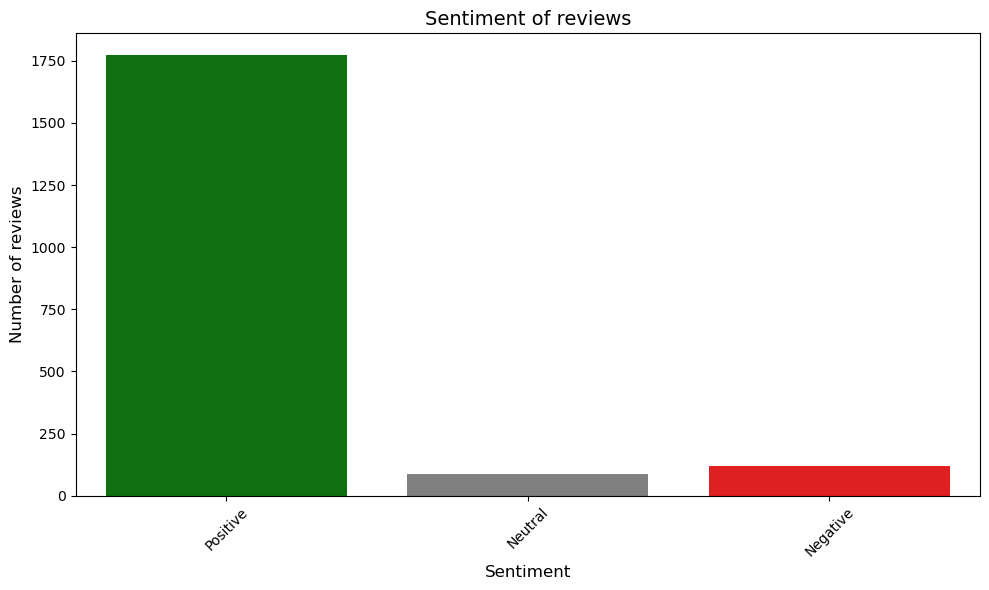

In [530]:
# Create a bar plot for "reviews" showing Positive, Neutral, and Negative sentiment.

# Specify the order.
sentiment_order = ["Positive", "Neutral", "Negative"]

# Specify the palette.
sentiment_palette = {"Positive":"green", "Neutral":"grey", "Negative":"red"}

count_plot(reviews_text, "overall_sentiment_review", title="Sentiment of reviews", 
           xlabel="Sentiment", ylabel="Number of reviews", order=sentiment_order, palette=sentiment_palette)

***Interpretation of the plot***: Mostly positive reviews.

#### 6. Create a bar plot for summaries showing sentiment.

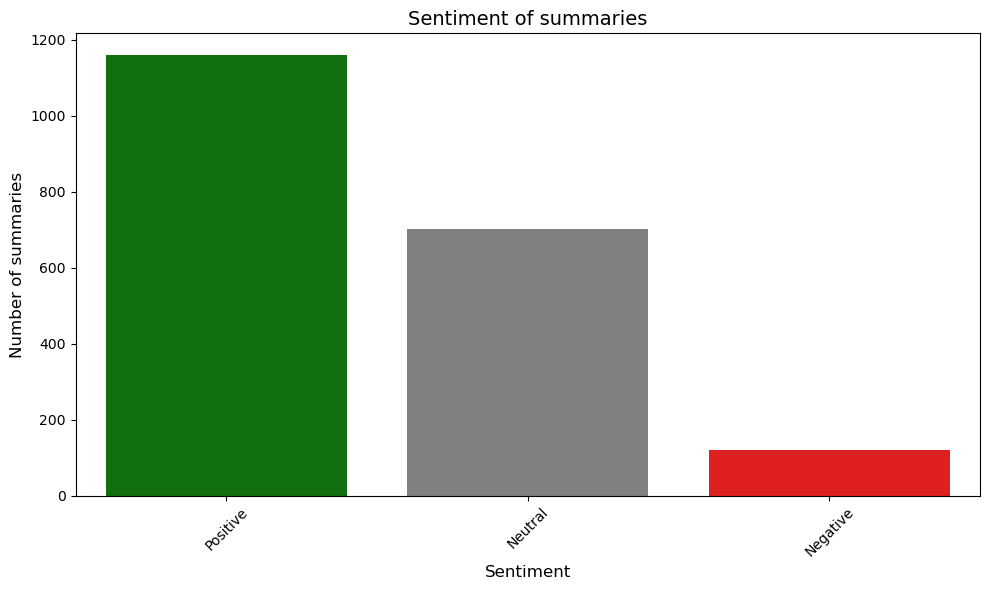

In [533]:
# Create a bar plot for "summary" showing Positive, Neutral, and Negative sentiment.

# Specify the order.
sentiment_order = ["Positive", "Neutral", "Negative"]

# Specify the palette.
sentiment_palette = {"Positive":"green", "Neutral":"grey", "Negative":"red"}

count_plot(reviews_text, "overall_sentiment_summary", title="Sentiment of summaries", 
           xlabel="Sentiment", ylabel="Number of summaries", order=sentiment_order, palette=sentiment_palette)

***Interpretation of the plot***: Significant difference in number of neutral sentiments! Is positivity getting lost when reviews are summarised or perhaps the are lots of words being interpreted as postive as opposed to negative in the reviews which is causing for the compound score to be positive?

I am going to take the reviews data as being more important than the summaries data as the reviews might capture more of the nuance in what the customers feels about the product. We might be missing the detail of sentiment in the summaries.

#### 7. Created a grouped bar plot showing the sentiment for reviews and summaries.

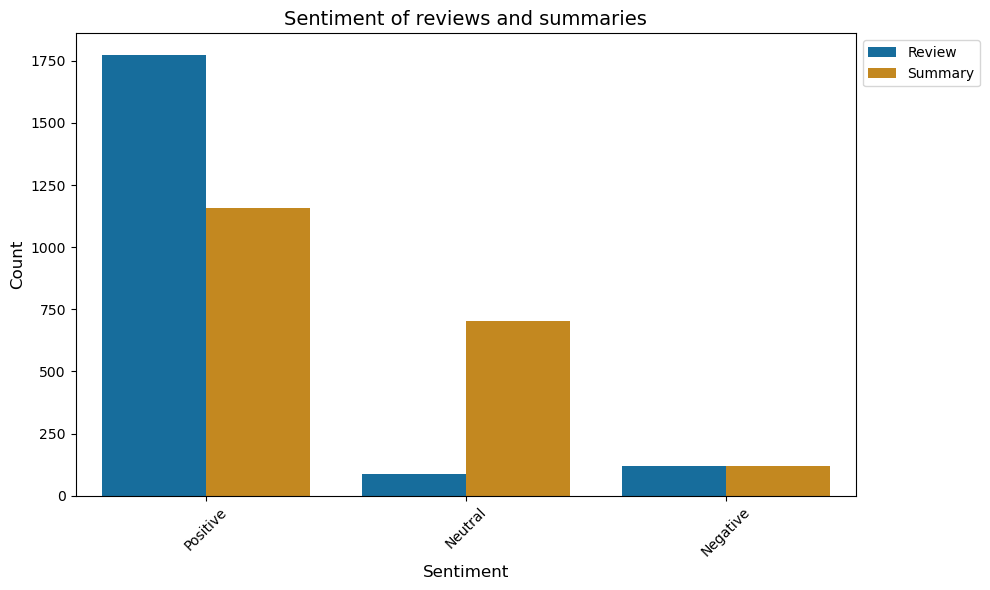

In [536]:
# Create a grouped bar plot showing the sentiment for reviews and summaries.

# Reshape the reviews_text so that reviews and summaries are in a single column and sentiments are in different columns.
reviews_text_melted = reviews_text.melt(value_vars=["overall_sentiment_review", "overall_sentiment_summary"], 
                                        var_name="Category", value_name="Sentiment")

# Rename "overall_sentiment_review" and "overall_sentiment_summary" in this melted dataframe.
# Map column names to labels for better readability
reviews_text_melted["Category"] = reviews_text_melted["Category"].map(
    {"overall_sentiment_review": "Review",
    "overall_sentiment_summary": "Summary"})

# Create grouped bar plot.
grouped_count_plot(reviews_text_melted, "Sentiment", "Category", title="Sentiment of reviews and summaries", 
                 xlabel="Sentiment", ylabel="Count", order=sentiment_order)

Note: I tried to get the "Positive" bars green, "Neutral" grey, and "Negative" red here but nothing worked. But this would have worked better visually.

***Interpretation of the plot***: The plot is the just the other two plots combined.

#### 8. Create a bar plot for reviews showing sentiments (percentages)

In [540]:
# Create a bar plot for "reviews" showing Positive, Neutral, and Negative sentiment (as percentages).

# Work out sentiment percentages.
reviews_sentiment_percentage = reviews_text["overall_sentiment_review"].value_counts().reset_index()
reviews_sentiment_percentage["percentage"] = (reviews_sentiment_percentage["count"]/reviews_sentiment_percentage["count"].sum())*100
reviews_sentiment_percentage

,overall_sentiment_review,count,percentage
0,Positive,1772,89.494949
1,Negative,119,6.010101
2,Neutral,89,4.494949


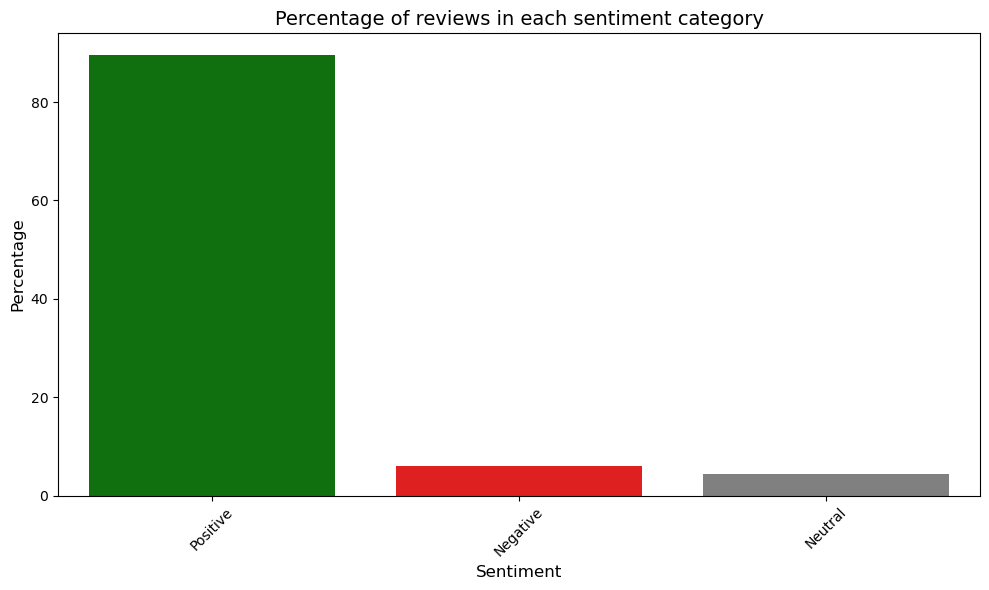

In [541]:
# Create the bar plot.
bar_plot(reviews_sentiment_percentage,"overall_sentiment_review", "percentage", title="Percentage of reviews in each sentiment category",
         xlabel="Sentiment", ylabel="Percentage", order=sentiment_order, palette=sentiment_palette)

***Interpretation of the plot***: Reviews have mostly positive sentiment.

#### 9. Create a bar plot for summaries showing sentiments (percentages)

In [544]:
# Create a bar plot for "summary" showing Positive, Neutral, and Negative sentiment (as percentages).

# Work out sentiment percentages.
summary_sentiment_percentage = reviews_text["overall_sentiment_summary"].value_counts().reset_index()
summary_sentiment_percentage["percentage"] = (summary_sentiment_percentage["count"]/summary_sentiment_percentage["count"].sum())*100
summary_sentiment_percentage

,overall_sentiment_summary,count,percentage
0,Positive,1159,58.535354
1,Neutral,701,35.404040
2,Negative,120,6.060606


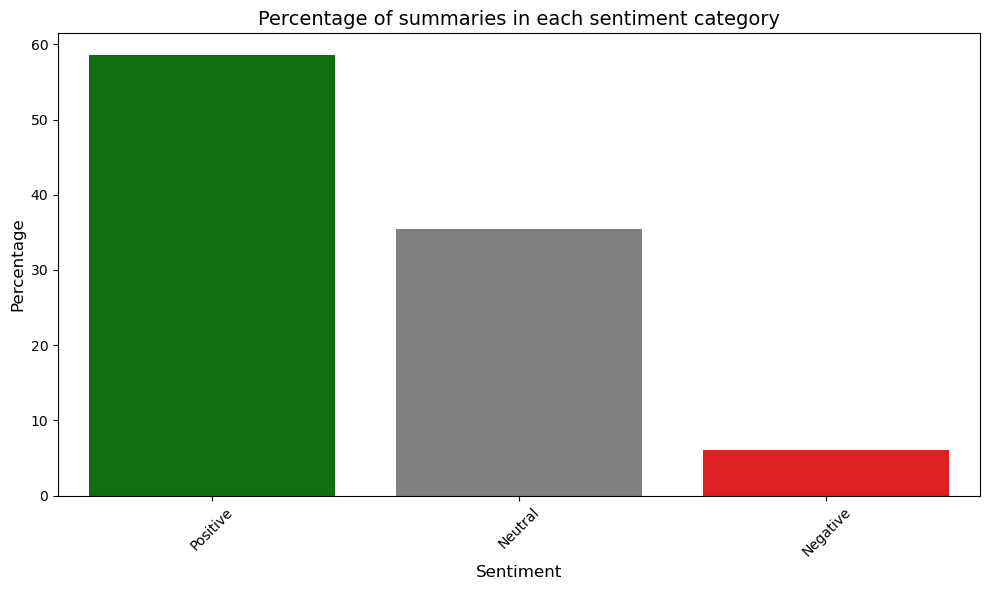

In [545]:
# Create the bar plot.
bar_plot(summary_sentiment_percentage,"overall_sentiment_summary", "percentage", title="Percentage of summaries in each sentiment category",
         xlabel="Sentiment", ylabel="Percentage", order=sentiment_order, palette=sentiment_palette)

***Interpretation of the plot***: Summaries have significantly more neutral sentiment than the reviews.

#### 10. Create a grouped bar chart showing reviews and summaries (percentages)

In [548]:
# Create a grouped bar chart showing reviews and summaries (in percentages).

# View reviews_text_melted
reviews_text_melted.head()

,Category,Sentiment
0,Review,Neutral
1,Review,Positive
2,Review,Positive
3,Review,Positive
4,Review,Positive


In [549]:
# Group by counts
reviews_text_melted_per = reviews_text_melted.groupby(["Category", "Sentiment"]).size().reset_index(name="Counts")
reviews_text_melted_per

,Category,Sentiment,Counts
0,Review,Negative,119
1,Review,Neutral,89
2,Review,Positive,1772
3,Summary,Negative,120
4,Summary,Neutral,701
5,Summary,Positive,1159


In [550]:
# Calculate total counts per category
category_totals = reviews_text_melted_per.groupby("Category")["Counts"].transform("sum")
category_totals

0    1980
1    1980
2    1980
3    1980
4    1980
5    1980
Name: Counts, dtype: int64

In [551]:
# Create a percentage column.
reviews_text_melted_per["Percentage"] = (reviews_text_melted_per["Counts"]/category_totals)*100
reviews_text_melted_per

,Category,Sentiment,Counts,Percentage
0,Review,Negative,119,6.010101
1,Review,Neutral,89,4.494949
2,Review,Positive,1772,89.494949
3,Summary,Negative,120,6.060606
4,Summary,Neutral,701,35.404040
5,Summary,Positive,1159,58.535354


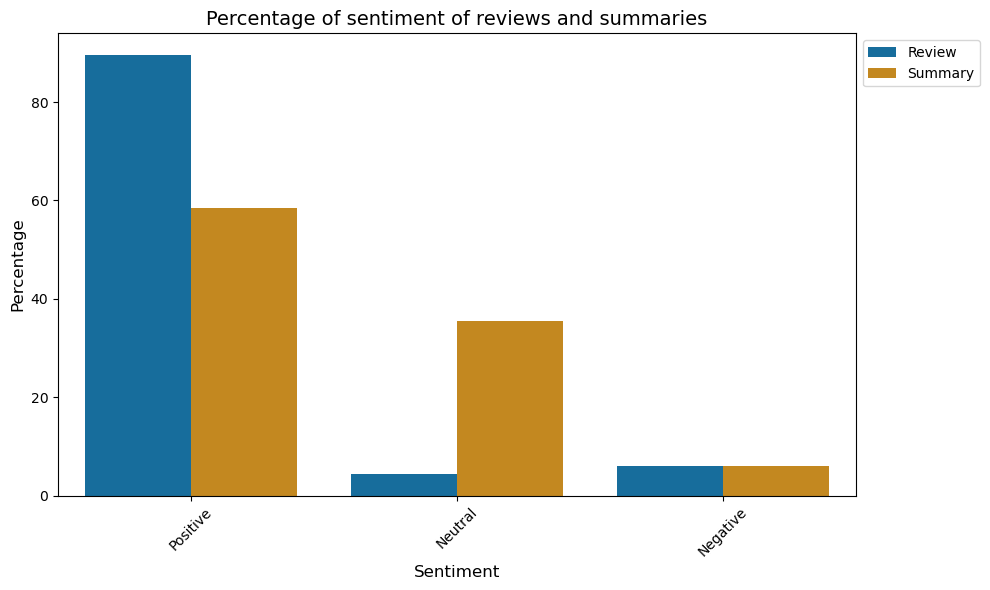

In [552]:
# Create a grouped bar plot showing the sentiment for reviews and summaries (percentages)
grouped_bar_plot(reviews_text_melted_per, "Sentiment", "Percentage", "Category", title="Percentage of sentiment of reviews and summaries", 
                 xlabel="Sentiment", ylabel="Percentage", order=sentiment_order)

***Interpretation of the plot***: This plot combines the previous two plots.

I'm going to create the same charts, but for the five categories of sentiment rather than the 3.

#### 11. Create a bar plot for reviews for the 5 sentiment categories.

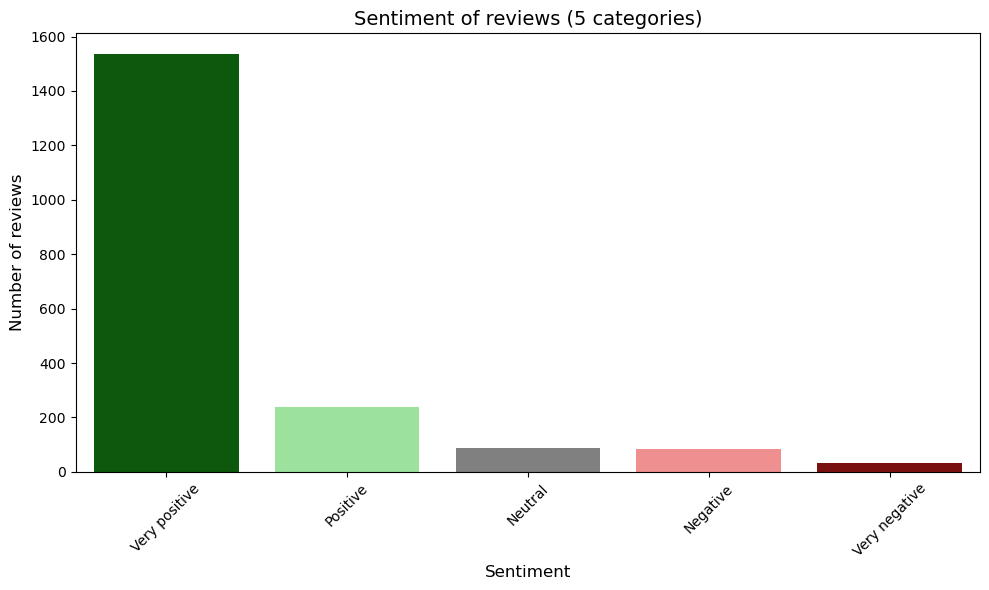

In [556]:
# Create a bar plot for "reviews" showing Very Positive, Positive, Neutral, Negative, Very Negative.

# Specify the order.
sentiment_order2 = ["Very positive", "Positive", "Neutral", "Negative", "Very negative"]

# Specify the palette.
sentiment_palette2 = {"Very positive":"#006400", "Positive":"#90EE90", "Neutral":"grey", "Negative":"#FF7F7F", "Very negative": "#8B0000"}

count_plot(reviews_text, "overall_sentiment_review2", title="Sentiment of reviews (5 categories)", 
           xlabel="Sentiment", ylabel="Number of reviews", order=sentiment_order2, palette=sentiment_palette2)

***Interpretation of the plot***: Most reviews are very positive.

#### 12. Create a bar plot for summaries for the 5 sentiment categories.

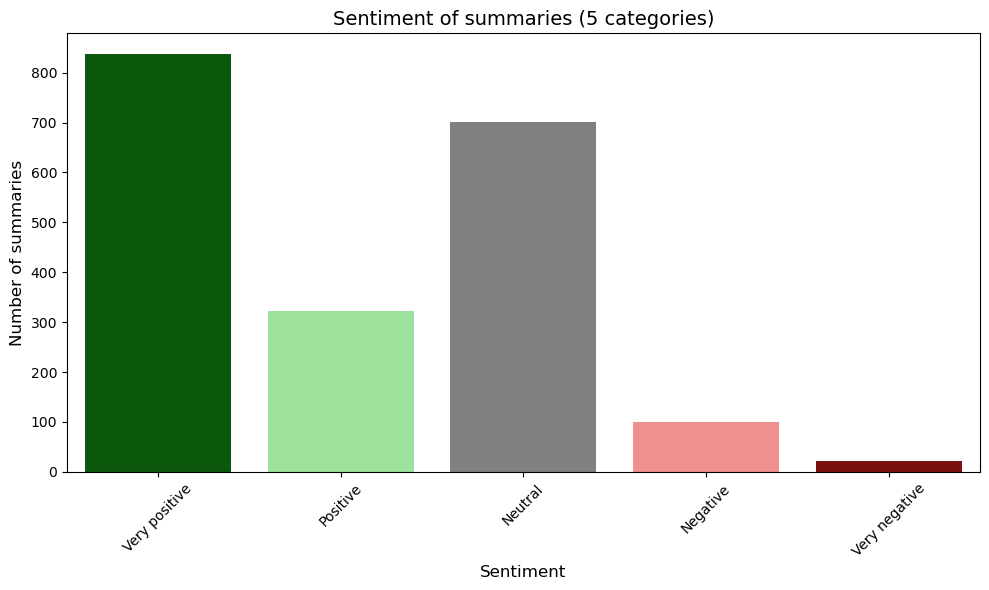

In [559]:
# Create a bar plot for "summary" showing Positive, Neutral, and Negative sentiment.

count_plot(reviews_text, "overall_sentiment_summary2", title="Sentiment of summaries (5 categories)", 
           xlabel="Sentiment", ylabel="Number of summaries", order=sentiment_order2, palette=sentiment_palette2)

***Interpretation of the plot***: Most summaries are very positive or neutral.

#### 13. Create a grouped bar plot for the 5 sentiment categories.

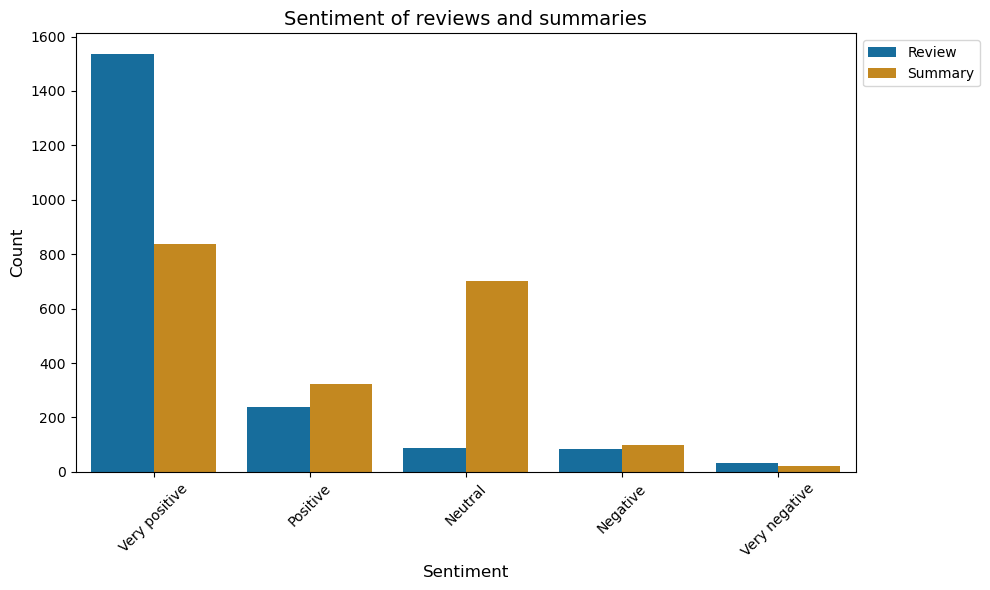

In [562]:
# Create a grouped bar plot showing the sentiment for reviews and summaries.

# Reshape the reviews_text so that reviews and summaries are in a single column and sentiments are in different columns.
reviews_text_melted2 = reviews_text.melt(value_vars=["overall_sentiment_review2", "overall_sentiment_summary2"], 
                                        var_name="Category", value_name="Sentiment")

# Rename "overall_sentiment_review" and "overall_sentiment_summary" in this melted dataframe.
# Map column names to labels for better readability
reviews_text_melted2["Category"] = reviews_text_melted2["Category"].map(
    {"overall_sentiment_review2": "Review",
    "overall_sentiment_summary2": "Summary"})

# Create grouped bar plot.
grouped_count_plot(reviews_text_melted2, "Sentiment", "Category", title="Sentiment of reviews and summaries", 
                 xlabel="Sentiment", ylabel="Count", order=sentiment_order2)

#### 14. Create a bar plot for reviews showing the 5 sentiments (percentages)

In [564]:
# Create a bar plot for "reviews" showing the 5 sentiments (as percentages).

# Work out sentiment percentages.
reviews_sentiment_percentage2 = reviews_text["overall_sentiment_review2"].value_counts().reset_index()
reviews_sentiment_percentage2["percentage"] = (reviews_sentiment_percentage2["count"]/reviews_sentiment_percentage2["count"].sum())*100
reviews_sentiment_percentage2

,overall_sentiment_review2,count,percentage
0,Very positive,1535,77.525253
1,Positive,237,11.969697
2,Neutral,89,4.494949
3,Negative,85,4.292929
4,Very negative,34,1.717172


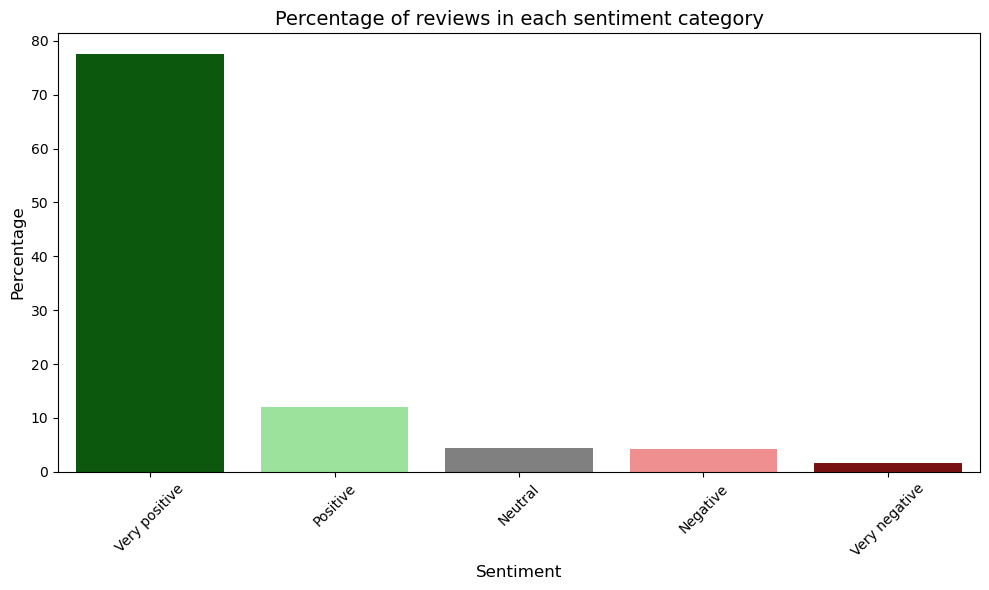

In [565]:
# Create the bar plot.
bar_plot(reviews_sentiment_percentage2,"overall_sentiment_review2", "percentage", title="Percentage of reviews in each sentiment category",
         xlabel="Sentiment", ylabel="Percentage", order=sentiment_order2, palette=sentiment_palette2)

#### 15. Create a bar plot for summaries showing the 5 sentiments (percentages)

In [567]:
# Create a bar plot for "summary" showing the five sentiments (as percentages).

# Work out sentiment percentages.
summary_sentiment_percentage2 = reviews_text["overall_sentiment_summary2"].value_counts().reset_index()
summary_sentiment_percentage2["percentage"] = (summary_sentiment_percentage2["count"]/summary_sentiment_percentage2["count"].sum())*100
summary_sentiment_percentage2

,overall_sentiment_summary2,count,percentage
0,Very positive,837,42.272727
1,Neutral,701,35.404040
2,Positive,322,16.262626
3,Negative,99,5.000000
4,Very negative,21,1.060606


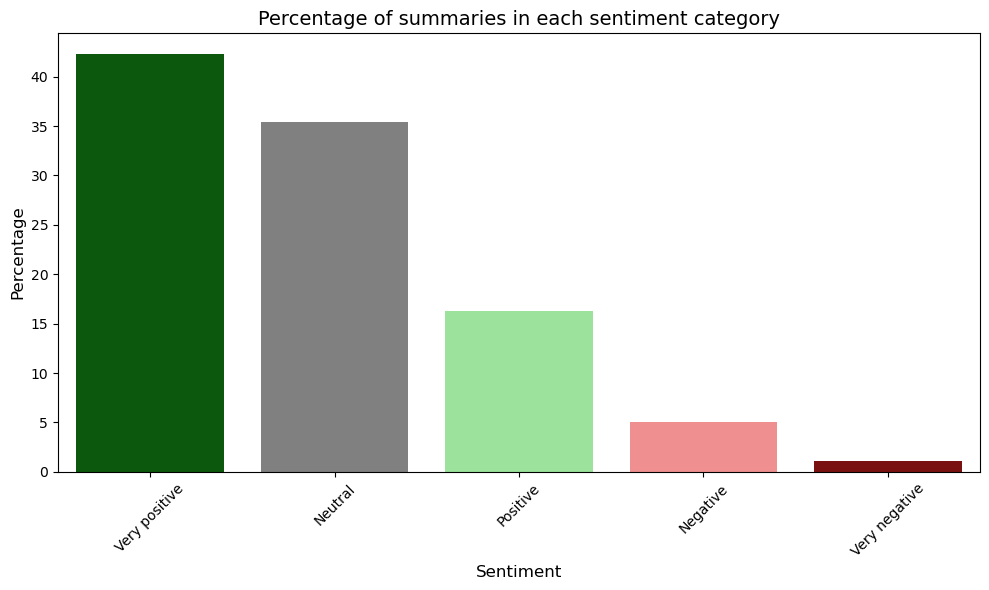

In [568]:
# Create the bar plot.
bar_plot(summary_sentiment_percentage2,"overall_sentiment_summary2", "percentage", title="Percentage of summaries in each sentiment category",
         xlabel="Sentiment", ylabel="Percentage", order=sentiment_order2, palette=sentiment_palette2)

#### 16. Create a grouped bar plot showing the 5 sentiments (percentages)

In [570]:
# Create a grouped bar chart showing reviews and summaries (in percentages).

# View reviews_text_melted
reviews_text_melted2.head()

,Category,Sentiment
0,Review,Neutral
1,Review,Very positive
2,Review,Very positive
3,Review,Very positive
4,Review,Very positive


In [571]:
# Group by counts
reviews_text_melted_per2 = reviews_text_melted2.groupby(["Category", "Sentiment"]).size().reset_index(name="Counts")
reviews_text_melted_per2

,Category,Sentiment,Counts
0,Review,Negative,85
1,Review,Neutral,89
2,Review,Positive,237
3,Review,Very negative,34
4,Review,Very positive,1535
5,Summary,Negative,99
6,Summary,Neutral,701
7,Summary,Positive,322
8,Summary,Very negative,21
9,Summary,Very positive,837


In [572]:
# Calculate total counts per category
category_totals = reviews_text_melted_per2.groupby("Category")["Counts"].transform("sum")
category_totals

0    1980
1    1980
2    1980
3    1980
4    1980
5    1980
6    1980
7    1980
8    1980
9    1980
Name: Counts, dtype: int64

In [573]:
# Create a percentage column.
reviews_text_melted_per2["Percentage"] = (reviews_text_melted_per2["Counts"]/category_totals)*100
reviews_text_melted_per2

,Category,Sentiment,Counts,Percentage
0,Review,Negative,85,4.292929
1,Review,Neutral,89,4.494949
2,Review,Positive,237,11.969697
3,Review,Very negative,34,1.717172
4,Review,Very positive,1535,77.525253
5,Summary,Negative,99,5.000000
6,Summary,Neutral,701,35.404040
7,Summary,Positive,322,16.262626
8,Summary,Very negative,21,1.060606
9,Summary,Very positive,837,42.272727


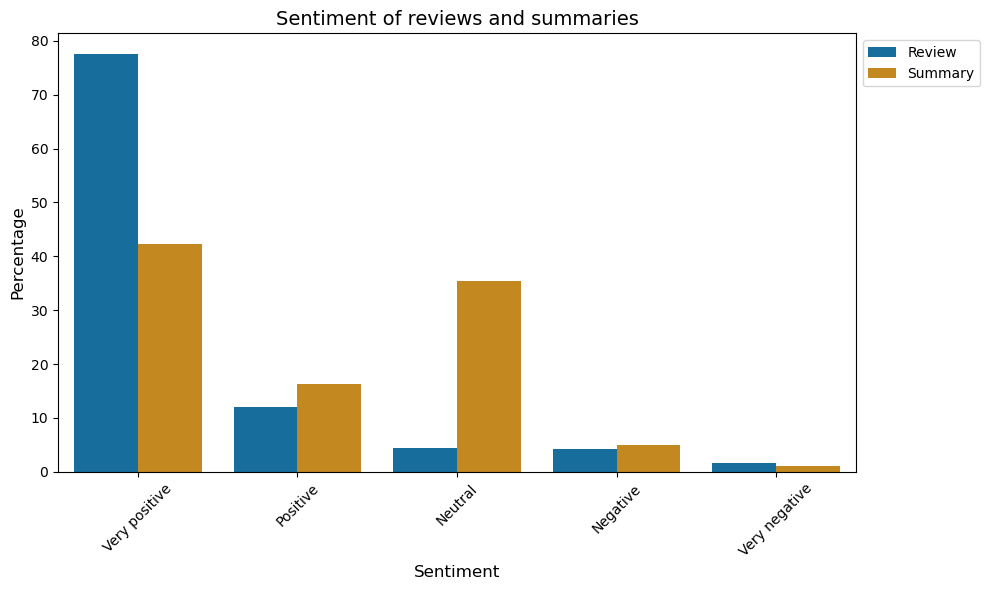

In [574]:
# Create a grouped bar plot showing the sentiment for reviews and summaries (percentages)
grouped_bar_plot(reviews_text_melted_per2, "Sentiment", "Percentage", "Category", title="Sentiment of reviews and summaries", 
                 xlabel="Sentiment", ylabel="Percentage", order=sentiment_order2)

#### 17. View the top 10 most positive reviews.

In [576]:
# View the top 10 most positive reviews. Are these actually positive?
top_10_reviews = reviews_text.sort_values(by="compound_review", ascending=False).head(10)
pd.set_option('display.max_colwidth', None)
display(top_10_reviews[["review"]])

review
1121                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      Disclaimer: Bought this from a local store. Paid list value, but supporting local game stores helps keep them in business, and it's a rough market to keep a gaming store running. Also, I do not own, nor have I played&nbsp;<a data-hook="product-link-linked" class="a-link-normal" href="/Dungeons-Dragons-Castle-Ravenloft-Board-Game/dp/0786955570/ref=cm_cr_arp_d_rvw_txt?ie=UTF8">Dungeons & Dragons: Castle Ravenloft Board Game</a>, the first D&D Adventures Board Game. Regardless...\n\nDungeons & Dragons: Wrath of Ashardalon Board Game (WoA) is a fantastic value at $65 (list). You get 42 (plastic, unpainted) minis (1" scale), you get a nice set of cardboard interlocking(!) dungeon tiles, and you get a fun, very random, board game playable either by yourself or with up to 4 friends.\n\nWhat it is:\nWoA is, in gamer terms, a roguelike in tabletop form. In layman's terms, WoA is a dungeon crawler. You start at the entrance, and have a specific goal (rescue the villagers, survive the dungeon, destroy the altar, slay the dragon). The adventures are built randomly based on shuffling the tiles, and they are played individually as you explore. You can go for a massive linear dungeon based on a little luck and careful planning, or you can attempt to condense yourself in a larger swarm interconnected tunnels.\n\nSome of the adventures feature "chambers", special larger rooms that are all placed at once and filled with enemies and a specific goal that the team must complete to win the adventure.\n\nIt's a great way to introduce someone into tabletop roleplaying gaming, it's the perfect medium between a board game and an actual pen and paper RPG.\n\nIt's a fun, quick* game to run a quick adventure for some friends taking anywhere between 20 minutes and an hour per adventure.\n\nWhat it isn't:\nA deeper rolepla

Yes, these are generally positive, although there is nuance in there.

#### 18. View the top 10 most negative reviews.

In [579]:
# View the top 10 most negative reviews. Are these actually negative?
bottom_10_reviews = reviews_text.sort_values(by="compound_review", ascending=True).head(10)
pd.set_option('display.max_colwidth', None)
display(bottom_10_reviews[["review"]])

,review
1559,"The One Ring is a very innovative RPG set in Middle Earth between the time of The Hobbit and The Lord of the Rings.\n\nIn order to play it you need occasional reference to die rolls. Specifically, you need a 12 sided die (Called a D12 by the cognoscenti) and up to six regular six sided dice (D6). The game comes with one set, but you will likely need more.\n\nThat's what you get in this boxed set: One D12 Feat Die, six D6, all in a black/dark gray on off-white color scheme. I asked about different colors when I bought my set and was told that there are no alternatives to this one. Oh well.\n\nWhy can't you use ""ordinary"" dice of that type? You can. You'll need a crib sheet to make the D12 into a proper ""Feat Die"" but other than that you are good to go.\n\nWhy bother with these expensive dice then? Well, the D12 Feat Die is properly marked up with opposed faces for the Eye and Gandalf runes for one. That matters to some people. If you use some D12 you have lying around you'll be using the ""11"" and ""12"" faces for those special results and they aren't going to be on opposed faces of the die. Big furry deal, right? But of course, everyone had better be using the *same* faces for those runes if there isn't going to be an almighty real-world fight at some point. The real die avoids this issue.\n\nAlso, the D6s are marked up so you can quickly tell the ""1"",""2"" and ""3"" faces from the ""4"",""5"" and ""6"" faces which makes evaluating successes very quick indeed. Not only that, the ""6"" face has a special meaning sometimes and it is elaborated upon with even more detail making for unambiguous and easy recognition of that event, should it occur.\n\nNone of these are show-stoppers for using non-specialized dice, but consider: if you introduce a lot of new players to a One Ring game, how much easier is it to explain the mechanics of the die conventions if you are using this set? A convention GM would consider these money well spent I think. I do.\n\nBesides, you should use the right dice for the job or you will annoy and vex the Dice Gods. Nothing good comes of such reckless behavior."
363,"I found that this card game does the opposite of what it was intended for. It actually has the kids focusing on ways to get angry, etc. instead of teaching how to be calm and act better. It really should have been tested before sale. A better game would have been Calm Dragon. I tried this game on kids that had absolutely no behavior or anger problems and they began behaving badly and getting angry after the second round. I don't recommend this. I am a therapist and I work with kids with anger issues all day long, I thought this might be a good tool... I was wrong."
882,"A crappy cardboard ghost of the original. Hard to believe they did this, but they did. Shame on Hasbro. Disgusting."
13,"This is one of the worst games I have ever played. You basically have to come up with puns on the spot. Not only are puns generally pretty bad, you have to generate puns that are worse than your run of the mill groaners. I can't imagine many people enjoying it, but it is slow paced and generally does not generate any level of enjoyment unless you're very skilled with the English language."
1100,"Hated this product.\n\nPredictable. Not fun. It attempts to be a fast setup table top game but feels as a meshed together mess of crap. Often times I thought ""this seems like d&d battle.... Just kidding"". We never played it again after one play through.\n\nWould not recommend this for an older gaming group that enjoys board/card ga,es like talisman and 7 wonders and ascension.\n\nF"
426,"It's Uno with questions about anger. It's an okay way to discuss anger, but it gets repetitive and the students start to get bored after about half a round."
281,"I bought this thinking it would be really fun , but I was disappointed . It's really messy and it isn't nearly as easy as it seems. Also, the glue is useless.\nFor a 9 year old the instructions are very 

***Note: Number 1797 is actually positive! I'm going to check it's compound score.***

In [581]:
# View column 1797.
reviews_text.loc[1797]

customer_id                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              554
gender                                                                     

We can see here that this review was put as a very negative review with a compound score of -0.8481 as the person writing the review was talking about how it was useful for pain management. The reference to pain, illness, suffering, and anxiety, gave a high negative score.

#### 19. Test the accuracy of the model

I will select a random 20 rows, manually add which sentiment I think it is, then calculate the percentage which are the same as the model predicted. I will do this with the 3 categories of sentiment (Positive, Neutral, and Negative) because it would be difficult for me to assess the difference between, for example, Very positive and Positive.

In [585]:
# Select 20 random reviews
random_20_reviews = reviews_text.sample(n=20, random_state=42)
display(random_20_reviews)

,customer_id,gender,age,income_k,spending_score,loyalty_points,education,review,summary,cleaned_review,...,pos_review,compound_review,neg_summary,neu_summary,pos_summary,compound_summary,overall_sentiment_review,overall_sentiment_summary,overall_sentiment_review2,overall_sentiment_summary2
169,563,Male,34,71.34,63,2993,Graduate,"My daughter is a huge fan of Klutz books and couldn't wait to get her hands on Pom-Pom Puppies. She made a Chihuahua, a Dalmation and a few mutts and they're getting cuter and cuter. The directions are really good (it can be challenging for an 8 year old to cut the yarn). I highly recommend this as a present to any kid who loves dogs, the results are really cute.",My Daughter Adores this Book,daughter huge fan klutz books could not wait get hands pom pom puppies made chihuahua dalmation mutts getting cuter cuter directions really good challenging year old cut yarn highly recommend present kid loves dogs results really cute,...,0.461,0.9663,0.000,0.435,0.565,0.3818,Positive,Positive,Very positive,Positive
631,22,Female,23,24.60,73,944,Graduate,Eggs split and were unusable.,Disappointed.,eggs split unusable,...,0.000,0.0000,1.000,0.000,0.000,-0.4767,Neutral,Negative,Neutral,Negative
1725,139,Female,33,16.40,79,850,Graduate,"Love it. The best toy so far. I got it for my 4 year old, but I often play with it.",Great toy,love best toy far got year old often play,...,0.643,0.8957,0.000,0.196,0.804,0.6249,Positive,Positive,Very positive,Very positive
255,663,Male,45,35.26,41,1062,Graduate,Very cute. A bit difficult for my 10 yr old daughter but with a little help she is getting the hang of it. Had to show her how to make the pom poms first and now she is doing okay. Product is very cute but I will say they don't provide enough yarn so be sure to have some extra on hand.,Fun and cute,cute bit difficult yr old daughter little help getting hang show make pom poms first okay product cute say not provide enough yarn sure extra hand,...,0.424,0.9063,0.000,0.000,1.000,0.7430,Positive,Positive,Very positive,Very positive
1298,679,Male,46,50.02,42,1548,Graduate,This is just da bomb board game. Lords of Waterdeep is my fave board game and this expansion adds so much. The corruption tokens and the new spaces really open up a lot of possibilities for the game and enhance the play. I've gotten all my friends hooked so I'll probably be purchasing more of this as gifts in the future!,Da Bomb Game,da bomb board game lords waterdeep fave board game expansion adds much corruption tokens new spaces really open lot possibilities game enhance play gotten friends hooked probably purchasing gifts future,...,0.288,0.8020,0.615,0.385,0.000,-0.4939,Positive,Negative,Very positive,Negative
1632,706,Male,52,44.28,48,1574,PhD,"My son who is 3 loves this puzzle. It's simple enough for himm, with 20 pieces, and the train styling is a good visual of a number line. TPut a train and animals and counting numbers together for a 3 year old boy and it's heaven!",A LOOOOOOONG TRAIN,son loves puzzle simple enough himm pieces train styling good visual number line tput train animals counting numbers together year old boy heaven,...,0.419,0.9001,0.000,1.000,0.000,0.0000,Positive,Neutral,Very positive,Neutral
991,181,Female,34,84.46,69,3880,Completed school,"With tons of replay value, this tense, cooperative adventure has quickly became one of my favorite casual games. You would think that, without a DM, the pacing wouldn't flow, but the designers were clever in forcing you to keep exploring to avoid hazards and traps. You never know what could be slithering around the corner.\n\nWhat I love is how customizable it is. Yes, you should follow the rules to a T, but you can also shuffle in pieces from other D&D board games like Castle Ravenloft and Legend of Drizzt. Doing so can create massive mazes of randomized monsters. If you're getting even more invested, create your own heroes and villains from scratch by rolling in Reaper or other mini figures. You a

In [586]:
# Add my interpretation of the reviews in a new column "my_sentiment_score"

# Map my scores.
scores = {
    169:"Positive",
    631:"Negative",
    1725:"Positive",
    255:"Positive",
    1298:"Positive",
    1632:"Positive",
    991:"Positive",
    269:"Positive",
    1126:"Positive",
    1635:"Positive",
    233:"Positive",
    1906:"Positive",
    987:"Positive",
    1335:"Positive",
    1530:"Neutral",
    651:"Positive",
    825:"Positive",
    490:"Neutral",
    1586:"Positive",
    828:"Positive"}

# Create a "my_sentiment_score" column.
random_20_reviews["my_sentiment_score"] = random_20_reviews.index.map(scores)

# View "review", "overall_sentiment_review", and "my_sentiment_score"
display(random_20_reviews[["review", "overall_sentiment_review", "my_sentiment_score"]])

,review,overall_sentiment_review,my_sentiment_score
169,"My daughter is a huge fan of Klutz books and couldn't wait to get her hands on Pom-Pom Puppies. She made a Chihuahua, a Dalmation and a few mutts and they're getting cuter and cuter. The directions are really good (it can be challenging for an 8 year old to cut the yarn). I highly recommend this as a present to any kid who loves dogs, the results are really cute.",Positive,Positive
631,Eggs split and were unusable.,Neutral,Negative
1725,"Love it. The best toy so far. I got it for my 4 year old, but I often play with it.",Positive,Positive
255,Very cute. A bit difficult for my 10 yr old daughter but with a little help she is getting the hang of it. Had to show her how to make the pom poms first and now she is doing okay. Product is very cute but I will say they don't provide enough yarn so be sure to have some extra on hand.,Positive,Positive
1298,This is just da bomb board game. Lords of Waterdeep is my fave board game and this expansion adds so much. The corruption tokens and the new spaces really open up a lot of possibilities for the game and enhance the play. I've gotten all my friends hooked so I'll probably be purchasing more of this as gifts in the future!,Positive,Positive
1632,"My son who is 3 loves this puzzle. It's simple enough for himm, with 20 pieces, and the train styling is a good visual of a number line. TPut a train and animals and counting numbers together for a 3 year old boy and it's heaven!",Positive,Positive
991,"With tons of replay value, this tense, cooperative adventure has quickly became one of my favorite casual games. You would think that, without a DM, the pacing wouldn't flow, but the designers were clever in forcing you to keep exploring to avoid hazards and traps. You never know what could be slithering around the corner.\n\nWhat I love is how customizable it is. Yes, you should follow the rules to a T, but you can also shuffle in pieces from other D&D board games like Castle Ravenloft and Legend of Drizzt. Doing so can create massive mazes of randomized monsters. If you're getting even more invested, create your own heroes and villains from scratch by rolling in Reaper or other mini figures. You also get a horde of miniature figurines that would otherwise cost $50 so the value is well worth it.\n\nI only wish I'd found out about these games sooner.",Positive,Positive
269,"Adorable book with easy to follow instructions, great gift for young girl approx 8-10 years old.",Positive,Positive
1126,"As a long-time collector of Dungeon Tiles I can say without reservation that this is the best collection yet published. True, most of the tiles are recycled from old sets (all of them as far as I can tell), but with such a low price, a full ten sheets of durable double-sided tiles, and the incredibly handsome and even useful box, the new Essentials line of Dungeon Tiles outshines every past edition.\n\nWhat is this thing?:\nDungeon Tiles are handsomely detailed pre-printed heavy cardstock 'pieces' that you can use to cobble together a map for wargames. In this case the tiles are sized for D&D miniatures (~25-30mm), with the grid spacing hovering around an inch. The Dungeon Tiles sets include a whole pile of tiles representing rooms, corridors, furniture, traps, and the like.\n\nThe Tiles:\nThe Dungeon Tiles Master Set - The Dungeon contains a smrgsbord (a lot!) of tiles collected from previous editions, enough to build a respectable multi-room dungeon out of. With a full ten sheets of double-sided tiles this is the biggest single collection published.\n\nThe Box:\nIn addition, the oversized box the tiles ship in provides superior protection to the tiles within, in addition to being a giant tile itself (the box is printed like a dungeon plinth and made from the same materials as the tiles themselves). The box is easily big enough to store any loose tiles you might have collected from previous sets too, at least twice as thick as necessary for the prod

In [587]:
# Calculate the accuracy of the model.
# Count the number of matching values
matches = (random_20_reviews["overall_sentiment_review"] == random_20_reviews["my_sentiment_score"]).sum()

# Calculate the percentage
percentage_match = (matches / 20) * 100

print(f"Accuracy score: {percentage_match:.2f}%")

Accuracy score: 80.00%


Note that this accuracy score is approximate. If I had selected a different random sample, I could get a lower or higher score.

In [589]:
reviews_text.head(1)

,customer_id,gender,age,income_k,spending_score,loyalty_points,education,review,summary,cleaned_review,...,pos_review,compound_review,neg_summary,neu_summary,pos_summary,compound_summary,overall_sentiment_review,overall_sentiment_summary,overall_sentiment_review2,overall_sentiment_summary2
1714,1,Female,17,13.94,40,233,Postgraduate,My son (8) and daughter (11) were and still are intrigued by this toy,Five Stars,son daughter still intrigued toy,...,0.0,0.0,0.0,1.0,0.0,0.0,Neutral,Neutral,Neutral,Neutral


#### 20. Create a bar plot showing the distribution of compound scores

I'm only doing this with reviews, not summaries, as the review scores are probably more likely to be accurate as they go inot more detail about what the customer actually thought about the product.

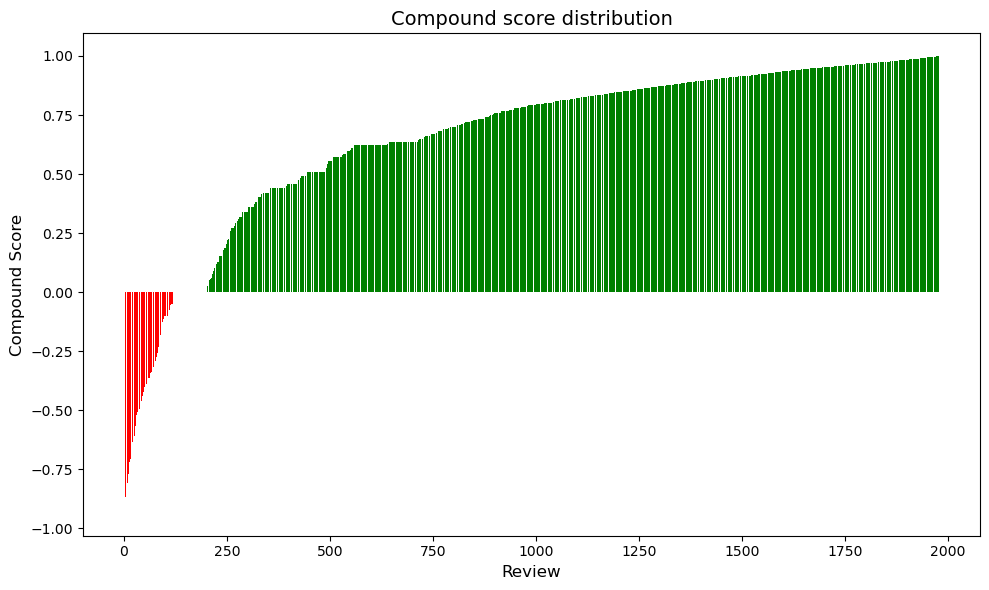

In [592]:
# Create a bar plot showing the distribution of compound scores. Bars with values less than 1 go down, above 1 go up.

# Sort the DataFrame by compound_score in ascending order
reviews_text = reviews_text.sort_values(by="compound_review", ascending=True)

# Reset the index to avoid gaps based on the original index
reviews_text = reviews_text.reset_index(drop=True)

# Plot the bar plot
plt.figure(figsize=(10, 6))
plt.bar(reviews_text.index, reviews_text["compound_review"], color=["red" if x < 0 else "green" for x in reviews_text["compound_review"]])

# Set labels and title
plt.title("Compound score distribution", fontsize=14)
plt.xlabel("Review", fontsize=12)
plt.ylabel("Compound Score", fontsize=12)

# Show the plot
plt.tight_layout()

plt.savefig("compound_score_distribution.png", dpi=500, bbox_inches="tight")

plt.show()

***Interpretation of the plot***: Most reviews have positive sentiment.

#### 21. Is there any correlation between loyalty points and compound scores?

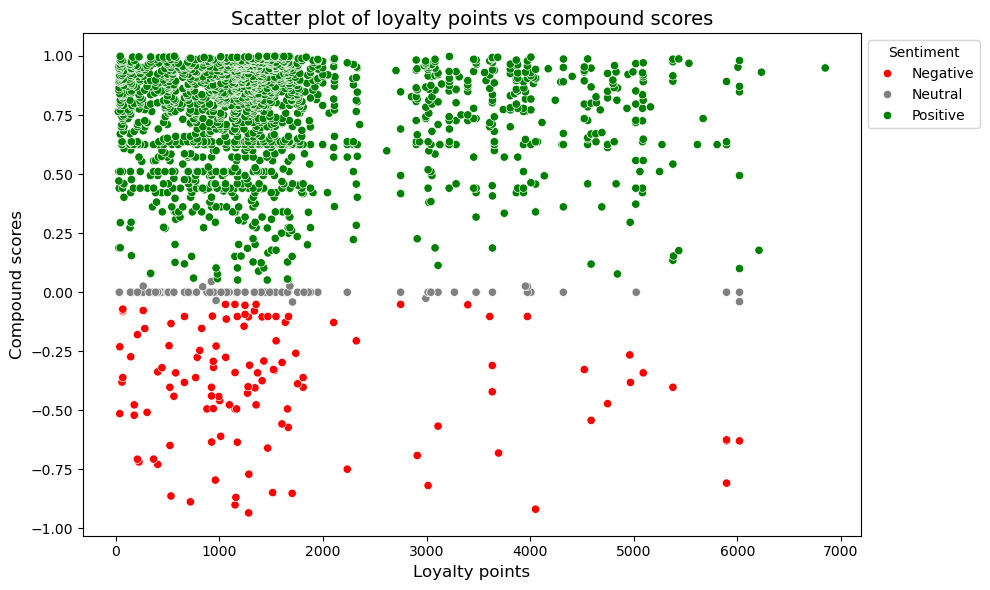

In [595]:
# Create a scatterplot for loyalty points and compound reviews.
scatter_plot(reviews_text, "loyalty_points", "compound_review", title="Scatter plot of loyalty points vs compound scores", 
             xlabel="Loyalty points", ylabel="Compound scores", hue="overall_sentiment_review",
             palette=sentiment_palette, legend_title="Sentiment")

***Interpretation of the plot:*** Doesn't seem to be much correlation.

#### 22. Is there any correlation between income and compound scores?

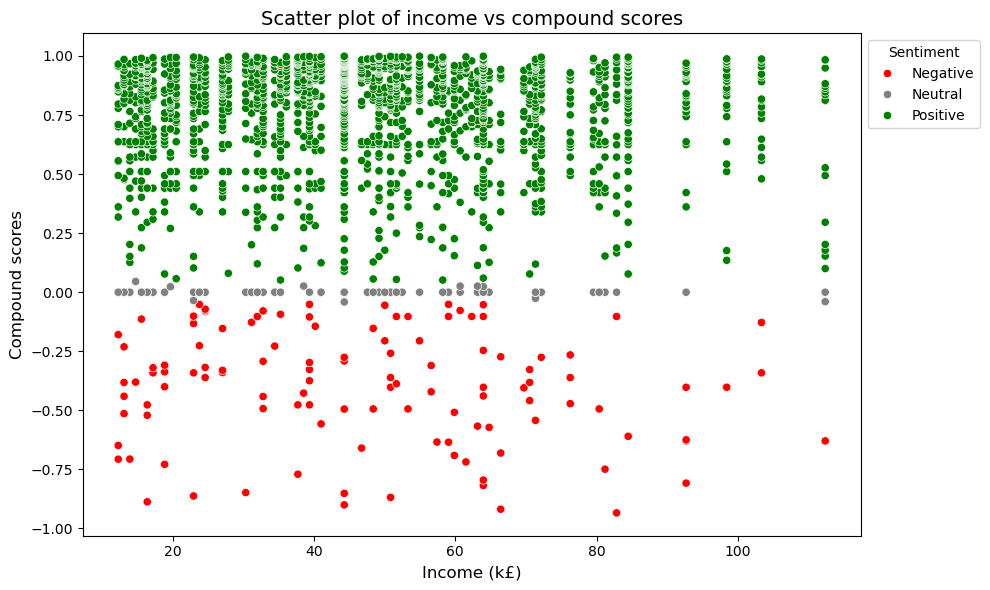

In [598]:
# Create a scatterplot for income and compound reviews.
scatter_plot(reviews_text, "income_k", "compound_review", title="Scatter plot of income vs compound scores", 
             xlabel="Income (k£)", ylabel="Compound scores", hue="overall_sentiment_review",
             palette=sentiment_palette, legend_title="Sentiment")

***Interpretation of the plot:*** Doesn't seem to be much correlation.

#### 23. Is there any correlation between age and compound scores?

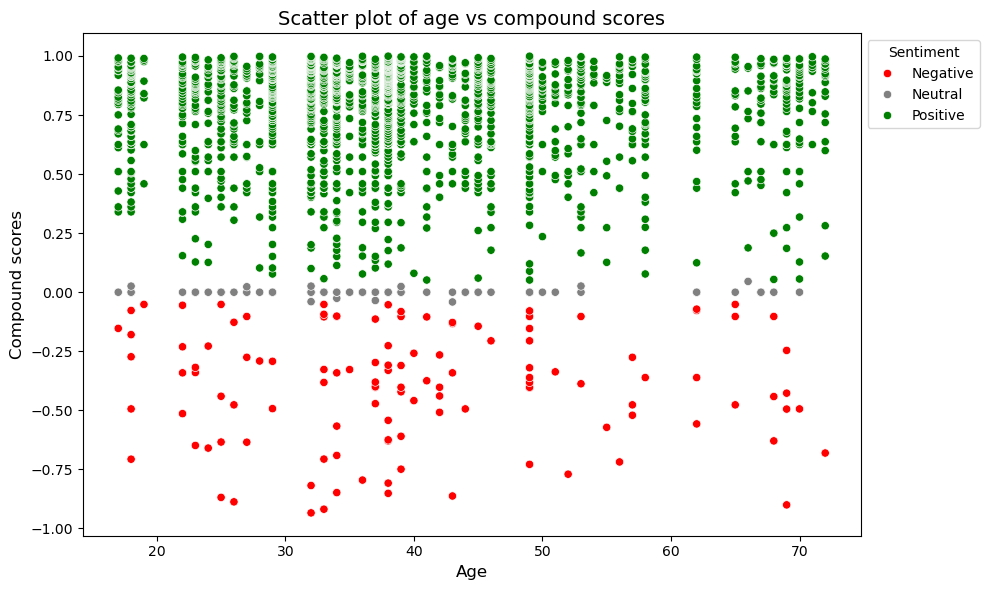

In [601]:
# Create a scatterplot for age and compound reviews.
scatter_plot(reviews_text, "age", "compound_review", title="Scatter plot of age vs compound scores", 
             xlabel="Age", ylabel="Compound scores", hue="overall_sentiment_review",
             palette=sentiment_palette, legend_title="Sentiment")

***Interpretation of the plot:*** Doesn't seem to be much correlation.

#### 24. Create a grouped bar chart for sentiment scores by gender.

In [604]:
# Select just "gender" and "overall_sentiment_review" column.
reviews_text_gender = reviews_text[["gender", "overall_sentiment_review"]]
reviews_text_gender

,gender,overall_sentiment_review
0,Female,Negative
1,Female,Negative
2,Male,Negative
3,Female,Negative
4,Female,Negative
...,...,...
1975,Male,Positive
1976,Male,Positive
1977,Female,Positive
1978,Female,Positive


In [605]:
# Count sentiments
sentiment_counts = reviews_text_gender.groupby(["overall_sentiment_review", "gender"]).size().reset_index(name="count")

# Count of gender
gender_totals = sentiment_counts.groupby("gender")["count"].sum().reset_index(name="total")

# Merge total counts back to the dataframe
sentiment_counts = sentiment_counts.merge(gender_totals, on="gender")

# Calculate percentage
sentiment_counts["percentage"] = (sentiment_counts["count"] / sentiment_counts["total"])*100

# View data frame
sentiment_counts

,overall_sentiment_review,gender,count,total,percentage
0,Negative,Female,75,1112,6.744604
1,Negative,Male,44,868,5.069124
2,Neutral,Female,48,1112,4.316547
3,Neutral,Male,41,868,4.723502
4,Positive,Female,989,1112,88.938849
5,Positive,Male,783,868,90.207373


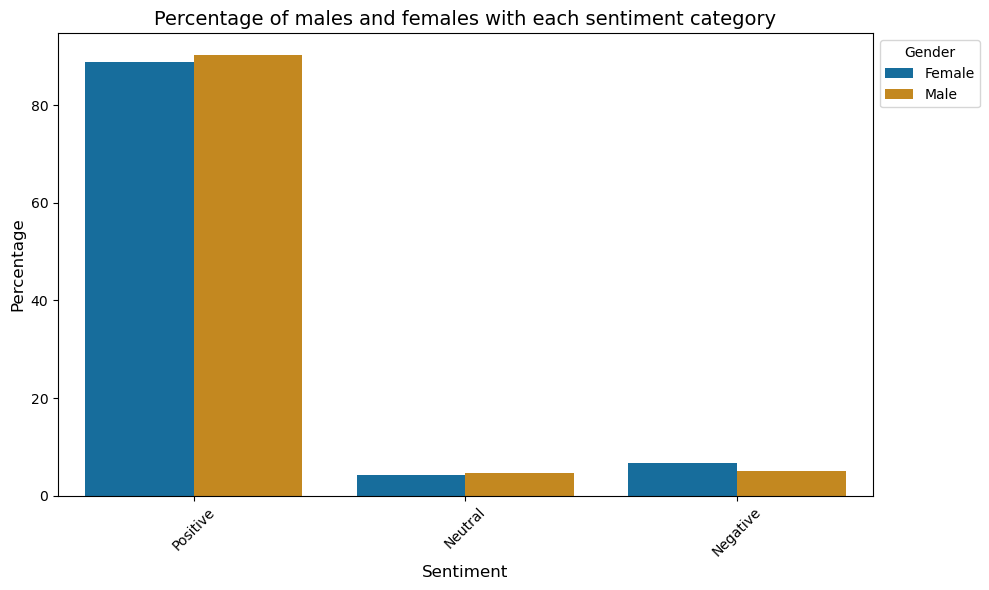

In [606]:
# Create a grouped bar plot.
grouped_bar_plot(sentiment_counts, "overall_sentiment_review", "percentage", "gender", 
                 title="Percentage of males and females with each sentiment category", 
                 xlabel="Sentiment", ylabel="Percentage", order=sentiment_order, legend_title="Gender")

***Interpretation of the plot:*** Very little difference in sentiment between males and females.

#### 25. Create a grouped bar chart for sentiment scores by education.

In [609]:
# Select just "education" and "overall_sentiment_review" column.
reviews_text_education = reviews_text[["education", "overall_sentiment_review"]]
reviews_text_education

,education,overall_sentiment_review
0,Graduate,Negative
1,Graduate,Negative
2,Graduate,Negative
3,Graduate,Negative
4,PhD,Negative
...,...,...
1975,Postgraduate,Positive
1976,Postgraduate,Positive
1977,Postgraduate,Positive
1978,Graduate,Positive


In [610]:
# Count sentiments
sentiment_counts2 = reviews_text_education.groupby(["overall_sentiment_review", "education"]).size().reset_index(name="count")

# Count of gender
education_totals = sentiment_counts2.groupby("education")["count"].sum().reset_index(name="total")

# Merge total counts back to the dataframe
sentiment_counts2 = sentiment_counts2.merge(education_totals, on="education")

# Calculate percentage
sentiment_counts2["percentage"] = (sentiment_counts2["count"] / sentiment_counts2["total"])*100

# View data frame
sentiment_counts2

,overall_sentiment_review,education,count,total,percentage
0,Negative,Completed school,12,185,6.486486
1,Negative,Graduate,61,896,6.808036
2,Negative,Not completed school,1,49,2.040816
3,Negative,PhD,29,453,6.401766
4,Negative,Postgraduate,16,397,4.030227
5,Neutral,Completed school,6,185,3.243243
6,Neutral,Graduate,45,896,5.022321
7,Neutral,Not completed school,1,49,2.040816
8,Neutral,PhD,20,453,4.415011
9,Neutral,Postgraduate,17,397,4.282116


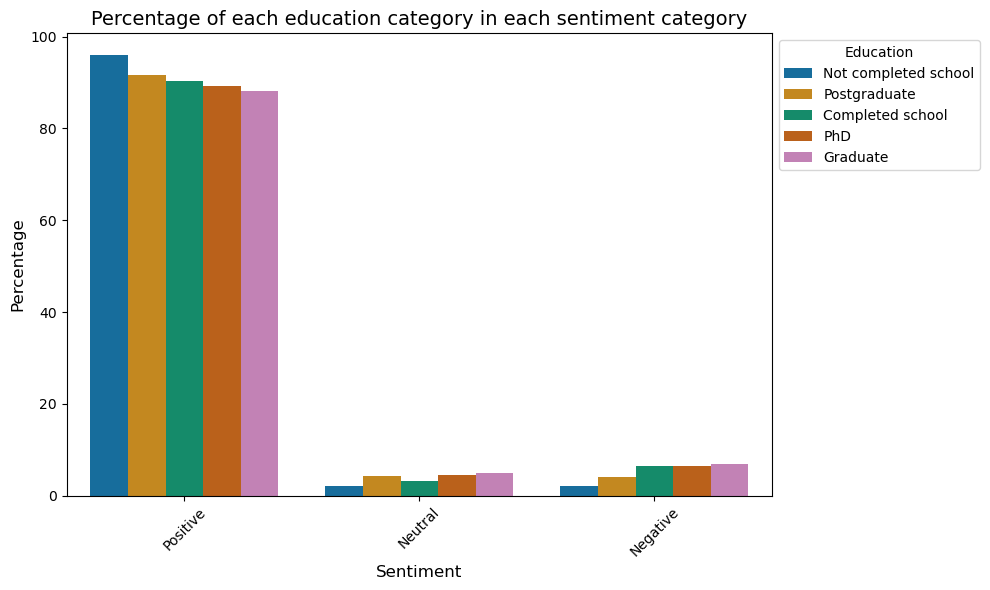

In [611]:
# Create a grouped bar plot.
sentiment_counts2.sort_values(by="percentage", ascending=False, inplace=True)

grouped_bar_plot(sentiment_counts2, "overall_sentiment_review", "percentage", "education", 
                 title="Percentage of each education category in each sentiment category", 
                 xlabel="Sentiment", ylabel="Percentage", order=sentiment_order, legend_title="Education", palette="colorblind")

***Interpretation of the plot***: There's not much difference in sentiment between the different education categories, but graduates have the most negative sentiment and those who haven't finished school have the most positive sentiment.

***Summary of the model:***
- ***What's good about the model?***: It's easily interpretable. We're able to use it to approximately determine the amount of positive and negative sentiment amongst a large range of text data. 
- ***What needs to be improved about the model?***: The accuracy of the model is roughly 80% which is ok but this means that approximately 1/5 of the time, the model will incorrectly classify the sentiment.